In [1]:
%matplotlib inline
import pandas as pd
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.gridspec as gridspec
import seaborn as sns
from scipy.interpolate import interp1d
from scipy.stats import stats

import itertools
import numpy as np
import matplotlib.pyplot as plt


from sklearn.metrics import confusion_matrix

from __future__ import print_function

from sklearn import datasets
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC

import numpy as np

from matplotlib.colors import ListedColormap
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.dummy import DummyClassifier

<a id='Réunion 2016.11.15'></a>

# Réunion 2016.11.15
* [Load feature and label](#Load feature and label)
* [Label processing](#Label processing)
* [Classification baseline: dummy clf ](#Classification baseline: dummy clf)

* [Performance comparison between different models](#Performance comparison between different models)
	* [svm: grid search	](#svm: grid search)
		* [confusion matrix](#confusion matrix)
		* [Roc](#Roc)
	* [random forest: grid search](#random forest: grid search)
		* [Cross validation result in detail](#Cross validation result in detail)
* [Feature selection](#Feature selection)
	* [Univariate feature selection](#Univariate feature selection)
	* [Recursive feature elimination](#Recursive feature elimination)
	* [Tree-based feature selection	](#Tree-based feature selection)
* [Manifold learning](#Manifold learning)
* [Performance comparison](#Performance comparison)
	* [different normalization, label binarization: all player	](#different normalization, label binarization: all player)
	* [different normalization, label binarization: professional player	](#different normalization, label binarization: professional player)
* [Performance event vs baseline music](#Performance event vs baseline music)
	* [Visualization of 2D feature space among individuals	](#Visualization of 2D feature space among individuals)
	* [Feature ranking based on statistic pvalue](#Feature ranking based on statistic pvalue)
	* [Subject ranking based on statistic pvalue](#Subject ranking based on statistic pvalue)
	* [Pairplot of selected feature](#Pairplot of selected feature)
* [Performance before event vs event](#Performance before event vs event)
* [LogisticRegression](#LogisticRegression)

<a id='Load feature and label'></a>
# Load feature and label

In [2]:
phyEventdf=pd.read_csv('./../out/feature/phyEvent20s.csv',encoding='utf-16',index_col='eventidx')
phyEventdf.head()

,ECG_raw_mean,ECG_raw_median,ECG_raw_max,ECG_raw_min,ECG_raw_vrange,ECG_raw_var,ECG_raw_stddev,ECG_raw_avgder,ECG_raw_maxgra,ECG_raw_absdev,...,Resp_Ampup_min,Resp_Ampup_vrange,Resp_Ampup_var,Resp_Ampup_stddev,Resp_Ampup_avgder,Resp_Ampup_maxgra,Resp_Ampup_absdev,Resp_Ampup_kurtosis,Resp_Ampup_skewness,sujet
eventidx,,,,,,,,,,,,,,,,,,,,,
18,-0.000283,-0.001822,1.370726,-0.431258,1.801984,0.053326,0.230924,3.358497e-07,0.092035,2013.541005,...,0.477971,0.206061,0.004314,0.065682,0.029437,0.182030,0.254333,6.905542,-2.566456,2
19,-0.000039,-0.002431,1.348619,-0.418519,1.767138,0.053849,0.232054,-1.396412e-07,0.091951,2055.372189,...,0.290033,0.430374,0.015263,0.123543,0.028964,0.249871,0.635559,2.328764,-0.811721,2
20,0.000031,-0.002300,1.337967,-0.423913,1.761880,0.054870,0.234243,-2.101085e-07,0.091337,2085.218872,...,0.436185,0.740344,0.099082,0.314772,0.120164,0.398535,1.690337,-1.378635,0.688368,2
21,0.000033,-0.002022,1.343254,-0.417289,1.760543,0.053120,0.230478,-1.212164e-07,0.092112,2051.387763,...,0.257379,0.119641,0.002030,0.045051,0.015274,0.091765,0.274823,-0.953447,-0.591387,2
22,-0.000035,-0.002278,1.356530,-0.422299,1.778829,0.051771,0.227532,5.204230e-08,0.093199,1998.051616,...,0.281053,0.106604,0.001293,0.035953,0.002755,0.106604,0.181916,1.023804,1.060649,2


In [3]:
phyEventNormdf=pd.read_csv('/home/wenlu/Documents/XPFIFA/out/feature/phy20s/phyEventNorm.csv',encoding='utf-16',index_col='eventidx')
phyEventNormdf.head()

,sujet,ECG_mean,ECG_median,ECG_max,ECG_min,ECG_vrange,ECG_var,ECG_std_dev,ECG_avg_der,ECG_max_gra,...,ResAmpup_max,ResAmpup_min,ResAmpup_vrange,ResAmpup_var,ResAmpup_std_dev,ResAmpup_avg_der,ResAmpup_max_gra,ResAmpup_abs_dev,ResAmpup_kurtosis,ResAmpup_skewness
eventidx,,,,,,,,,,,,,,,,,,,,,
18,2,-0.676255,0.017119,-1.789465,0.489156,-1.369097,-1.972292,-1.992517,0.646479,-2.047862,...,-0.754732,-0.103999,-0.938180,-0.551174,-0.927930,-0.123218,-0.731820,-0.953438,2.560772,-2.520112
19,2,-0.094325,-0.983920,-2.077616,0.630765,-1.632249,-1.873250,-1.886956,-0.115413,-2.066838,...,-0.718555,-0.559278,-0.644232,-0.519092,-0.727279,-0.127995,-0.624444,-0.706549,0.614415,-0.995620
20,2,0.071147,-0.768972,-2.216446,0.570811,-1.671956,-1.680142,-1.682600,-0.228325,-2.206339,...,-0.264912,-0.205224,-0.238035,-0.273489,-0.064140,0.792475,-0.389146,-0.023452,-0.962222,0.307639
21,2,0.076285,-0.311708,-2.147545,0.644436,-1.682052,-2.011211,-2.034140,-0.085891,-2.030301,...,-1.060074,-0.638381,-1.051429,-0.557868,-0.999473,-0.266165,-0.874688,-0.940169,-0.781403,-0.804197
22,2,-0.085260,-0.732947,-1.974493,0.588749,-1.543958,-2.266504,-2.309191,0.191727,-1.783428,...,-1.049494,-0.581031,-1.068513,-0.560027,-1.031024,-0.392518,-0.851201,-1.000337,0.059458,0.631071


In [4]:
phyEventSubdf=pd.read_csv('./../out/feature/phyEventSubdf.csv',encoding='utf-16',index_col='eventidx')
phyEventSubdf.head()

IOError: [Errno 2] No such file or directory: './../out/feature/phyEventSubdf.csv'

In [5]:
phyEventSubNormdf=pd.read_csv('/home/wenlu/Documents/XPFIFA/out/feature/phy20s/phyEventSubNorm.csv',encoding='utf-16',index_col='eventidx')
phyEventSubNormdf.head()

,sujet,ECG_mean,ECG_median,ECG_max,ECG_min,ECG_vrange,ECG_var,ECG_std_dev,ECG_avg_der,ECG_max_gra,...,EDA_to_min,EDA_to_vrange,EDA_to_var,EDA_to_std_dev,EDA_to_avg_der,EDA_to_max_gra,EDA_to_abs_dev,EDA_to_kurtosis,EDA_to_skewness,EDA_nbpks
eventidx,,,,,,,,,,,,,,,,,,,,,
18,2,-0.676255,0.017119,-1.789465,0.489156,-1.369097,-1.972292,-1.992517,0.646479,-2.047862,...,1.025521,0.437138,0.012632,0.437045,0.778770,0.858858,0.434437,0.229890,-0.874721,-0.406760
19,2,-0.094325,-0.983920,-2.077616,0.630765,-1.632249,-1.873250,-1.886956,-0.115413,-2.066838,...,0.218786,-0.835556,-0.454331,-0.840211,-0.339579,-0.721441,-0.840945,-0.744749,0.979076,0.357949
20,2,0.071147,-0.768972,-2.216446,0.570811,-1.671956,-1.680142,-1.682600,-0.228325,-2.206339,...,0.342794,0.756160,0.292299,0.804380,1.016383,1.007310,0.853434,-0.260328,-0.763318,-0.406760
21,2,0.076285,-0.311708,-2.147545,0.644436,-1.682052,-2.011211,-2.034140,-0.085891,-2.030301,...,-0.202951,0.264565,-0.125686,0.213662,0.650235,0.976064,0.154487,1.110910,-1.052476,-0.100876
22,2,-0.085260,-0.732947,-1.974493,0.588749,-1.543958,-2.266504,-2.309191,0.191727,-1.783428,...,-0.520184,-0.918475,-0.457457,-0.920523,-0.240534,-0.681347,-0.921159,-2.475732,0.063302,-0.253818


[back to content: 2016.11.15](#Réunion 2016.11.15)

<a id='Label processing'></a>
# Label processing 

In [5]:
dfAll = pd.read_csv('./../out/Allevent.txt',encoding='utf-16',index_col=0)
dfAll.head()

,sujet,match,Absolute_sec,event,emotions,arousal,valence
0,1,1,47637,rate,frustration,2.0,-1.0
1,1,1,47813,arret du gardien,colere,2.0,-1.0
2,1,1,47852,but,colere,2.0,-3.0
3,1,1,48157,tir,peur,1.0,-1.0
4,1,2,49632,arret du gardien,frustration,2.0,-2.0


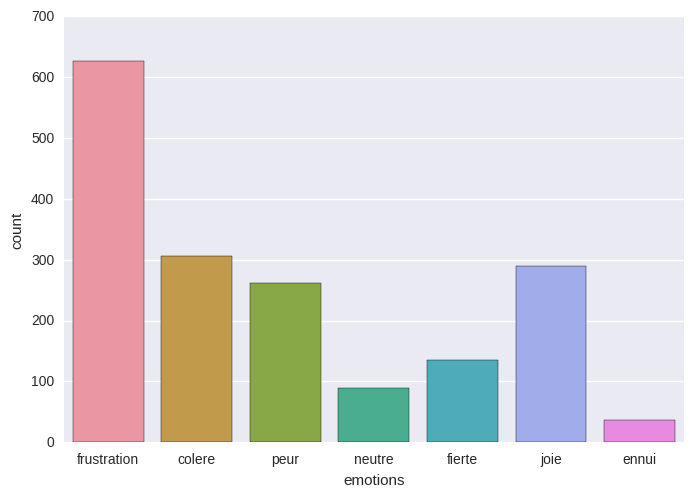

In [12]:
ax = sns.countplot(x="emotions",data=dfAll)

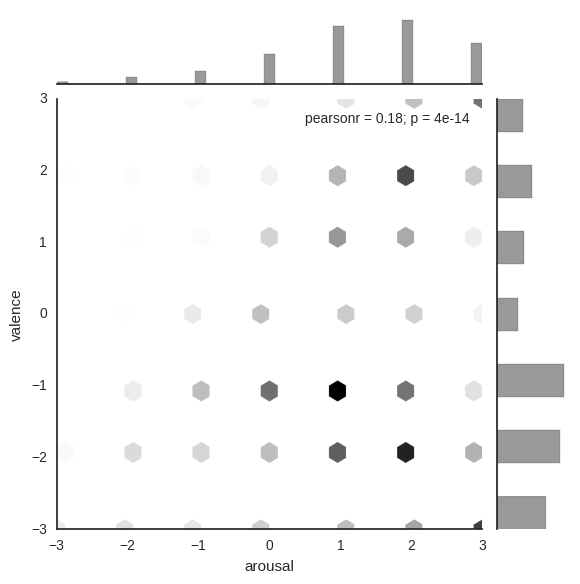

In [10]:
with sns.axes_style("white"):
    sns.jointplot(x='arousal', y='valence', data=dfAll,kind="hex", color="k");

In [6]:
eventLabel=pd.DataFrame()
eventLabel['eventidx']=dfAll.index
eventLabel['pos']=dfAll['valence'].map(lambda x: 1 if x >0 else 0)
eventLabel['high']=dfAll['arousal'].map(lambda x: 1 if x >1 else 0)
eventLabel.set_index('eventidx',inplace=True)

def threepart(x):
    if x<-1:
        return 0
    elif x>-2 and x<2:
        return 2
    else:
        return 1
eventLabel['pos_h']=dfAll['valence'].map(threepart)
eventLabel['high_h']=dfAll['arousal'].map(threepart)

#emolabels, emolevels = pd.factorize(dfAll['emotions'])
#eventLabel['emotions']=pd.Series(emolabels)
#eventlabels, eventlevels = pd.factorize(dfAll['event'])
#eventLabel['event']=pd.Series(eventlabels)
eventLabel['emotions']=dfAll['emotions']
eventLabel['event']=dfAll['event']
eventLabel.head()

,pos,high,pos_h,high_h,emotions,event
eventidx,,,,,,
0,0,1,2,1,frustration,rate
1,0,1,2,1,colere,arret du gardien
2,0,1,0,1,colere,but
3,0,0,2,2,peur,tir
4,0,1,0,1,frustration,arret du gardien


In [7]:
emo1hotdf=pd.DataFrame(np.zeros((1748,6)),columns=['fru','col','peur','fier','joie','ennu'])
emo1hotdf.loc[eventLabel['emotions']=='frustration','fru']=1
emo1hotdf.loc[eventLabel['emotions']=='colere','col']=1
emo1hotdf.loc[eventLabel['emotions']=='peur','peur']=1
emo1hotdf.loc[eventLabel['emotions']=='fierte','fier']=1
emo1hotdf.loc[eventLabel['emotions']=='joie','joie']=1
emo1hotdf.loc[eventLabel['emotions']=='ennui','ennu']=1
eventLabel=pd.concat([eventLabel,emo1hotdf],axis=1)
eventLabel.head()

,pos,high,pos_h,high_h,emotions,event,fru,col,peur,fier,joie,ennu
eventidx,,,,,,,,,,,,
0,0,1,2,1,frustration,rate,1.0,0.0,0.0,0.0,0.0,0.0
1,0,1,2,1,colere,arret du gardien,0.0,1.0,0.0,0.0,0.0,0.0
2,0,1,0,1,colere,but,0.0,1.0,0.0,0.0,0.0,0.0
3,0,0,2,2,peur,tir,0.0,0.0,1.0,0.0,0.0,0.0
4,0,1,0,1,frustration,arret du gardien,1.0,0.0,0.0,0.0,0.0,0.0


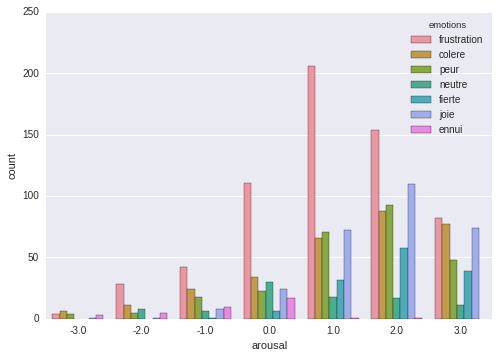

In [344]:
ax = sns.countplot(x="arousal", hue="emotions",data=dfAll)

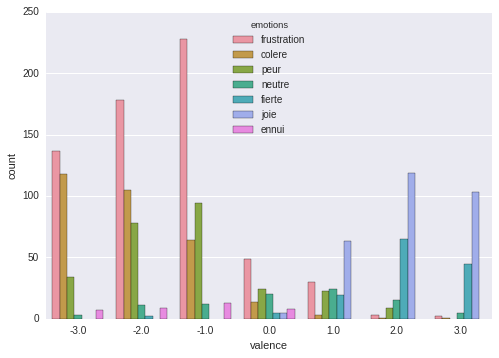

In [345]:
ax = sns.countplot(x="valence", hue="emotions",data=dfAll)

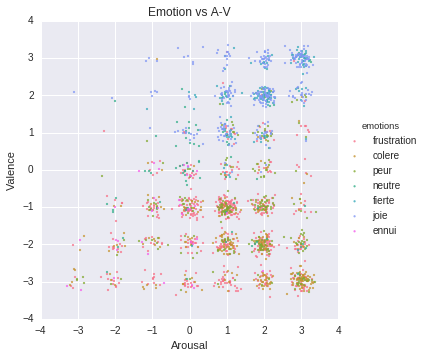

In [346]:
#sns.set_context("notebook", font_scale=1.1)
def rand_jitter(arr):
    stdev = .025*(max(arr)-min(arr))
    return arr + np.random.randn(len(arr)) * stdev

dfAll['arousalr']=rand_jitter(dfAll['arousal'])
dfAll['valencer']=rand_jitter(dfAll['valence'])

sns.color_palette("hls", 8)

sns.lmplot('arousalr', 'valencer', 
           data=dfAll, 
           fit_reg=False, 
           hue="emotions",  
           scatter_kws={"marker": "D", 
                        "s": 5})
plt.title('Emotion vs A-V')
plt.xlabel('Arousal')
plt.ylabel('Valence')


plt.show()

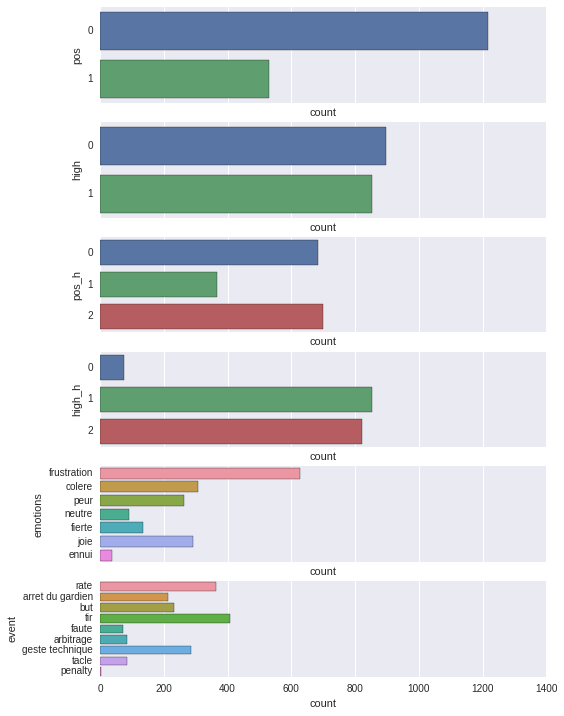

In [347]:
def labelscountfig(df):
    ncol=df.shape[1]
    f,axes = plt.subplots(ncol,1, sharex=True,figsize=(8,12))
    for i in range(ncol):
        #print(i)
        sns.countplot(y=df.columns.values[i], data=df,ax=axes[i])
labelscountfig(eventLabel)   

In [351]:
eventLabel.shape

(1748, 6)

<a id='Classification baseline: dummy clf'></a>
# Classification baseline: dummy clf 

In [354]:
X=phyEventSubNormdf # phyEventdf phyEventNormdf phyEventSubdf phyEventSubNormdf
Xn=X.dropna(axis=1,how='any')
y=eventLabel.ix[18:,'high']

In [356]:
Xn.shape

(1730, 119)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    Xn, y, test_size=0.2, random_state=0)

In [35]:
from sklearn.dummy import DummyClassifier
clf = DummyClassifier(strategy='stratified',random_state=0)
clf.fit(X_train, y_train)
clf.score(X_test, y_test)  

0.51083815028901736

In [36]:
from sklearn.dummy import DummyClassifier
clf = DummyClassifier(strategy='most_frequent',random_state=0)
clf.fit(X_train, y_train)
clf.score(X_test, y_test)  

0.48121387283236994

[back to content: 2016.11.15](#Réunion 2016.11.15)

<a id='Performance comparison between different models'></a>
# Performance comparison between different models

<a id='svm grid search'></a>
## svm: grid search

In [16]:
# Set the parameters by cross-validation
tuned_parameters = [{'kernel': ['rbf'], 'gamma': [1e-3, 1e-4],
                    'C': [1, 10, 100, 1000]},
                    {'kernel': ['linear']}]#, 'C': [1, 10, 100, 1000]}]

scores = ['precision']#'f1', 'recall']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    clf = GridSearchCV(SVC(C=1), tuned_parameters, cv=5,
                       scoring='%s_macro' % score)
    clf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for precision

Best parameters set found on development set:

{'kernel': 'rbf', 'C': 1, 'gamma': 0.0001}

Grid scores on development set:

0.559 (+/-0.042) for {'kernel': 'rbf', 'C': 1, 'gamma': 0.001}
0.567 (+/-0.028) for {'kernel': 'rbf', 'C': 1, 'gamma': 0.0001}
0.532 (+/-0.072) for {'kernel': 'rbf', 'C': 10, 'gamma': 0.001}
0.561 (+/-0.039) for {'kernel': 'rbf', 'C': 10, 'gamma': 0.0001}
0.508 (+/-0.055) for {'kernel': 'rbf', 'C': 100, 'gamma': 0.001}
0.552 (+/-0.059) for {'kernel': 'rbf', 'C': 100, 'gamma': 0.0001}
0.520 (+/-0.042) for {'kernel': 'rbf', 'C': 1000, 'gamma': 0.001}
0.527 (+/-0.079) for {'kernel': 'rbf', 'C': 1000, 'gamma': 0.0001}
0.517 (+/-0.045) for {'kernel': 'linear'}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

             precision    recall  f1-score   support

          0       0.58      0.72      0.64       180
          1       0.59      0

<a id='confusion matrix'></a>
### confusion matrix

In [332]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [ ]:
    
class_names=['non', 'oui']
    
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

<a id='Roc'></a>
### Roc

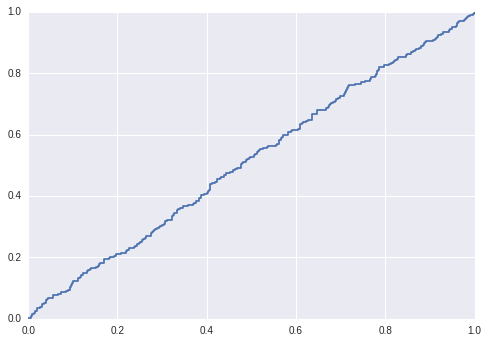

In [18]:

from sklearn.metrics import roc_curve, auc
random_state = np.random.RandomState(0)
classifier = svm.SVC(kernel='linear', probability=True,
                     random_state=random_state)
probas_= classifier.fit(X_train, y_train).predict_proba(X_test)
    # Compute ROC curve and area the curve
fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label='ROC (area = %0.2f)' %  roc_auc)    

<a id='random forest: grid search'></a>
## random forest: grid search

In [15]:
X_train

,sujet,ECG_mean,ECG_median,ECG_max,ECG_min,ECG_vrange,ECG_var,ECG_std_dev,ECG_avg_der,ECG_max_gra,...,ResNum,ResAmpup_mean,ResAmpup_max,ResAmpup_min,ResAmpup_vrange,ResAmpup_avg_der,ResAmpup_max_gra,ResAmpup_abs_dev,ResAmpup_kurtosis,ResAmpup_skewness
eventidx,,,,,,,,,,,,,,,,,,,,,
1729,58,-0.256206,1.150140,-0.597422,0.386377,-0.560040,-1.315830,-1.330511,-1.407680,-0.692534,...,0.000000,0.070731,-0.491271,-0.040996,-0.453981,0.248916,-0.407249,-0.566860,1.064211,-1.709945
402,14,-0.094799,-0.128259,0.723112,0.216256,0.318425,0.600547,0.617337,0.301427,0.658105,...,-0.422516,0.449458,0.814018,-0.018961,0.820415,0.202069,1.166059,0.532785,1.448025,1.217115
218,7,0.519230,0.022053,-0.274361,-0.066055,-0.012679,-0.320136,-0.302467,2.390882,-0.436028,...,-0.625679,-1.005299,-0.908814,-0.582565,-0.613377,-0.150304,-0.455287,-0.758068,0.948443,1.343232
1160,36,0.024144,1.482111,-0.132799,-0.022222,-0.100626,0.222367,0.252016,-0.336485,0.152100,...,0.294459,-0.719719,-0.728732,-0.387092,-0.625856,-0.259400,-0.538691,-0.615962,-0.402088,1.434688
83,3,0.388397,0.385551,0.185004,0.309967,-0.086511,-0.064651,-0.014092,1.632010,0.454294,...,-0.366936,0.397717,0.810733,-0.922622,1.474625,-0.482320,1.086370,0.339636,1.829714,-0.348747
1459,48,0.383515,-1.532146,-0.128752,-0.251491,0.051286,0.681510,0.723321,0.662326,0.194265,...,-0.452151,-0.526433,-0.465263,-0.597359,-0.389979,-0.077236,-0.303203,-0.536216,1.542618,1.481737
1575,53,-0.237883,-0.537403,1.873995,0.356390,1.023444,-1.325711,-1.341950,0.360039,2.172242,...,-0.971361,-0.464666,-0.119588,-0.766585,0.491905,1.095713,1.772993,0.185812,-0.423335,0.849007
1096,34,0.313585,0.360388,-0.342677,0.340426,-0.352194,-0.381822,-0.327216,-0.399652,-0.469536,...,0.597881,0.994411,0.675031,1.437047,0.007631,-0.977144,0.028647,0.398001,-0.705892,-0.229023
885,27,-1.058252,0.633425,-0.498063,0.064454,-0.243581,-0.801574,-0.811737,-0.434337,-0.090204,...,0.000000,-0.378615,-0.085046,-0.037309,-0.080775,-0.304608,0.200702,-0.347692,2.696267,2.145896


In [36]:
Xn=X.dropna(axis=1,how='any')
X.shape

In [13]:
import numpy as np

from time import time
from scipy.stats import randint as sp_randint

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.datasets import load_digits
from sklearn.ensemble import RandomForestClassifier


param_dist = {"max_depth": [3, None],
              "max_features": sp_randint(1, 11),
              "min_samples_split": sp_randint(1, 11),
              "min_samples_leaf": sp_randint(1, 11),
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}


# run grid search
n_iter_search = 20
random_search = RandomizedSearchCV(clf, param_distributions=param_dist,
                                   n_iter=n_iter_search)

start = time()
random_search.fit(Xn, y)
print("RandomizedSearchCV took %.2f seconds for %d candidates"
      " parameter settings." % ((time() - start), n_iter_search))
report(random_search.cv_results_)

ValueError: Invalid parameter bootstrap for estimator GridSearchCV. Check the list of available parameters with `estimator.get_params().keys()`.

In [122]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV


X_train, X_test, y_train, y_test = train_test_split(
    Xn, y, test_size=0.8, random_state=0)

clf = RandomForestClassifier(n_estimators=20,bootstrap=False,max_depth=3)
param_grid = {"max_features": [5, 10, 20],
              "n_estimators": [10, 20, 30, 40,50, 60]}
scores = ['precision']#'f1', 'recall']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    clf = GridSearchCV(clf, param_grid=param_grid, cv=10,
                       scoring='%s' % score)
    clf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()
    
    
# run grid search
#grid_search = GridSearchCV(clf, param_grid=param_grid,cv=10)

#grid_search.fit(Xn, y)



# Tuning hyper-parameters for precision

Best parameters set found on development set:

{'max_features': 10, 'n_estimators': 10}

Grid scores on development set:

0.536 (+/-0.149) for {'max_features': 5, 'n_estimators': 10}
0.550 (+/-0.099) for {'max_features': 5, 'n_estimators': 20}
0.579 (+/-0.149) for {'max_features': 5, 'n_estimators': 30}
0.552 (+/-0.154) for {'max_features': 5, 'n_estimators': 40}
0.571 (+/-0.131) for {'max_features': 5, 'n_estimators': 50}
0.547 (+/-0.159) for {'max_features': 5, 'n_estimators': 60}
0.584 (+/-0.199) for {'max_features': 10, 'n_estimators': 10}
0.540 (+/-0.223) for {'max_features': 10, 'n_estimators': 20}
0.544 (+/-0.155) for {'max_features': 10, 'n_estimators': 30}
0.547 (+/-0.124) for {'max_features': 10, 'n_estimators': 40}
0.532 (+/-0.211) for {'max_features': 10, 'n_estimators': 50}
0.536 (+/-0.147) for {'max_features': 10, 'n_estimators': 60}
0.564 (+/-0.294) for {'max_features': 20, 'n_estimators': 10}
0.525 (+/-0.122) for {'max_features':

## confusion matrix

Confusion matrix, without normalization
[[353 365]
 [294 372]]
Normalized confusion matrix
[[ 0.49  0.51]
 [ 0.44  0.56]]


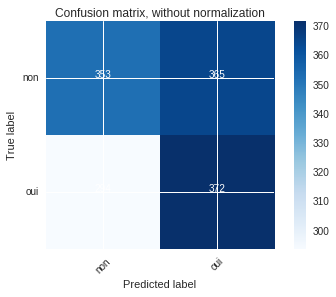

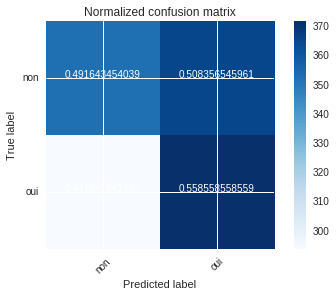

In [123]:
class_names=['non', 'oui']
    
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_true, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

<a id='Cross validation result in detail'></a>
### Cross validation result in detail

In [26]:
res=pd.DataFrame(clf.cv_results_)

In [27]:
res.head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_max_features,param_n_estimators,params,rank_test_score,split0_test_score,split0_train_score,...,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.031784,0.006092,0.551390,0.841090,5,10,"{u'max_features': 5, u'n_estimators': 10}",8,0.526316,0.761905,...,0.540000,0.834483,0.566667,0.933333,0.552632,0.879433,0.001015,0.000305,0.016767,0.060497
1,0.063343,0.011474,0.548211,0.834233,5,20,"{u'max_features': 5, u'n_estimators': 20}",10,0.510638,0.784884,...,0.600000,0.797546,0.585366,0.898649,0.485714,0.797468,0.002518,0.000521,0.043430,0.050381
2,0.088835,0.015918,0.539825,0.878798,5,30,"{u'max_features': 5, u'n_estimators': 30}",14,0.500000,0.806061,...,0.551020,0.888158,0.648649,0.962963,0.457143,0.894040,0.001062,0.000234,0.063654,0.052901
3,0.125858,0.021290,0.538406,0.895504,5,40,"{u'max_features': 5, u'n_estimators': 40}",16,0.512821,0.889610,...,0.627907,0.943262,0.555556,0.921429,0.473684,0.891892,0.014723,0.000638,0.051653,0.037735
4,0.145840,0.025922,0.550505,0.856925,5,50,"{u'max_features': 5, u'n_estimators': 50}",9,0.466667,0.811765,...,0.577778,0.838710,0.594595,0.896552,0.542857,0.917241,0.000241,0.000051,0.045366,0.042229


In [28]:
list(res.columns.values)

['mean_fit_time',
 'mean_score_time',
 'mean_test_score',
 'mean_train_score',
 'param_max_features',
 'param_n_estimators',
 'params',
 'rank_test_score',
 'split0_test_score',
 'split0_train_score',
 'split1_test_score',
 'split1_train_score',
 'split2_test_score',
 'split2_train_score',
 'split3_test_score',
 'split3_train_score',
 'split4_test_score',
 'split4_train_score',
 'std_fit_time',
 'std_score_time',
 'std_test_score',
 'std_train_score']

In [29]:
tmp=res[['param_max_features','param_n_estimators','mean_test_score']]
tmp.head()

,param_max_features,param_n_estimators,mean_test_score
0,5,10,0.551390
1,5,20,0.548211
2,5,30,0.539825
3,5,40,0.538406
4,5,50,0.550505


In [30]:
tmp.groupby('param_max_features')['mean_test_score'].mean()

param_max_features
5                     0.544590
10                    0.553819
20                    0.559789
Name: mean_test_score, dtype: float64

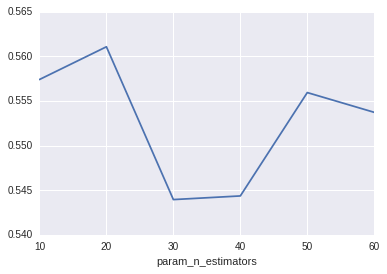

In [31]:
tmp.groupby('param_n_estimators')['mean_test_score'].mean().plot()
plt.show()

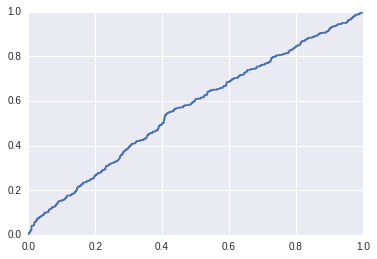

In [32]:
from sklearn.metrics import roc_curve, auc
random_state = np.random.RandomState(0)
classifier = RandomForestClassifier(n_estimators=20,max_features= 20,bootstrap=False,max_depth=3)
probas_= classifier.fit(X_train, y_train).predict_proba(X_test)
    # Compute ROC curve and area the curve
fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label='ROC (area = %0.2f)' %  roc_auc)    

[back to content: 2016.11.15](#Réunion 2016.11.15)

<a id='Feature selection'></a>
# Feature selection

In [21]:
X=phyEventNormdf # phyEventdf phyEventNormdf phyEventSubdf phyEventSubNormdf
Xn=X.dropna(axis=1,how='any')
y=eventLabel.ix[18:,'high']
Xn.describe()

NameError: name 'phyEventNormdf' is not defined

<a id='Univariate feature selection'></a>
## Univariate feature selection

In [110]:
#select Kbest
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
selector = SelectKBest(f_classif, k=20)
X_new=selector.fit_transform(Xn, y)
X_new.shape

(1730, 20)

In [111]:
selector.get_support()

array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False,  True, False,  True,
       False,  True,  True, False, False,  True, False, False,  True,
       False, False, False,  True, False,  True,  True,  True, False,
        True,  True, False, False, False, False,  True, False,  True,
       False,  True, False, False,  True, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [113]:
selectf=Xn.columns.values[selector.get_support()]

Xn_s=Xn[selectf]
del Xn_s['sujet']
Xn_s.head()

In [253]:
def RFGridsearchtest(Xn_s,y):
    X_train, X_test, y_train, y_test = train_test_split(
        Xn_s, y, test_size=0.8, random_state=0)

    clf = RandomForestClassifier(n_estimators=20,bootstrap=False,max_depth=3)
    param_grid = {"max_features": [5, 10, 15],
                  "n_estimators": [10, 20, 30, 40,50, 60]}
    scores = ['precision']#'f1', 'recall']

    for score in scores:
        print("# Tuning hyper-parameters for %s" % score)
        print()

        clf = GridSearchCV(clf, param_grid=param_grid, cv=10,
                           scoring='%s' % score)
        clf.fit(X_train, y_train)

        print("Best parameters set found on development set:")
        print()
        print(clf.best_params_)
        print()
        print("Grid scores on development set:")
        print()
        means = clf.cv_results_['mean_test_score']
        stds = clf.cv_results_['std_test_score']
        for mean, std, params in zip(means, stds, clf.cv_results_['params']):
            print("%0.3f (+/-%0.03f) for %r"
                  % (mean, std * 2, params))
        print()

        print("Detailed classification report:")
        print()
        print("The model is trained on the full development set.")
        print("The scores are computed on the full evaluation set.")
        print()
        y_true, y_pred = y_test, clf.predict(X_test)
        print(classification_report(y_true, y_pred))
        print()


    # run grid search
    #grid_search = GridSearchCV(clf, param_grid=param_grid,cv=10)

    #grid_search.fit(Xn, y)



In [125]:
RFGridsearchtest(Xn_s)

# Tuning hyper-parameters for precision

Best parameters set found on development set:

{'max_features': 5, 'n_estimators': 20}

Grid scores on development set:

0.579 (+/-0.154) for {'max_features': 5, 'n_estimators': 10}
0.607 (+/-0.165) for {'max_features': 5, 'n_estimators': 20}
0.567 (+/-0.133) for {'max_features': 5, 'n_estimators': 30}
0.552 (+/-0.159) for {'max_features': 5, 'n_estimators': 40}
0.563 (+/-0.144) for {'max_features': 5, 'n_estimators': 50}
0.581 (+/-0.120) for {'max_features': 5, 'n_estimators': 60}
0.578 (+/-0.162) for {'max_features': 10, 'n_estimators': 10}
0.566 (+/-0.156) for {'max_features': 10, 'n_estimators': 20}
0.572 (+/-0.169) for {'max_features': 10, 'n_estimators': 30}
0.581 (+/-0.155) for {'max_features': 10, 'n_estimators': 40}
0.562 (+/-0.119) for {'max_features': 10, 'n_estimators': 50}
0.563 (+/-0.103) for {'max_features': 10, 'n_estimators': 60}
0.577 (+/-0.242) for {'max_features': 15, 'n_estimators': 10}
0.573 (+/-0.280) for {'max_features': 

<a id='Recursive feature elimination'></a>
## Recursive feature elimination

Optimal number of features : 50


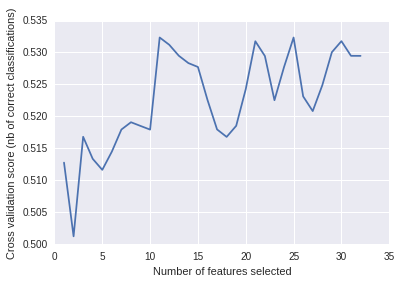

In [132]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification



# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring is proportional to the number of correct
# classifications
rfecv = RFECV(estimator=svc, step=5, cv=StratifiedKFold(5),
              scoring='accuracy')
rfecv.fit(Xn, y)

print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

In [10]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE

# Create the RFE object and rank each pixel
svc = SVC(kernel="linear", C=1)
rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
rfe.fit(Xn, y)

rfe.get_support()
selectf=Xn.columns.values[rfe.get_support()]

Xn_s=Xn[selectf]

In [11]:
np.save("../out/selectedfeature", selectf)

In [29]:
#loadselectf
selectfa=np.load("../out/selectedfeature.npy")
selectfv=np.load("../out/selectedfeaturevalence.npy")

In [10]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE
X=phyEventNormdf20n # phyEventdf phyEventNormdf phyEventSubdf phyEventSubNormdf
Xn=X.dropna(axis=1,how='any')
y=eventLabel.ix[18:,'pos']

svc = SVC(kernel="linear", C=1)
rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
rfe.fit(Xn, y)

rfe.get_support()
selectf=Xn.columns.values[rfe.get_support()]

Xn_s=Xn[selectf]

np.save("../out/selectedfeaturevalence", selectf)

In [246]:
RFGridsearchtest(Xn_s)

# Tuning hyper-parameters for precision

Best parameters set found on development set:

{'max_features': 5, 'n_estimators': 20}

Grid scores on development set:

0.544 (+/-0.126) for {'max_features': 5, 'n_estimators': 10}
0.579 (+/-0.119) for {'max_features': 5, 'n_estimators': 20}
0.542 (+/-0.174) for {'max_features': 5, 'n_estimators': 30}
0.572 (+/-0.191) for {'max_features': 5, 'n_estimators': 40}
0.536 (+/-0.131) for {'max_features': 5, 'n_estimators': 50}
0.570 (+/-0.133) for {'max_features': 5, 'n_estimators': 60}
0.555 (+/-0.174) for {'max_features': 10, 'n_estimators': 10}
0.537 (+/-0.172) for {'max_features': 10, 'n_estimators': 20}
0.552 (+/-0.164) for {'max_features': 10, 'n_estimators': 30}
0.549 (+/-0.134) for {'max_features': 10, 'n_estimators': 40}
0.539 (+/-0.175) for {'max_features': 10, 'n_estimators': 50}
0.540 (+/-0.163) for {'max_features': 10, 'n_estimators': 60}
0.564 (+/-0.202) for {'max_features': 15, 'n_estimators': 10}
0.548 (+/-0.187) for {'max_features': 

<a id='Tree-based feature selection'></a>
## Tree-based feature selection

Feature ranking:
1. feature 0 (0.017361)
2. feature 153 (0.007720)
3. feature 54 (0.007664)
4. feature 9 (0.007640)
5. feature 154 (0.007443)
6. feature 118 (0.007409)
7. feature 43 (0.007381)
8. feature 60 (0.007340)
9. feature 55 (0.007309)
10. feature 63 (0.007193)
11. feature 48 (0.007179)
12. feature 139 (0.007162)
13. feature 101 (0.007144)
14. feature 79 (0.007136)
15. feature 145 (0.007084)
16. feature 119 (0.007059)
17. feature 23 (0.007020)
18. feature 141 (0.006994)
19. feature 3 (0.006969)
20. feature 148 (0.006919)
21. feature 44 (0.006910)
22. feature 66 (0.006897)
23. feature 38 (0.006888)
24. feature 144 (0.006871)
25. feature 143 (0.006857)
26. feature 35 (0.006850)
27. feature 2 (0.006822)
28. feature 137 (0.006805)
29. feature 95 (0.006803)
30. feature 126 (0.006794)
31. feature 47 (0.006767)
32. feature 93 (0.006761)
33. feature 80 (0.006747)
34. feature 135 (0.006722)
35. feature 6 (0.006722)
36. feature 152 (0.006715)
37. feature 42 (0.006714)
38. feature 58 (0.00

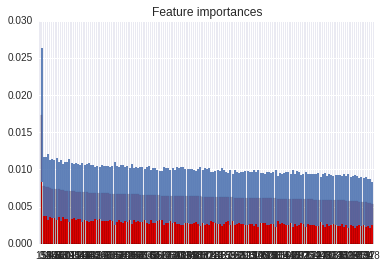

In [135]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier



# Build a forest and compute the feature importances
forest = ExtraTreesClassifier(n_estimators=250,
                              max_features=20,
                              random_state=0)

forest.fit(Xn, y)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(Xn.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(Xn.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(Xn.shape[1]), indices)
plt.xlim([-1, Xn.shape[1]])
plt.show()

In [140]:
Xn_s=Xn.iloc[:,indices[:20]]
del Xn_s['sujet']
Xn_s.head()

,ResAmpup_kurtosis,EMG_mean_f_s,ECG_max_gra,ResAmpup_skewness,EDA_nbpks,EMG_mean_f,EMG_max_gra_f_s,EMG_median_f_s,EMG_skewness_f_s,EMG_avg_der_f,RR_vrange,EDA_ph_de_avg_der,EDA_b2,ResNum,rsp_mean,IBI_avg_der,RR_max_gra,ECG_max,ResAmpup_min
eventidx,,,,,,,,,,,,,,,,,,,
18,2.560772,1.057728,-2.047862,-2.520112,-0.406760,1.949167,-0.929814,-0.164334,-0.053092,-0.097186,-1.253759,-0.075132,0.260943,0.491614,0.034727,-0.093437,-0.981529,-1.789465,-0.103999
19,0.614415,-0.111753,-2.066838,-0.995620,0.357949,0.449399,-1.052035,0.607995,0.363664,-0.840322,0.891706,0.323490,0.741966,0.491614,0.380362,-0.015553,0.033928,-2.077616,-0.559278
20,-0.962222,0.319108,-2.206339,0.307639,-0.406760,-0.479029,-0.845692,0.250406,-0.254062,-0.451408,-0.651945,0.589141,-0.838143,-1.608920,0.418766,0.677208,-0.737021,-2.216446,-0.205224
21,-0.781403,-0.275891,-2.030301,-0.804197,-0.100876,-0.657573,0.329999,1.381208,-0.996088,-0.754080,-1.129428,1.196091,-0.573332,0.491614,0.149939,-0.208214,-1.116371,-2.147545,-0.638381
22,0.059458,0.298591,-1.783428,0.631071,-0.253818,-0.621864,-1.096279,-0.615552,-0.101803,1.406929,-1.129428,0.914994,0.034779,0.491614,0.188342,0.333788,-0.950996,-1.974493,-0.581031


In [141]:
RFGridsearchtest(Xn_s)

# Tuning hyper-parameters for precision

Best parameters set found on development set:

{'max_features': 15, 'n_estimators': 30}

Grid scores on development set:

0.501 (+/-0.152) for {'max_features': 5, 'n_estimators': 10}
0.475 (+/-0.129) for {'max_features': 5, 'n_estimators': 20}
0.498 (+/-0.153) for {'max_features': 5, 'n_estimators': 30}
0.504 (+/-0.142) for {'max_features': 5, 'n_estimators': 40}
0.520 (+/-0.199) for {'max_features': 5, 'n_estimators': 50}
0.502 (+/-0.142) for {'max_features': 5, 'n_estimators': 60}
0.496 (+/-0.143) for {'max_features': 10, 'n_estimators': 10}
0.516 (+/-0.164) for {'max_features': 10, 'n_estimators': 20}
0.497 (+/-0.105) for {'max_features': 10, 'n_estimators': 30}
0.520 (+/-0.121) for {'max_features': 10, 'n_estimators': 40}
0.510 (+/-0.110) for {'max_features': 10, 'n_estimators': 50}
0.483 (+/-0.156) for {'max_features': 10, 'n_estimators': 60}
0.523 (+/-0.116) for {'max_features': 15, 'n_estimators': 10}
0.500 (+/-0.089) for {'max_features':

[back to content: 2016.11.15](#Réunion 2016.11.15)

<a id='Manifold learning'></a>
# Manifold learning

Isomap: 2.7 sec
MDS: 11 sec
SpectralEmbedding: 3 sec
t-SNE: 12 sec


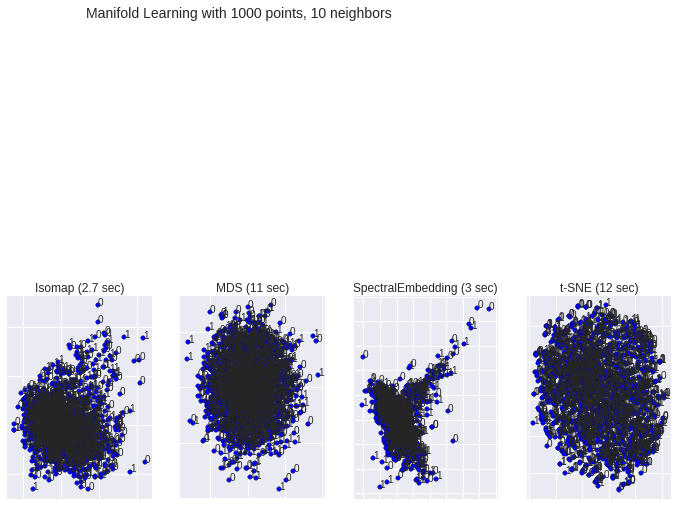

In [157]:
from time import time

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter

from sklearn import manifold, datasets

# Next line to silence pyflakes. This import is needed.
Axes3D

n_points = 1000
X, color = datasets.samples_generator.make_s_curve(n_points, random_state=0)
n_neighbors = 10
n_components = 2

fig = plt.figure(figsize=(15, 8))
plt.suptitle("Manifold Learning with %i points, %i neighbors"
             % (1000, n_neighbors), fontsize=14)



methods = ['standard', 'ltsa', 'hessian', 'modified']
labels = ['LLE', 'LTSA', 'Hessian LLE', 'Modified LLE']
'''
for i, method in enumerate(methods):
    t0 = time()
    Y = manifold.LocallyLinearEmbedding(n_neighbors, n_components,
                                        eigen_solver='auto',
                                        method=method).fit_transform(Xn_s)
    t1 = time()
    print("%s: %.2g sec" % (methods[i], t1 - t0))

    ax = fig.add_subplot(252 + i)
    plt.scatter(Y[:, 0], Y[:, 1])
    for j, txt in enumerate(Xn['sujet']):
        ax.annotate(txt, (Y[j, 0],Y[j, 1]))
    plt.title("%s (%.2g sec)" % (labels[i], t1 - t0))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    plt.axis('tight')
'''
t0 = time()
Y = manifold.Isomap(n_neighbors, n_components).fit_transform(Xn_s)
t1 = time()
print("Isomap: %.2g sec" % (t1 - t0))
ax = fig.add_subplot(257)
plt.scatter(Y[:, 0], Y[:, 1])
for j, txt in enumerate(y):
        ax.annotate(txt, (Y[j, 0],Y[j, 1]))
plt.title("Isomap (%.2g sec)" % (t1 - t0))
ax.xaxis.set_major_formatter(NullFormatter())
ax.yaxis.set_major_formatter(NullFormatter())
plt.axis('tight')


t0 = time()
mds = manifold.MDS(n_components, max_iter=100, n_init=1)
Y = mds.fit_transform(Xn_s)
t1 = time()
print("MDS: %.2g sec" % (t1 - t0))
ax = fig.add_subplot(258)
plt.scatter(Y[:, 0], Y[:, 1])
for j, txt in enumerate(y):
        ax.annotate(txt, (Y[j, 0],Y[j, 1]))
plt.title("MDS (%.2g sec)" % (t1 - t0))
ax.xaxis.set_major_formatter(NullFormatter())
ax.yaxis.set_major_formatter(NullFormatter())
plt.axis('tight')


t0 = time()
se = manifold.SpectralEmbedding(n_components=n_components,
                                n_neighbors=n_neighbors)
Y = se.fit_transform(Xn_s)
t1 = time()
print("SpectralEmbedding: %.2g sec" % (t1 - t0))
ax = fig.add_subplot(259)
plt.scatter(Y[:, 0], Y[:, 1])
for j, txt in enumerate(y):
        ax.annotate(txt, (Y[j, 0],Y[j, 1]))
plt.title("SpectralEmbedding (%.2g sec)" % (t1 - t0))
ax.xaxis.set_major_formatter(NullFormatter())
ax.yaxis.set_major_formatter(NullFormatter())
plt.axis('tight')

t0 = time()
tsne = manifold.TSNE(n_components=n_components, init='pca', random_state=0)
Y = tsne.fit_transform(Xn_s)
t1 = time()
print("t-SNE: %.2g sec" % (t1 - t0))
ax = fig.add_subplot(2, 5, 10)
plt.scatter(Y[:, 0], Y[:, 1])
for j, txt in enumerate(y):
        ax.annotate(txt, (Y[j, 0],Y[j, 1]))
plt.title("t-SNE (%.2g sec)" % (t1 - t0))
ax.xaxis.set_major_formatter(NullFormatter())
ax.yaxis.set_major_formatter(NullFormatter())
plt.axis('tight')

plt.show()

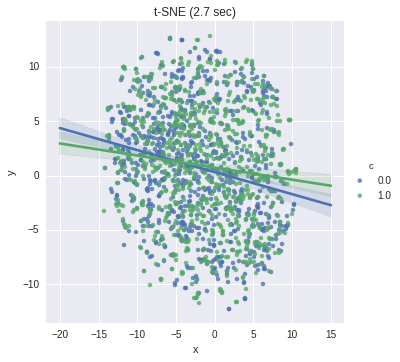

In [230]:
se = manifold.SpectralEmbedding(n_components=n_components,
                                n_neighbors=n_neighbors)
Y = se.fit_transform(Xn_s)
#print("t-SNE: %.2g sec" % (t1 - t0))

sns.lmplot('x', 'y', 
   data=Adf, 
   hue="c",  
   scatter_kws={"marker": "D", 
                "s": 20})
plt.title("t-SNE (%.2g sec)" % (t1 - t0))
plt.axis('tight')

plt.show()

[back to content: 2016.11.15](#Réunion 2016.11.15)

<a id='Performance comparison'></a>
# Performance comparison 

<a id='different normalization, label binarization: all player'></a>
## different normalization, label binarization: all player

In [359]:
X=phyEventSubNormdf # phyEventdf phyEventNormdf phyEventSubdf phyEventSubNormdf
Xn=X.dropna(axis=1,how='any')
y=eventLabel.ix[18:,'pos_h']

In [358]:
# number of high arousal examples
Xn.loc[y!=2,:].shape

(919, 119)

In [360]:
# number of high valence examples
Xn.loc[y!=2,:].shape

(1045, 119)

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.dummy import DummyClassifier

DF={#"phyEventdf":phyEventdf, 
    "phyEventNormdf":phyEventNormdf, 
    #"phyEventSubdf":phyEventSubdf, 
    "phyEventSubNormdf":phyEventSubNormdf}

names = ["DummyClassifier","Nearest Neighbors", "Linear SVM", 
         #"RBF SVM", 
         "Decision Tree",
         "Random Forest", "AdaBoost", "Naive Bayes", "Linear Discriminant Analysis",
         "Quadratic Discriminant Analysis"]
classifiers = [
    DummyClassifier(strategy='most_frequent',random_state=0),
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=1),
    #SVC(gamma=0.0001, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=20),
    AdaBoostClassifier(),
    GaussianNB(),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis()]

cmpclassifierdf=pd.DataFrame()
for DFname, X in DF.iteritems():
    print("=============")
    print(DFname)
    Xn=X.dropna(axis=1,how='any')
    Xn_s=Xn[selectf]
    y_all=eventLabel.ix[18:,:]
    for label_i in range(y_all.shape[1]-4):
        labelname=y_all.columns.values[label_i]
        print(' '+labelname)
        y=y_all.iloc[:,label_i]
        '''
        if labelname=='high_h' or labelname=='pos_h':
            Xn_s=Xn.loc[y!=2,selectf]
            y=y_all.loc[y!=2,labelname]
        '''
        for name, clf in zip(names, classifiers):
            print('   '+name)
            scores = cross_val_score(clf, Xn_s, y, cv=10)
            ncmp=pd.DataFrame({'DFname':DFname,'label':labelname,'classifier':name,'score':scores })
            cmpclassifierdf=cmpclassifierdf.append(ncmp)


    #print("{0:.3f} (std: {1:.3f})".format(scores.mean(),np.std(scores)))

phyEventSubNormdf
 pos
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis


/local/wenlu/anaconda2/lib/python2.7/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/local/wenlu/anaconda2/lib/python2.7/site-packages/sklearn/discriminant_analysis.py:695: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


 high
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis
phyEventNormdf
 pos
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis
 high
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis


In [31]:
selectfv

array([u'ECG_var', u'ECG_std_dev', u'EDA_var', u'EDA_std_dev',
       u'EDA_max_gra', u'EDA_abs_dev', u'EDA_ph_std_dev',
       u'EDA_ph_max_gra', u'EDA_ph_abs_dev', u'EDA_ph_de_max',
       u'EDA_to_mean', u'EDA_to_median', u'EDA_to_max', u'EDA_to_min',
       u'EDA_to_vrange', u'EDA_to_std_dev', u'EDA_to_abs_dev', u'rsp_var',
       u'rsp_std_dev', u'Resp_b0'], dtype=object)

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.dummy import DummyClassifier

DF={#"phyEventdf":phyEventdf, 
    "phyEventNormdf":phyEventNormdf, 
    #"phyEventSubdf":phyEventSubdf, 
    "phyEventSubNormdf":phyEventSubNormdf}

names = ["DummyClassifier","Nearest Neighbors", "Linear SVM", 
         #"RBF SVM", 
         "Decision Tree",
         "Random Forest", "AdaBoost", "Naive Bayes", "Linear Discriminant Analysis",
         "Quadratic Discriminant Analysis"]
classifiers = [
    DummyClassifier(strategy='most_frequent',random_state=0),
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=1),
    #SVC(gamma=0.0001, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=20),
    AdaBoostClassifier(),
    GaussianNB(),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis()]

cmpclassifiervaldf=pd.DataFrame()
for DFname, X in DF.iteritems():
    print("=============")
    print(DFname)
    Xn=X.dropna(axis=1,how='any')
    Xn_s=Xn[list(set(selectfv) & set(Xn.columns.values))]
    y_all=eventLabel.ix[18:,:]
    y=y_all.loc[:,'pos']
    for name, clf in zip(names, classifiers):
        print('   '+name)
        scores = cross_val_score(clf, Xn_s, y, cv=10)
        ncmp=pd.DataFrame({'DFname':DFname,'label':labelname,'classifier':name,'score':scores })
        cmpclassifiervaldf=cmpclassifiervaldf.append(ncmp)


    #print("{0:.3f} (std: {1:.3f})".format(scores.mean(),np.std(scores)))

phyEventSubNormdf
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis
phyEventNormdf
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis


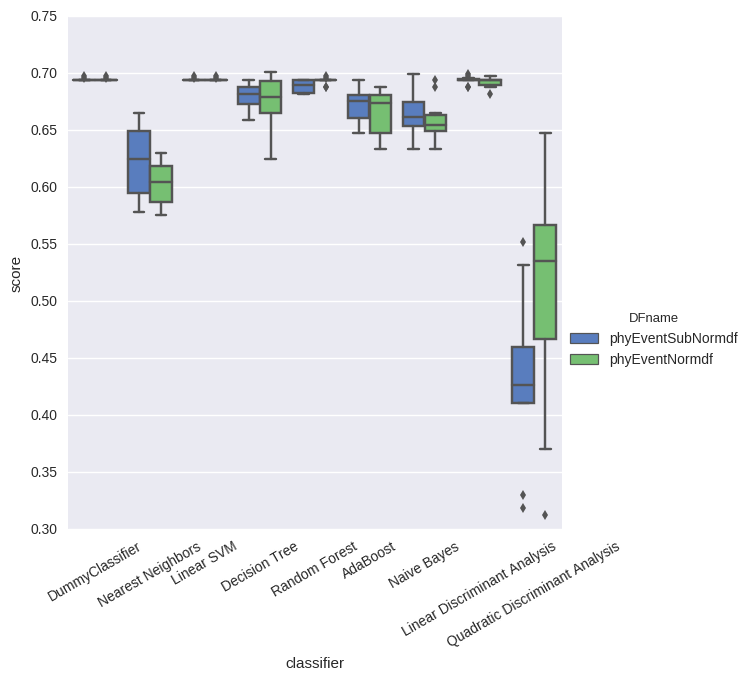

In [34]:
g = sns.factorplot(x="classifier", y="score", hue='DFname',data=cmpclassifiervaldf,
                   size=6, kind="box",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)
g.set_ylabels("score")

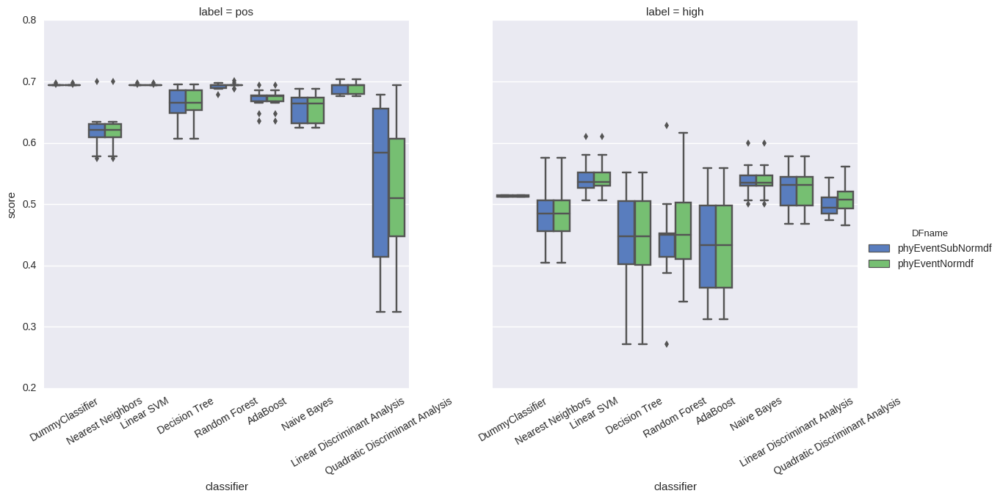

In [10]:
g = sns.factorplot(x="classifier", y="score", col='label',hue='DFname',data=cmpclassifierdf,
                   size=6, kind="box",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)
g.set_ylabels("score")
#plt.axhline(y=0.513, xmin=0, xmax=1, hold=None)

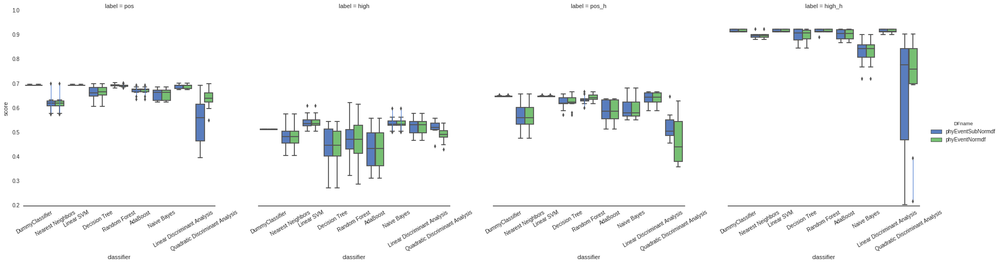

In [102]:
g = sns.factorplot(x="classifier", y="score", col='label',hue='DFname',data=cmpclassifierdf,
                   size=6, kind="box",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)
g.set_ylabels("score")
#plt.axhline(y=0.513, xmin=0, xmax=1, hold=None)

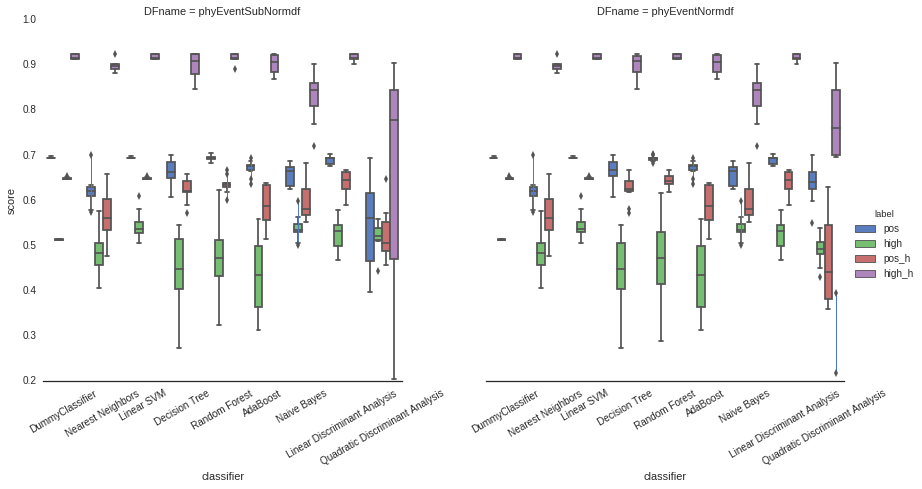

In [103]:
g = sns.factorplot(x="classifier", y="score", col='DFname',hue='label',data=cmpclassifierdf,
                   size=6, kind="box",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)
g.set_ylabels("score")
#plt.axhline(y=0.513, xmin=0, xmax=1, hold=None)

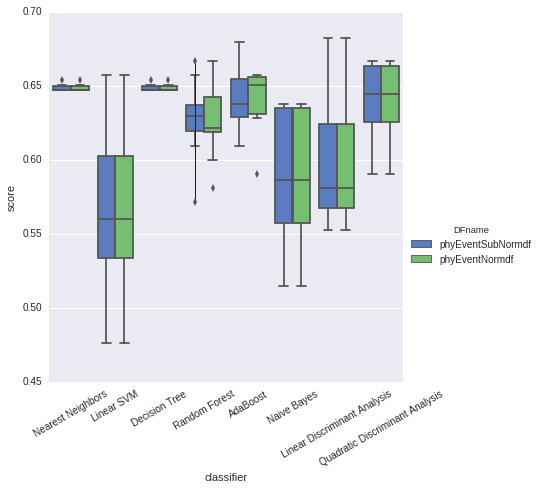

In [25]:
g = sns.factorplot(x="classifier", y="score", hue='DFname',data=dftmp_posh,
                   size=6, kind="box",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)
g.set_ylabels("score")
#plt.axhline(y=0.694, xmin=0, xmax=1, hold=None)

<a id='different normalization, label binarization: professional player'></a>
## different normalization, label binarization: professional player

In [1252]:
matinfo=pd.read_csv('./../out/matstaFeature.csv',encoding='utf-16')
matinfo.head()

,sujet,match,mitemps,niveausub,niveaumat,but,tirs,tirscadre,possession,tacles,fautes,cartonJaune,cartonRouge,blessure,horsjeu,corners,precisiontir,precisionpasses
0,1,1,1,1,2,-0.5,0.00,0.000000,-0.178218,0.000000,-0.500000,0.0,0,0,0.000000,0.000000,0.000000,-0.229167
1,1,2,1,1,1,0.0,-0.40,0.500000,-0.178218,-0.800000,0.000000,0.0,0,0,0.000000,0.000000,0.990099,0.000000
2,1,3,1,1,2,0.0,-0.40,0.500000,-0.039604,-0.285714,0.000000,0.0,0,0,0.000000,0.000000,0.990099,0.026144
3,2,1,1,4,3,0.0,0.00,0.500000,-0.178218,0.000000,0.000000,0.0,0,0,0.666667,0.000000,0.990099,-0.029070
4,2,2,1,4,5,0.0,-0.75,-0.666667,-0.178218,0.250000,0.666667,0.5,0,0,0.000000,-0.666667,-0.985075,-0.124224


In [1253]:
sujetdf=matinfo.groupby('sujet', as_index=False)['niveausub'].first()
sujetdf=pd.DataFrame(sujetdf)
sujetdf.head()

,sujet,niveausub
0,1,1
1,2,4
2,3,2
3,4,3
4,5,5


In [1254]:
profsub=sujetdf[sujetdf["niveausub"]>2]
begsub=sujetdf[sujetdf["niveausub"]<3]

In [12]:
#del beginner in phyEventdf
DF={"phyEventdf":phyEventdf, 
    "phyEventNormdf":phyEventNormdf, 
    "phyEventSubdf":phyEventSubdf, 
    "phyEventSubNormdf":phyEventSubNormdf}

for name, df in DF.iteritems():
    ndf=df[df['sujet'].isin(list(profsub['sujet']))]
    n_name='./../out/feature/pro_'+name
    ndf.to_csv(n_name,encoding='utf-16')

In [15]:
pro_phyEventNormdf=pd.read_csv('./../out/feature/pro_phyEventNormdf.csv',encoding='utf-16',index_col='eventidx')
pro_phyEventSubNormdf=pd.read_csv('./../out/feature/pro_phyEventSubNormdf.csv',encoding='utf-16',index_col='eventidx')

In [19]:
pro_phyEventSubNormdf.shape

(1311, 123)

In [22]:
pro_eventLabel.head()


,pos,high,pos_h,high_h,emotions,event
eventidx,,,,,,
18,0,1,0,1,frustration,arret du gardien
19,0,1,2,1,colere,arbitrage
20,1,1,1,1,peur,tir
21,0,0,2,2,frustration,rate
22,0,1,0,1,frustration,rate


In [17]:
pro_eventLabel=eventLabel.iloc[18:,:][phyEventNormdf['sujet'].isin(list(profsub['sujet']))]

In [21]:
pro_eventLabel.shape

(1311, 6)

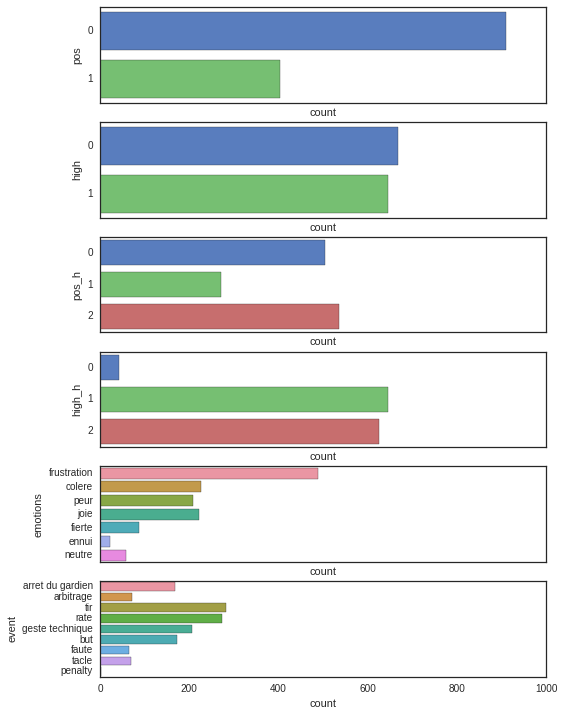

In [176]:
labelscountfig(pro_eventLabel)

In [23]:
#get plot of baseline performance of professional player
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.dummy import DummyClassifier


names = ["DummyClassifier","Nearest Neighbors", "Linear SVM", 
         #"RBF SVM", 
         "Decision Tree",
         "Random Forest", "AdaBoost", "Naive Bayes", "Linear Discriminant Analysis",
         "Quadratic Discriminant Analysis"]
classifiers = [
    DummyClassifier(strategy='most_frequent',random_state=0),
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=1),
    #SVC(gamma=0.0001, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=20),
    AdaBoostClassifier(),
    GaussianNB(),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis()]
n_DF={#"phyEventdf":phyEventdf, 
    "pro_phyEventNormdf":pro_phyEventNormdf, 
    #"phyEventSubdf":phyEventSubdf, 
    "pro_phyEventSubNormdf":pro_phyEventSubNormdf}

pro_cmpclassifierdf=pd.DataFrame()
for DFname, X in n_DF.iteritems():
    print("=============")
    print(DFname)
    Xn=X.dropna(axis=1,how='any')
    Xn_s=Xn[selectf]
    y_all=pro_eventLabel
    for label_i in range(y_all.shape[1]-2):
        labelname=y_all.columns.values[label_i]
        print(' '+labelname)
        y=y_all.iloc[:,label_i]
        if labelname=='high_h' or labelname=='pos_h':
            Xn_s=Xn.loc[y!=2,selectf]
            y=y_all.loc[y!=2,labelname]
        for name, clf in zip(names, classifiers):
            print('   '+name)
            scores = cross_val_score(clf, Xn_s, y, cv=10)
            ncmp=pd.DataFrame({'DFname':DFname,'label':labelname,'classifier':name,'score':scores })
            pro_cmpclassifierdf=pro_cmpclassifierdf.append(ncmp)


    #print("{0:.3f} (std: {1:.3f})".format(scores.mean(),np.std(scores)))

pro_phyEventSubNormdf
 pos
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis


/home/wenlu/.local/lib/python2.7/site-packages/sklearn/discriminant_analysis.py:389: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/home/wenlu/.local/lib/python2.7/site-packages/sklearn/discriminant_analysis.py:694: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


 high
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis
 pos_h
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis
 high_h
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis
pro_phyEventNormdf
 pos
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis
 high
   DummyClassifier
   Nearest Neighbors
   Linear SVM
   Decision Tree
   Random Forest
   AdaBoost
   Naive Bayes
   Linear Discriminant Analysis
   Quadratic Discriminant Analysis
 pos_h
   DummyClassifier
   Nearest Ne

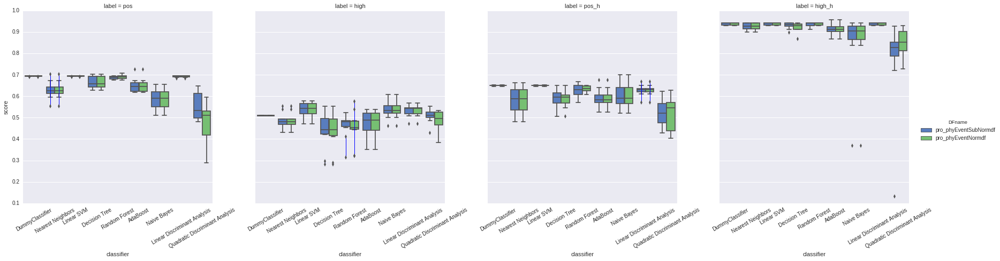

In [24]:
g = sns.factorplot(x="classifier", y="score", col='label',hue='DFname',data=pro_cmpclassifierdf,
                   size=6, kind="box",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)
g.set_ylabels("score")
#plt.axhline(y=0.513, xmin=0, xmax=1, hold=None)

[back to content: 2016.11.15](#Réunion 2016.11.15)

<a id='Performance event vs baseline music'></a>
# Performance event vs baseline music

In [48]:
phybasedf=pd.read_csv('./../out/feature/phyBaseRandom.csv',encoding='utf-16')

In [281]:
phyEventdf.head()

,sujet,ECG_mean,ECG_median,ECG_max,ECG_min,ECG_vrange,ECG_var,ECG_std_dev,ECG_avg_der,ECG_max_gra,...,ResAmpup_max,ResAmpup_min,ResAmpup_vrange,ResAmpup_var,ResAmpup_std_dev,ResAmpup_avg_der,ResAmpup_max_gra,ResAmpup_abs_dev,ResAmpup_kurtosis,ResAmpup_skewness
eventidx,,,,,,,,,,,,,,,,,,,,,
18,2,-0.000283,-0.001822,1.370726,-0.431258,1.801984,0.053326,0.230924,3.358497e-07,0.092035,...,0.684032,0.477971,0.206061,0.004314,0.065682,0.029437,0.182030,0.254333,6.905542,-2.566456
19,2,-0.000039,-0.002431,1.348619,-0.418519,1.767138,0.053849,0.232054,-1.396412e-07,0.091951,...,0.720407,0.290033,0.430374,0.015263,0.123543,0.028964,0.249871,0.635559,2.328764,-0.811721
20,2,0.000031,-0.002300,1.337967,-0.423913,1.761880,0.054870,0.234243,-2.101085e-07,0.091337,...,1.176530,0.436185,0.740344,0.099082,0.314772,0.120164,0.398535,1.690337,-1.378635,0.688368
21,2,0.000033,-0.002022,1.343254,-0.417289,1.760543,0.053120,0.230478,-1.212164e-07,0.092112,...,0.377020,0.257379,0.119641,0.002030,0.045051,0.015274,0.091765,0.274823,-0.953447,-0.591387
22,2,-0.000035,-0.002278,1.356530,-0.422299,1.778829,0.051771,0.227532,5.204230e-08,0.093199,...,0.387657,0.281053,0.106604,0.001293,0.035953,0.002755,0.106604,0.181916,1.023804,1.060649


In [82]:
Xb=pd.concat([phybasedf,phyEventdf],axis=0)
yb=np.array([0]*1730+[1]*1730)

In [123]:
c=pd.DataFrame(yb,columns=['cl'])
Xbn=Xb.iloc[:,:].reset_index(drop=True)
Xbn.tail()

,sujet,ECG_mean,ECG_median,ECG_max,ECG_min,ECG_vrange,ECG_var,ECG_std_dev,ECG_avg_der,ECG_max_gra,...,ResAmpup_max,ResAmpup_min,ResAmpup_vrange,ResAmpup_var,ResAmpup_std_dev,ResAmpup_avg_der,ResAmpup_max_gra,ResAmpup_abs_dev,ResAmpup_kurtosis,ResAmpup_skewness
3455,58,0.000067,-0.003608,1.374762,-0.458762,1.833523,0.045971,0.214410,-9.664997e-08,0.088504,...,0.140542,0.046065,0.094477,0.000940,0.030654,-0.005306,0.028419,0.189200,-0.470011,-0.457049
3456,58,-0.000271,-0.004561,1.363730,-0.448083,1.811813,0.046021,0.214526,1.048279e-06,0.088287,...,0.131114,0.092947,0.038167,0.000187,0.013658,-0.002362,0.015460,0.085222,-0.204897,-0.887996
3457,58,-0.000132,-0.004409,1.341337,-0.444747,1.786084,0.047144,0.217126,6.910957e-07,0.089187,...,0.167465,0.010139,0.157326,0.003816,0.061771,0.018457,0.108364,0.407351,-1.823329,0.277802
3458,58,0.000040,-0.003689,1.330533,-0.438726,1.769258,0.044336,0.210562,2.243319e-07,0.089381,...,0.166929,0.001406,0.165523,0.002482,0.049815,0.013330,0.078510,0.281400,0.879170,-0.418002
3459,58,0.000383,-0.003139,1.342150,-0.435423,1.777574,0.043001,0.207367,2.728175e-07,0.087950,...,0.125669,0.058225,0.067443,0.000721,0.026852,0.008024,0.033576,0.151238,-1.899212,0.044270


In [124]:
tmp=pd.concat([Xbn,c],axis=1)
tmp.head()

,sujet,ECG_mean,ECG_median,ECG_max,ECG_min,ECG_vrange,ECG_var,ECG_std_dev,ECG_avg_der,ECG_max_gra,...,ResAmpup_min,ResAmpup_vrange,ResAmpup_var,ResAmpup_std_dev,ResAmpup_avg_der,ResAmpup_max_gra,ResAmpup_abs_dev,ResAmpup_kurtosis,ResAmpup_skewness,cl
0,2,-0.000066,-0.001899,1.534833,-0.464670,1.999503,0.067692,0.260177,0.000000,0.104341,...,0.338890,0.353080,0.014490,0.120375,-0.029996,0.173104,0.665935,-0.739475,0.000358,0
1,2,0.001032,-0.002285,1.604667,-0.468799,2.073467,0.069647,0.263907,-0.000001,0.107080,...,0.336049,0.205566,0.004484,0.066966,-0.018233,0.096171,0.340835,0.513143,-0.482897,0
2,2,-0.000091,-0.002621,1.437901,-0.443753,1.881654,0.061593,0.248180,-0.000000,0.098369,...,0.580428,0.909915,0.125675,0.354506,-0.067721,0.447544,1.368768,1.664219,1.523291,0
3,2,0.000004,-0.003004,1.551898,-0.486462,2.038359,0.071010,0.266476,0.000001,0.104757,...,0.219152,3.372195,2.402515,1.550005,-0.005793,2.746660,9.184934,-2.094465,0.665642,0
4,2,-0.000242,-0.003501,1.435788,-0.453286,1.889074,0.064939,0.254831,0.000002,0.097593,...,0.302603,0.245463,0.005893,0.076763,0.029499,0.245463,0.409090,3.062336,-1.636613,0


In [134]:
from scipy import stats
tmpn=tmp.groupby('sujet').transform(lambda x: (x - x.mean()) / x.std())
tmpn=tmpn.drop('cl',axis=1)
tmpn1=pd.concat([tmp['sujet'],tmpn,tmp['cl']],axis=1)
tmpn1.head()


,sujet,ECG_mean,ECG_median,ECG_max,ECG_min,ECG_vrange,ECG_var,ECG_std_dev,ECG_avg_der,ECG_max_gra,...,ResAmpup_min,ResAmpup_vrange,ResAmpup_var,ResAmpup_std_dev,ResAmpup_avg_der,ResAmpup_max_gra,ResAmpup_abs_dev,ResAmpup_kurtosis,ResAmpup_skewness,cl
0,2,-0.122540,0.270695,0.408824,0.140947,0.156566,0.549591,0.551619,0.321603,0.720809,...,-0.271387,-0.494827,-0.356442,-0.481932,-0.472925,-0.514636,-0.417781,-0.697044,-0.164468,0
1,2,2.290423,-0.285240,1.359614,0.088586,0.768873,0.953974,0.937030,-0.979014,1.404998,...,-0.280239,-0.689933,-0.378920,-0.650926,-0.355492,-0.650377,-0.603992,-0.139561,-0.589578,0
2,2,-0.177291,-0.768227,-0.910906,0.406193,-0.819056,-0.712220,-0.688200,-0.136090,-0.771482,...,0.481379,0.241658,-0.106662,0.258894,-0.849527,-0.030411,-0.015211,0.372729,1.175222,0
3,2,0.032229,-1.319519,0.641160,-0.135380,0.478238,1.235917,1.202555,1.497938,0.824698,...,-0.644554,3.498336,5.008334,4.041633,-0.231312,4.026184,4.461740,-1.300087,0.420767,0
4,2,-0.509117,-2.034866,-0.939671,0.285310,-0.757628,-0.020080,-0.000895,3.107642,-0.965163,...,-0.384475,-0.637164,-0.375756,-0.619926,0.121006,-0.386964,-0.564897,0.994967,-1.604477,0


<a id='Visualization of 2D feature space among individuals'></a>
## Visualization of 2D feature space among individuals

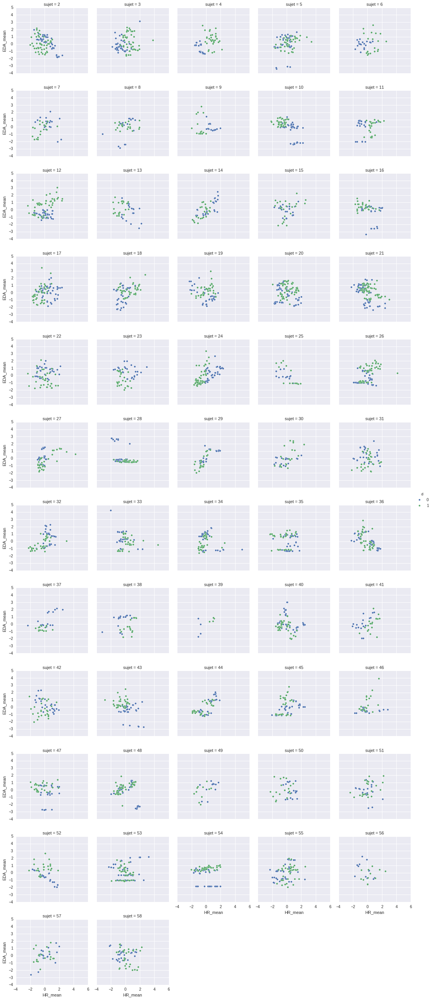

In [213]:
g = sns.FacetGrid(tmpn1, col="sujet",  hue="cl", col_wrap=5)
g = (g.map(plt.scatter, 'HR_mean','EDA_mean', edgecolor="w").add_legend())

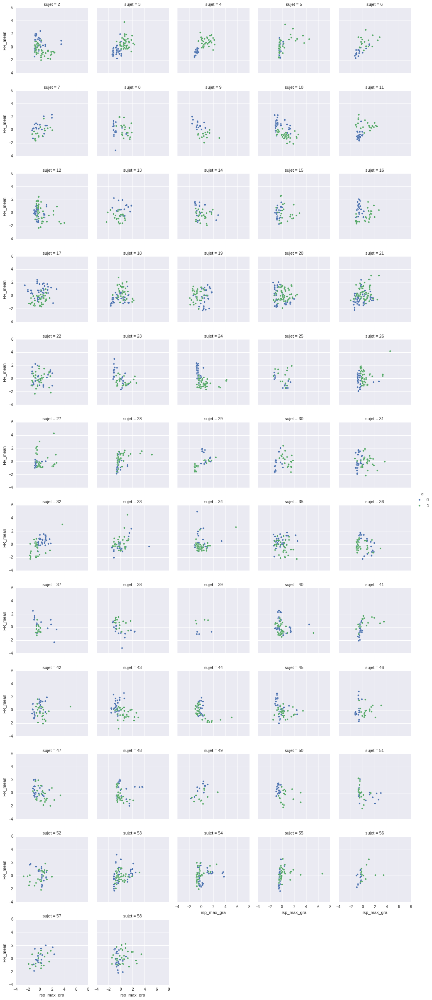

In [214]:
g = sns.FacetGrid(tmpn1, col="sujet",  hue="cl", col_wrap=5)
g = (g.map(plt.scatter, 'rsp_max_gra', 'HR_mean', edgecolor="w").add_legend())

In [182]:
np.array([sujet,i,sta,pvalue])

array([ 2.        ,  0.        , -0.23467052,  0.81498597])

In [190]:
eventbasediff=pd.DataFrame()
for sujet in np.arange(2,59):
    g0=tmpn1.ix[(tmpn1['sujet']==sujet) & (tmpn1['cl']==0),1:-1]
    g1=tmpn1.ix[(tmpn1['sujet']==sujet) & (tmpn1['cl']==1),1:-1]
    for i in np.arange(g0.shape[1]):
        res=stats.ttest_ind(g0.iloc[:,i], g1.iloc[:,i])
        sta=res.statistic
        pvalue=res.pvalue
        curr=pd.DataFrame([[sujet,i,sta,pvalue]],columns=['sujet','f_n','statistic','pvalue'])
        eventbasediff=eventbasediff.append(curr)

In [206]:
g0.head()

,ECG_mean,ECG_median,ECG_max,ECG_min,ECG_vrange,ECG_var,ECG_std_dev,ECG_avg_der,ECG_max_gra,ECG_abs_dev,...,ResAmpup_max,ResAmpup_min,ResAmpup_vrange,ResAmpup_var,ResAmpup_std_dev,ResAmpup_avg_der,ResAmpup_max_gra,ResAmpup_abs_dev,ResAmpup_kurtosis,ResAmpup_skewness
1700,0.076237,0.694120,0.520679,0.104022,0.194226,-0.117750,-0.099987,0.203792,0.218948,-1.259564,...,0.425036,-1.734178,1.621540,2.671494,2.288327,0.275103,3.152346,0.530214,1.320902,-1.704695
1701,0.480939,0.770014,0.349906,0.108014,0.103789,-0.949500,-0.953575,0.214748,0.006473,-1.816201,...,1.210777,1.459895,-0.038472,-0.152873,0.111594,-1.069577,-0.689195,-0.410565,0.680542,1.100215
1702,-0.546956,0.411316,0.166164,0.181795,-0.042262,-1.142252,-1.155510,-0.109104,-0.453062,-1.237451,...,0.146706,-1.508747,1.222087,2.159182,1.995623,-2.021796,-0.571267,1.608355,-1.542746,-0.517914
1703,0.282867,1.826270,0.997307,-0.164304,0.627055,2.020400,1.976655,-0.547333,1.151401,1.445452,...,-0.689364,1.083208,-1.371336,-0.770068,-1.332132,-0.179183,-1.145182,-1.299816,-0.839213,-1.426014
1704,0.781373,0.118707,0.626326,0.126914,0.232383,1.179326,1.178448,-0.712982,0.530853,0.813149,...,-0.035166,-1.602554,1.136542,0.919367,1.157007,0.398214,2.486127,0.333904,1.359364,-1.663538


<a id='Feature ranking based on statistic pvalue'></a>
## Feature ranking based on statistic pvalue

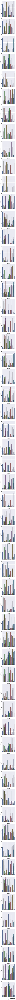

In [191]:
g = sns.factorplot(x="f_n", y='pvalue',row='sujet',data=eventbasediff,
                    kind="bar",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)


In [194]:
sigfea5=eventbasediff[eventbasediff.pvalue<0.05]
sigfea1=eventbasediff[eventbasediff.pvalue<0.01]

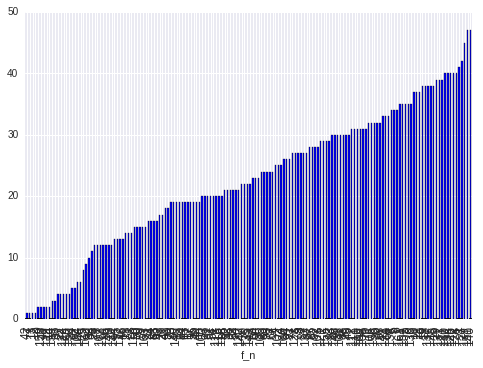

In [242]:
sigfea5.groupby('f_n')['sujet'].count().order().plot(kind='bar')
plt.show()

<a id='Subject ranking based on statistic pvalue'></a>
## Subject ranking based on statistic pvalue

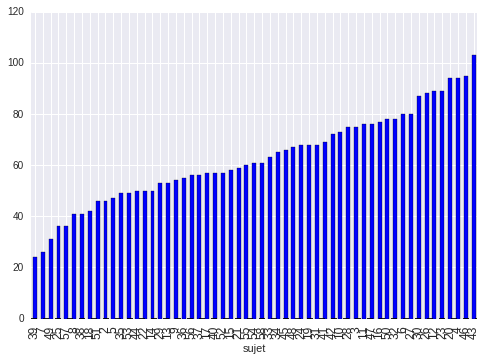

In [199]:
sigfea5.groupby('sujet')['f_n'].count().order().plot(kind='bar')
plt.show()

In [210]:
tenbestf.index.values

array([130, 134, 126, 142, 128,   1,  27, 139, 151, 140])

In [259]:
bestf=sigfea5.groupby('f_n')['sujet'].count().order()[-25:]

In [260]:
bestf

f_n
154    35
152    35
9      35
136    35
10     37
11     37
28     37
16     38
18     38
137    38
125    38
15     38
29     39
131    39
127    39
130    40
134    40
126    40
142    40
128    40
1      41
27     42
139    45
151    47
140    47
Name: sujet, dtype: int64

In [261]:
selectf=g0.columns.values[bestf.index.values]
selectf

array([u'ResAmpup_max', u'ResAmpup_mean', u'ECG_abs_dev', u'Resp_b2',
       u'ECG_kurtosis', u'ECG_skewness', u'HR_median', u'IBI_median',
       u'IBI_min', u'Resp_b3', u'rsp_min', u'IBI_mean', u'HR_max',
       u'rsp_abs_dev', u'rsp_var', u'rsp_max_gra', u'Resp_b0',
       u'rsp_vrange', u'RR_min', u'rsp_std_dev', u'ECG_median', u'HR_mean',
       u'RR_mean', u'ResNum', u'RR_median'], dtype=object)

In [262]:
tmpn1_fs=tmpn1[selectf]
tmpn1_fs['cl']=tmpn1.cl

In [263]:
tmpn1_fs.shape

(3460, 26)

<a id='Pairplot of selected feature'></a>
## Pairplot of selected feature

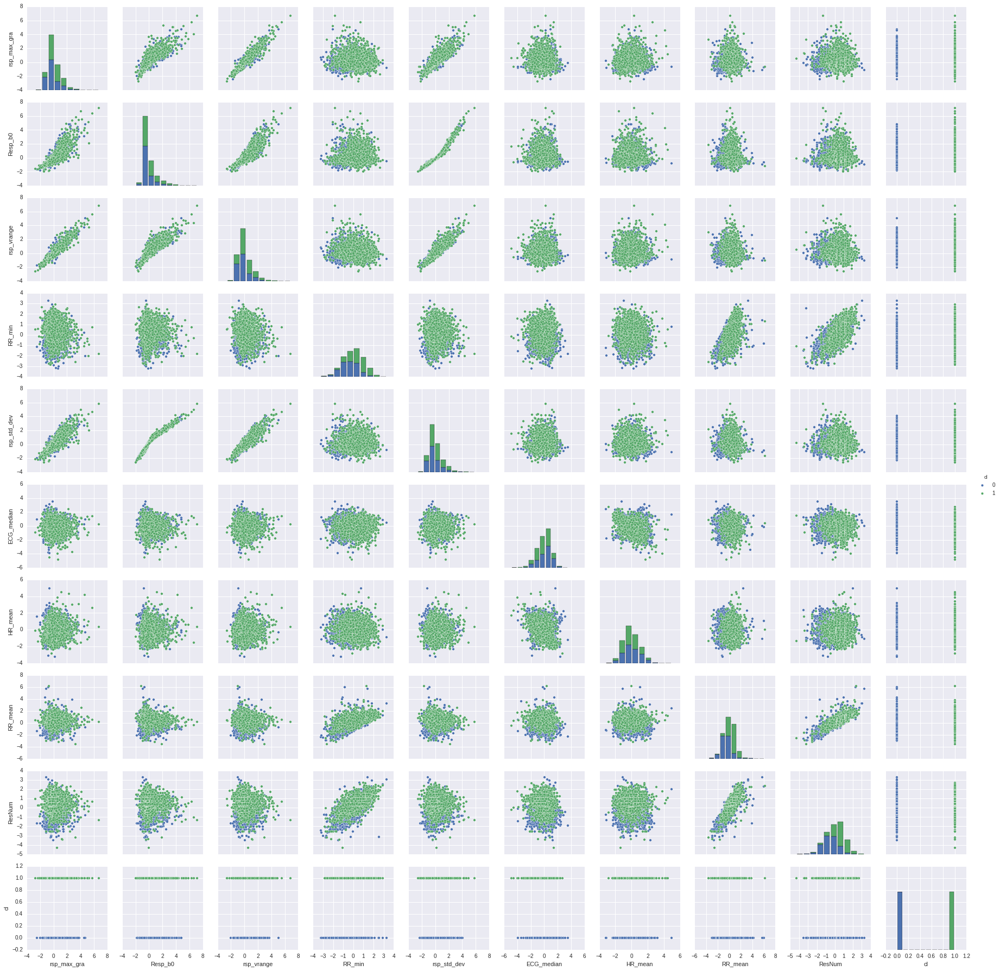

In [239]:
g = sns.pairplot(tmpn1_fs, hue="cl")

In [240]:
tmpn1_fs.head()

,rsp_max_gra,Resp_b0,rsp_vrange,RR_min,rsp_std_dev,ECG_median,HR_mean,RR_mean,ResNum,cl
0,-0.177144,-0.485901,-0.512129,0.799756,-0.539265,0.270695,-0.573723,1.244697,0.600969,0
1,-0.730813,-0.525983,-0.705629,0.059670,-0.658739,-0.285240,-0.165153,-0.679217,-1.491294,0
2,0.020316,-0.110939,0.256166,-2.179206,0.177526,-0.768227,1.259766,-2.721102,-1.491294,0
3,3.569939,2.705650,2.820431,-1.014180,2.495538,-1.319519,0.936454,0.704170,-1.491294,0
4,-0.684733,-0.492101,-0.678101,1.463936,-0.557640,-2.034866,1.641068,0.916378,0.600969,0


In [272]:
Xn=tmpn1.drop('cl',axis=1)
Xn=Xn.dropna(axis=1,how='any')
y=tmpn1.cl

In [247]:
Xn.shape

(3460, 155)

Feature ranking:
1. feature 145 (0.082600)
2. feature 136 (0.072193)
3. feature 138 (0.040010)
4. feature 137 (0.037464)
5. feature 134 (0.016727)
6. feature 142 (0.014903)
7. feature 130 (0.011688)
8. feature 105 (0.009693)
9. feature 152 (0.009361)
10. feature 127 (0.009315)
11. feature 120 (0.008684)
12. feature 0 (0.008625)
13. feature 139 (0.008590)
14. feature 118 (0.008353)
15. feature 2 (0.007563)
16. feature 121 (0.007560)
17. feature 122 (0.007464)
18. feature 82 (0.007399)
19. feature 123 (0.007389)
20. feature 84 (0.007324)
21. feature 135 (0.007063)
22. feature 94 (0.007027)
23. feature 128 (0.006783)
24. feature 89 (0.006774)
25. feature 72 (0.006568)
26. feature 93 (0.006413)
27. feature 141 (0.006277)
28. feature 117 (0.006247)
29. feature 83 (0.006206)
30. feature 46 (0.006110)
31. feature 76 (0.006073)
32. feature 96 (0.006043)
33. feature 149 (0.005957)
34. feature 77 (0.005956)
35. feature 125 (0.005835)
36. feature 144 (0.005630)
37. feature 7 (0.005595)
38. featur

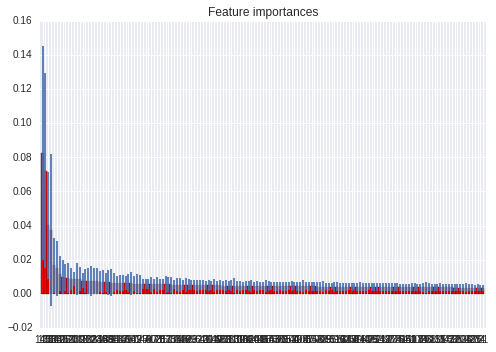

In [248]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier



# Build a forest and compute the feature importances
forest = ExtraTreesClassifier(n_estimators=250,
                              max_features=20,
                              random_state=0)

forest.fit(Xn, y)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(Xn.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(Xn.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(Xn.shape[1]), indices)
plt.xlim([-1, Xn.shape[1]])
plt.show()

In [274]:
a=selectf

In [275]:
b=Xn.columns.values[indices[:20]]

In [279]:
c=list(np.concatenate((a,b),axis=0))

In [280]:
from collections import Counter
Counter(c)

Counter({u'ECG_abs_dev': 1,
         u'ECG_kurtosis': 1,
         u'ECG_median': 2,
         u'ECG_skewness': 1,
         u'EDA_nbpks': 1,
         u'EDA_ph_de_skewness': 1,
         u'EDA_ph_max': 1,
         u'EDA_ph_mean': 1,
         u'HR_max': 1,
         u'HR_mean': 1,
         u'HR_median': 1,
         u'IBI_mean': 1,
         u'IBI_median': 1,
         u'IBI_min': 1,
         u'RR_abs_dev': 1,
         u'RR_max': 1,
         u'RR_mean': 2,
         u'RR_median': 1,
         u'RR_min': 2,
         u'RR_vrange': 1,
         u'ResAmpup_abs_dev': 1,
         u'ResAmpup_max': 1,
         u'ResAmpup_mean': 1,
         u'ResNum': 2,
         u'Resp_b0': 1,
         u'Resp_b2': 1,
         u'Resp_b3': 2,
         u'rsp_abs_dev': 1,
         u'rsp_max': 1,
         u'rsp_max_gra': 2,
         u'rsp_median': 1,
         u'rsp_min': 2,
         u'rsp_skewness': 1,
         u'rsp_std_dev': 1,
         u'rsp_var': 1,
         u'rsp_vrange': 2,
         u'sujet': 1})

In [249]:
Xn_s=Xn.iloc[:,indices[:20]]
Xn_s.head()

,ResNum,RR_mean,RR_min,RR_max,Resp_b3,RR_abs_dev,rsp_skewness,EDA_ph_de_skewness,ResAmpup_abs_dev,rsp_max_gra,rsp_median,sujet,RR_vrange,EDA_nbpks,ECG_median,rsp_max,rsp_min,EDA_ph_mean,rsp_vrange,EDA_ph_max
0,0.600969,1.244697,0.799756,1.721230,-0.316839,0.583264,0.352404,-0.193812,-0.417781,-0.177144,-0.342859,2,0.784491,-0.328911,0.270695,-0.542449,0.482299,-0.896027,-0.512129,-0.147098
1,-1.491294,-0.679217,0.059670,-0.432397,-0.566427,-0.539870,0.776585,0.419763,-0.603992,-0.730813,-0.625839,2,-0.359762,-0.328911,-0.285240,-0.706991,0.692804,0.483554,-0.705629,-0.253285
2,-1.491294,-2.721102,-2.179206,-1.472988,-0.453570,0.751209,-0.560084,1.634946,-0.015211,0.020316,-0.141360,2,0.261889,-0.328911,-0.768227,0.332436,-0.198496,0.545225,0.256166,0.463091
3,-1.491294,0.704170,-1.014180,1.576159,3.586626,2.234012,-2.460643,1.291954,4.461740,3.569939,2.411750,2,1.808775,-0.472714,-1.319519,2.634790,-2.902858,1.949335,2.820431,1.937159
4,0.600969,0.916378,1.463936,-0.432397,-0.281426,-1.033386,0.238568,-0.704988,-0.564897,-0.684733,0.456220,2,-1.236481,0.102498,-2.034866,-0.700143,0.651270,-0.006560,-0.678101,-0.711996


In [258]:
RFGridsearchtest(Xn_s,y)

# Tuning hyper-parameters for precision

Best parameters set found on development set:

{'max_features': 10, 'n_estimators': 10}

Grid scores on development set:

0.799 (+/-0.086) for {'max_features': 5, 'n_estimators': 10}
0.800 (+/-0.112) for {'max_features': 5, 'n_estimators': 20}
0.802 (+/-0.064) for {'max_features': 5, 'n_estimators': 30}
0.801 (+/-0.088) for {'max_features': 5, 'n_estimators': 40}
0.799 (+/-0.081) for {'max_features': 5, 'n_estimators': 50}
0.811 (+/-0.102) for {'max_features': 5, 'n_estimators': 60}
0.816 (+/-0.114) for {'max_features': 10, 'n_estimators': 10}
0.800 (+/-0.091) for {'max_features': 10, 'n_estimators': 20}
0.803 (+/-0.115) for {'max_features': 10, 'n_estimators': 30}
0.811 (+/-0.108) for {'max_features': 10, 'n_estimators': 40}
0.807 (+/-0.096) for {'max_features': 10, 'n_estimators': 50}
0.809 (+/-0.093) for {'max_features': 10, 'n_estimators': 60}
0.809 (+/-0.103) for {'max_features': 15, 'n_estimators': 10}
0.810 (+/-0.091) for {'max_features':

In [264]:
Xn=tmpn1_fs.drop('cl',axis=1)
Xn=Xn.dropna(axis=1,how='any')
y=tmpn1_fs.cl

In [265]:
RFGridsearchtest(Xn,y)

# Tuning hyper-parameters for precision

Best parameters set found on development set:

{'max_features': 5, 'n_estimators': 10}

Grid scores on development set:

0.824 (+/-0.049) for {'max_features': 5, 'n_estimators': 10}
0.811 (+/-0.076) for {'max_features': 5, 'n_estimators': 20}
0.811 (+/-0.068) for {'max_features': 5, 'n_estimators': 30}
0.814 (+/-0.083) for {'max_features': 5, 'n_estimators': 40}
0.813 (+/-0.064) for {'max_features': 5, 'n_estimators': 50}
0.814 (+/-0.062) for {'max_features': 5, 'n_estimators': 60}
0.823 (+/-0.102) for {'max_features': 10, 'n_estimators': 10}
0.809 (+/-0.079) for {'max_features': 10, 'n_estimators': 20}
0.805 (+/-0.079) for {'max_features': 10, 'n_estimators': 30}
0.809 (+/-0.088) for {'max_features': 10, 'n_estimators': 40}
0.808 (+/-0.089) for {'max_features': 10, 'n_estimators': 50}
0.810 (+/-0.089) for {'max_features': 10, 'n_estimators': 60}
0.807 (+/-0.081) for {'max_features': 15, 'n_estimators': 10}
0.806 (+/-0.092) for {'max_features': 

In [266]:
Xn=tmpn1.drop('cl',axis=1)
Xn=Xn.dropna(axis=1,how='any')
y=tmpn1.cl
RFGridsearchtest(Xn,y)

# Tuning hyper-parameters for precision

Best parameters set found on development set:

{'max_features': 10, 'n_estimators': 40}

Grid scores on development set:

0.770 (+/-0.094) for {'max_features': 5, 'n_estimators': 10}
0.782 (+/-0.071) for {'max_features': 5, 'n_estimators': 20}
0.801 (+/-0.074) for {'max_features': 5, 'n_estimators': 30}
0.787 (+/-0.079) for {'max_features': 5, 'n_estimators': 40}
0.801 (+/-0.075) for {'max_features': 5, 'n_estimators': 50}
0.799 (+/-0.071) for {'max_features': 5, 'n_estimators': 60}
0.789 (+/-0.106) for {'max_features': 10, 'n_estimators': 10}
0.814 (+/-0.086) for {'max_features': 10, 'n_estimators': 20}
0.791 (+/-0.066) for {'max_features': 10, 'n_estimators': 30}
0.817 (+/-0.109) for {'max_features': 10, 'n_estimators': 40}
0.812 (+/-0.100) for {'max_features': 10, 'n_estimators': 50}
0.804 (+/-0.120) for {'max_features': 10, 'n_estimators': 60}
0.791 (+/-0.119) for {'max_features': 15, 'n_estimators': 10}
0.806 (+/-0.116) for {'max_features':

[back to content: 2016.11.15](#Réunion 2016.11.15)

<a id='Performance before event vs event'></a>
## Performance before event vs event

In [543]:
phyEvent=pd.read_csv('./../out/feature/phy20s/phyEvent20s.csv',encoding='utf-16',index_col='eventidx')
phyBeforeEvent=pd.read_csv('./../out/feature/phy20s/phyBeforeEvent.csv',encoding='utf-16',index_col='eventidx')

dfAll=dfAll[18:]
sepevent=dfAll.loc[~np.insert((np.diff(dfAll.iloc[:,2])<30)&(np.abs(np.diff(dfAll.iloc[:,2]))<3933),0,False)]
sepevent.index

X=pd.concat([phyEvent.loc[sepevent.index],phyBeforeEvent.loc[sepevent.index]],ignore_index=True)
Xn=X.groupby('sujet').transform(lambda x: (x - x.mean()) / x.std())
nl=len(phyEvent.loc[sepevent.index])
y=np.array([1]*nl+[0]*nl)
y=pd.DataFrame(y,columns=['cl'])
Xn1=Xn.dropna(axis=1,how='any')
y=y.cl
RFGridsearchtest(Xn1,y)

In [302]:
# all the event vs no event (without eliminate the overlapping events)
X=pd.concat([phyEvent,phyBeforeEvent],ignore_index=True)
Xn=X.groupby('sujet').transform(lambda x: (x - x.mean()) / x.std())
nl=len(phyEvent)
y=np.array([1]*nl+[0]*nl)
y=pd.DataFrame(y,columns=['cl'])
Xn1=Xn.dropna(axis=1,how='any')
y=y.cl
RFGridsearchtest(Xn1,y)

# Tuning hyper-parameters for precision

Best parameters set found on development set:

{'max_features': 5, 'n_estimators': 30}

Grid scores on development set:

0.598 (+/-0.095) for {'max_features': 5, 'n_estimators': 10}
0.595 (+/-0.124) for {'max_features': 5, 'n_estimators': 20}
0.618 (+/-0.139) for {'max_features': 5, 'n_estimators': 30}
0.594 (+/-0.109) for {'max_features': 5, 'n_estimators': 40}
0.605 (+/-0.132) for {'max_features': 5, 'n_estimators': 50}
0.589 (+/-0.096) for {'max_features': 5, 'n_estimators': 60}
0.570 (+/-0.098) for {'max_features': 10, 'n_estimators': 10}
0.581 (+/-0.156) for {'max_features': 10, 'n_estimators': 20}
0.563 (+/-0.101) for {'max_features': 10, 'n_estimators': 30}
0.581 (+/-0.111) for {'max_features': 10, 'n_estimators': 40}
0.603 (+/-0.127) for {'max_features': 10, 'n_estimators': 50}
0.582 (+/-0.089) for {'max_features': 10, 'n_estimators': 60}
0.569 (+/-0.091) for {'max_features': 15, 'n_estimators': 10}
0.577 (+/-0.068) for {'max_features': 

<a id=''></a>
## Visualize individual differences 

In [306]:
Xnt=pd.concat([X.sujet,Xn1,y],axis=1)
Xnt.head()

,ECG_abs_dev,ECG_avg_der,ECG_b0,ECG_b1,ECG_b2,ECG_kurtosis,ECG_max,ECG_max_gra,ECG_mean,ECG_median,...,rsp_max,rsp_max_gra,rsp_mean,rsp_median,rsp_min,rsp_skewness,rsp_std_dev,rsp_var,rsp_vrange,cl
0,-2.103014,0.256039,-0.247186,-0.238507,-0.253509,0.101876,-1.738101,-1.856145,-0.504505,-0.021023,...,-0.735164,-0.741408,0.088750,0.362783,0.698282,0.343175,-0.506048,-0.517648,-0.720897,1
1,-1.683847,-0.221310,-0.376348,-0.363965,-0.374254,-1.106348,-2.012970,-1.872712,-0.022466,-1.051263,...,-0.699529,-0.606414,0.407573,-0.360173,0.633613,0.487462,-0.640734,-0.572177,-0.667660,1
2,-1.384770,-0.292053,-0.356956,-0.361362,-0.345069,-1.754430,-2.145401,-1.994502,0.114602,-0.830046,...,-0.245397,0.070027,0.442998,0.383098,-0.016172,-1.014328,-0.208072,-0.366312,-0.092688,1
3,-1.723773,-0.202813,-0.373398,-0.365870,-0.362880,-1.105912,-2.079676,-1.840813,0.118858,-0.359443,...,-1.040106,-1.002730,0.195025,0.251006,0.886886,0.413519,-0.952574,-0.665274,-0.959950,1
4,-2.258225,-0.028877,-0.375890,-0.363951,-0.374257,-0.283695,-1.914600,-1.625283,-0.014958,-0.792969,...,-1.029656,-1.073879,0.230449,0.098264,0.926982,0.521608,-0.978683,-0.670968,-0.979393,1


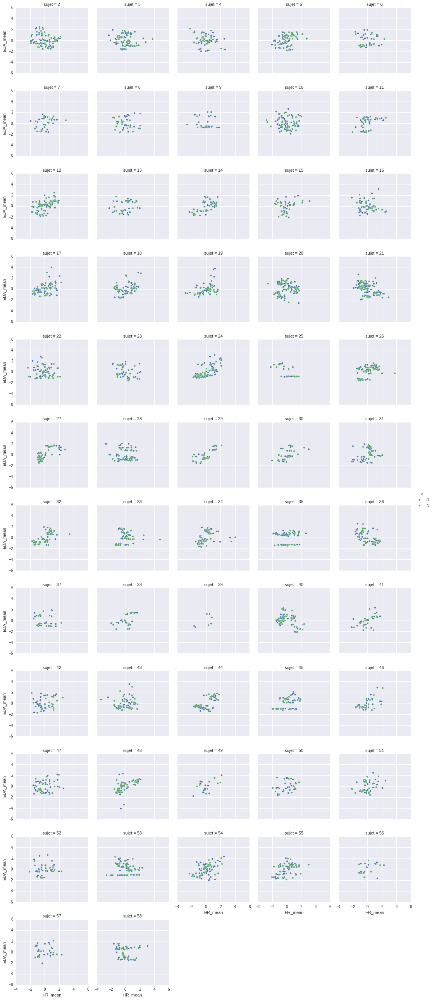

In [308]:
g = sns.FacetGrid(Xnt, col="sujet",  hue="cl", col_wrap=5)
g = (g.map(plt.scatter, 'HR_mean','EDA_mean', edgecolor="w").add_legend())

[back to content: 2016.11.15](#Réunion 2016.11.15)

<a id='LogisticRegression'></a>
## LogisticRegression

In [324]:
from sklearn.linear_model import LogisticRegressionCV
X=phyEventNormdf.drop('sujet',axis=1)
X=X.dropna(axis=1,how='any')
y_an=an
y_vn=vn
reg_a=LogisticRegressionCV()
reg_a.fit(X,y_an)

reg_v=LogisticRegressionCV()
reg_v.fit(X,y_vn)

pred_an=reg_a.predict(X)
pred_vn=reg_v.predict(X)

LogisticRegressionCV(Cs=10, class_weight=None, cv=None, dual=False,
           fit_intercept=True, intercept_scaling=1.0, max_iter=100,
           multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
           refit=True, scoring=None, solver='lbfgs', tol=0.0001, verbose=0)

Confusion matrix, without normalization
[[  0   0   0   0   0  18   0]
 [  0   0   0   0   0  58   0]
 [  0   0   0   0   0 109   0]
 [  0   0   0   0   0 244   0]
 [  0   0   0   0   2 455   1]
 [  0   0   0   0   0 512   0]
 [  0   0   0   0   0 329   2]]
Normalized confusion matrix
[[ 0.    0.    0.    0.    0.    1.    0.  ]
 [ 0.    0.    0.    0.    0.    1.    0.  ]
 [ 0.    0.    0.    0.    0.    1.    0.  ]
 [ 0.    0.    0.    0.    0.    1.    0.  ]
 [ 0.    0.    0.    0.    0.    0.99  0.  ]
 [ 0.    0.    0.    0.    0.    1.    0.  ]
 [ 0.    0.    0.    0.    0.    0.99  0.01]]


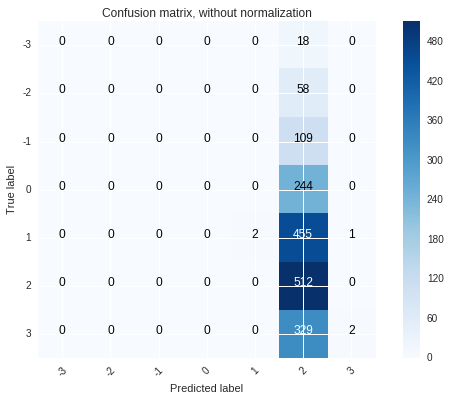

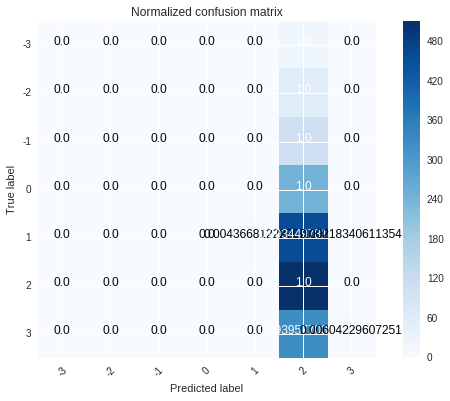

In [333]:
class_names=['-3','-2','-1','0','1','2','3']
    
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_an, pred_an)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

Confusion matrix, without normalization
[[  0  51 235   0   0   0  12]
 [  2  77 288   0   0   0  13]
 [  0  60 331   0   0   0   8]
 [  0  20 102   0   0   0   2]
 [  0  22 139   0   0   0   1]
 [  0  39 166   0   0   0   6]
 [  0  21 106   0   0   0  29]]
Normalized confusion matrix
[[ 0.    0.17  0.79  0.    0.    0.    0.04]
 [ 0.01  0.2   0.76  0.    0.    0.    0.03]
 [ 0.    0.15  0.83  0.    0.    0.    0.02]
 [ 0.    0.16  0.82  0.    0.    0.    0.02]
 [ 0.    0.14  0.86  0.    0.    0.    0.01]
 [ 0.    0.18  0.79  0.    0.    0.    0.03]
 [ 0.    0.13  0.68  0.    0.    0.    0.19]]


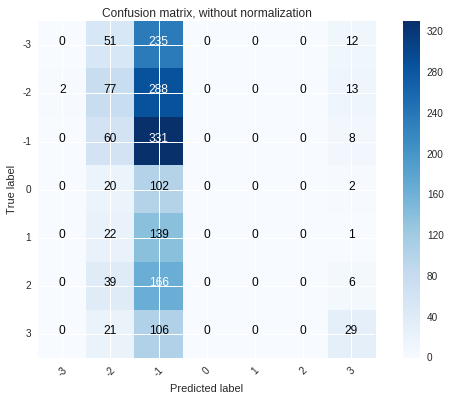

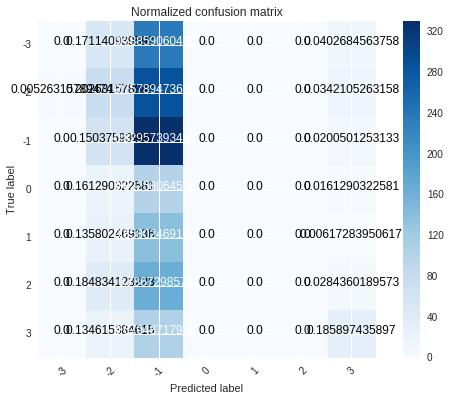

In [334]:
class_names=['-3','-2','-1','0','1','2','3']
    
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_vn, pred_vn)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

<a id='Réunion 2016.11.22'></a>

# Réunion 2016.11.22
* [Regression on  arousal valence emotion](#Regression on  arousal valence emotion)
    * [regression for valence](#regression for valence)
    * [regression for arousal](#regression for arousal)
* [Features groupes performance](#Features grouped by type of signal)
    * [Features grouped by type of signal](#Features grouped by type of signal)
        * ECG, EDA, Resp, EMG
        * Signal length 10, 14, 20, 30s
        * Classifier: DummyClassifier, NearestNeighbors, LinearSVM, RBFSVM, DecisionTree, RandomForest, AdaBoost, NaiveBayes, LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
        * Label: binarized arousal-valence
    * [Features grouped by type of feature](#Features grouped by type of feature)
        * common statistics
        * Signal length 10, 14, 20, 30s
        * Classifier: DummyClassifier, NearestNeighbors, LinearSVM, RBFSVM, DecisionTree, RandomForest, AdaBoost, NaiveBayes, LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
        * Label: binarized arousal-valence
    * [Individual feature](#Individual feature)
* [General vs Individual vs "subject cluster" performance](#General vs Individual vs subject cluster performance)
    * [Based on event vs no event](#based on event vs noevent)
        * General performance of all features on all subject 
        * Individual performance of all features vs. selected feature
        * Select best features among subjects
        * Feature based subject pattern clustering 
        * Performance on subject clustering
    * [Based on arousal valence emotion](#based on arousal valence emotion)
        * General performance of all features on all subject 
        * Individual performance of all features vs. selected feature
        * Select best features among subjects
        * Performance on subject clustering

<a id='Regression on  arousal valence emotion'></a>
## Regression on  arousal valence emotion

In [ ]:
from sklearn import linear_model
import time
dfAll = pd.read_csv('./../out/Allevent.txt',encoding='utf-16',index_col=0)
an=dfAll.iloc[18:,-2]
vn=dfAll.iloc[18:,-1]
estimators = [('svm',svm.SVR()),
              ('linearRidge',linear_model.Ridge (alpha = .5)),
             ('OLS', linear_model.LinearRegression()),
              #('Theil-Sen', linear_model.TheilSenRegressor(random_state=42)),
              #('RANSAC', linear_model.RANSACRegressor(random_state=42)), 
             #('Huber',linear_model.HuberRegressor(fit_intercept=True, alpha=0.0, max_iter=100,epsilon=1.5)),
             ]
phyEventNormdf=pd.read_csv('./../out/feature/phy20s/phyEventNorm.csv',encoding='utf-16',index_col='eventidx')

X=phyEventNormdf.drop('sujet',axis=1)
X=X.dropna(axis=1,how='any')

[back to content: 2016.11.22](#Réunion 2016.11.22)

<a id='regression for valence'></a>
## regression for valence

In [570]:
# regression for predicting valence:
y_pred_val={}
for name, estimator in estimators:
    print(name)
    t0 = time.time()
    estimator.fit(X, vn)
    elapsed_time = time.time() - t0
    y_pred_val[name] = estimator.predict(X)

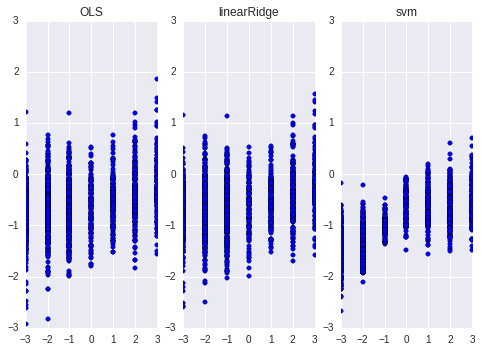

In [1036]:
regres_val=pd.DataFrame(y_pred_val)
regres_val['y']=vn
for i in range(len(regres_val.columns)-1):
    plt.subplot(1,len(regres_val.columns)-1,  i+1)
    plt.scatter(vn,regres_val.ix[:,i])
    plt.xlim(-3,3)
    plt.ylim(-3,3)
    name=regres_val.ix[:,i].name
    plt.title(name)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f20a8b62e10>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f20a8952c10>]], dtype=object)

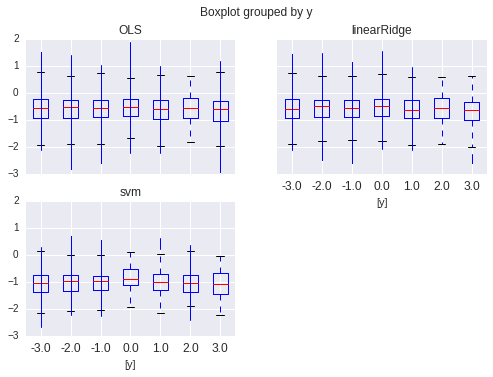

In [1043]:
regres_val.boxplot(by='y')

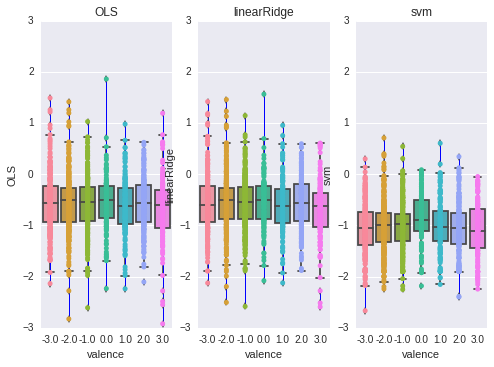

In [1038]:
regres_val=pd.DataFrame(y_pred_val)
regres_val['y']=vn
for i in range(len(regres_val.columns)-1):
    plt.subplot(1, len(regres_val.columns)-1, i+1)
    ax = sns.boxplot(y=regres_val.ix[:,i],x=vn)
    ax = sns.stripplot(y=regres_val.ix[:,i],x=vn)
    #plt.xlim(-3,3)
    plt.ylim(-3,3)
    name=regres_val.ix[:,i].name
    plt.title(name)

[back to content: 2016.11.22](#Réunion 2016.11.22)

<a id='regression for arousal'></a>
## regression for arousal

In [575]:
# regression for predicting arousal:
y_pred_arou={}
for name, estimator in estimators:
    print(name)
    t0 = time.time()
    estimator.fit(X, an)
    elapsed_time = time.time() - t0
    y_pred_arou[name] = estimator.predict(X)

svm
linearRidge
OLS


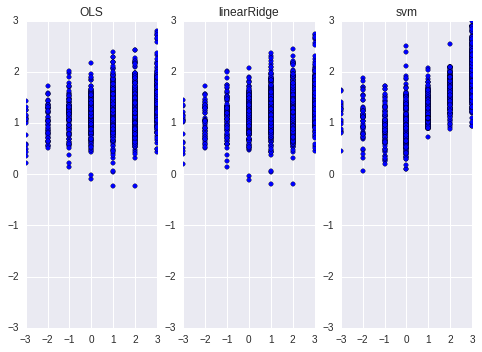

In [1040]:
regres_arou=pd.DataFrame(y_pred_arou)
regres_arou['y']=an
for i in range(len(regres_arou.columns)-1):
    plt.subplot(1,len(regres_arou.columns)-1,  i+1)
    plt.scatter(an,regres_arou.ix[:,i])
    plt.xlim(-3,3)
    plt.ylim(-3,3)
    name=regres_arou.ix[:,i].name
    plt.title(name)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f20aa5e7c10>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f20a8efcd50>]], dtype=object)

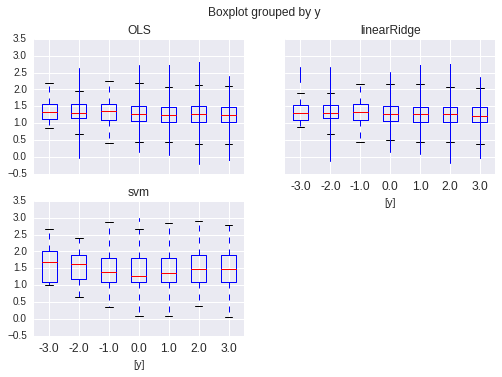

In [1042]:
regres_arou.boxplot(by='y')

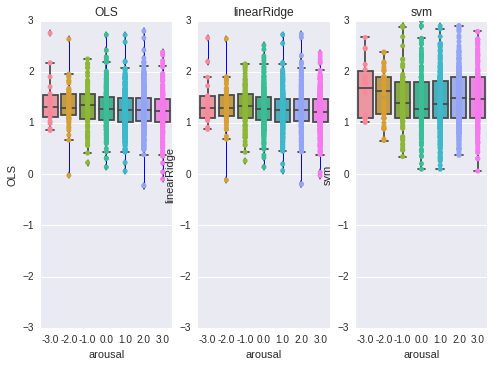

In [1041]:
regres_arou=pd.DataFrame(y_pred_arou)
regres_arou['y']=an
for i in range(len(regres_arou.columns)-1):
    plt.subplot(1,len(regres_arou.columns)-1,  i+1)
    #plt.scatter(regres_arou.ix[:,i],an)
    ax = sns.boxplot(an,regres_arou.ix[:,i])
    ax = sns.stripplot(an,regres_arou.ix[:,i])
    #plt.xlim(-3,3)
    plt.ylim(-3,3)
    name=regres_arou.ix[:,i].name
    plt.title(name)

[back to content: 2016.11.22](#Réunion 2016.11.22)

<a id='Features grouped by type of signal'></a>
## Features grouped by type of signal

In [4]:
phyEventdf10=pd.read_csv('./../out/feature/phyEvent10s.csv',encoding='utf-16',index_col='eventidx')
phyEventdf14=pd.read_csv('./../out/feature/phyEvent14s.csv',encoding='utf-16',index_col='eventidx')
phyEventdf20=pd.read_csv('./../out/feature/phyEvent20s.csv',encoding='utf-16',index_col='eventidx')
phyEventdf30=pd.read_csv('./../out/feature/phyEvent30s.csv',encoding='utf-16',index_col='eventidx')

dfLens=[phyEventdf10,phyEventdf14,phyEventdf20,phyEventdf30]
(featureTrans10,featureTrans14,featureTrans20,featureTrans30)=[df.groupby('sujet').transform(lambda x: (x - x.mean()) / x.std()) for df in dfLens]

phyEventNormdf10=pd.concat([phyEventdf10['sujet'], featureTrans10], axis=1)
phyEventNormdf14=pd.concat([phyEventdf14['sujet'], featureTrans14], axis=1)
phyEventNormdf20=pd.concat([phyEventdf20['sujet'], featureTrans20], axis=1)
phyEventNormdf30=pd.concat([phyEventdf30['sujet'], featureTrans30], axis=1)

phyEventNormdf10n=phyEventNormdf10.dropna(axis=1,how='any')
phyEventNormdf14n=phyEventNormdf14.dropna(axis=1,how='any')
phyEventNormdf20n=phyEventNormdf20.dropna(axis=1,how='any')
phyEventNormdf30n=phyEventNormdf30.dropna(axis=1,how='any')

DF={'10s':phyEventNormdf10n,
     '14s':phyEventNormdf14n,
     '20s':phyEventNormdf20n,
     '30s':phyEventNormdf30n}

In [9]:
Xn=DF['20s']
y_all=eventLabel.ix[18:,1]
X_y=pd.concat([Xn,y_all],axis=1,join='inner')
tmp=X_y.drop('sujet',axis=1)
tmp.to_csv('arou_Salambo.csv',sep=';',index=False)

In [3]:
y_ar=eventLabel.iloc[18:,1]
y_va=eventLabel.iloc[18:,0]

In [433]:
feapattern=["ECG.*","fEMG.*","EDA.*","Resp.*"]

names = ["DummyClassifier","Nearest Neighbors", "Linear SVM", 
         #"RBF SVM", 
         "Decision Tree",
         "Random Forest", "AdaBoost", "Naive Bayes", "Linear Discriminant Analysis",
         "Quadratic Discriminant Analysis"]
classifiers = [
    DummyClassifier(strategy='most_frequent',random_state=0),
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=1),
    #SVC(gamma=0.0001, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=20),
    AdaBoostClassifier(),
    GaussianNB(),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis()]

cmpclassifierdf=pd.DataFrame()
for DFname, X in DF.iteritems():
    print("=============")
    print(DFname)
    Xn=X.dropna(axis=1,how='any')
    y_all=eventLabel.ix[18:,0:2]
    X_y=pd.concat([Xn,y_all],axis=1,join='inner')
    for pattern in feapattern:
        print(" "+pattern)
        regexb=re.compile(pattern)
        selectf=[m.group(0) for l in feanames for m in [regexb.search(l)] if m]
        Xn_s=X_y[list(set(selectf) & set(X_y.columns.values))]
        y_all=X_y.iloc[:,-2:]
        for label_i in np.arange(2):
            labelname=y_all.columns.values[label_i]
            y=y_all.iloc[:,label_i]
            print('  '+labelname)
            for name, clf in zip(names, classifiers):
                print('    '+name)
                scores = cross_val_score(clf, Xn_s, y, cv=10)
                ncmp=pd.DataFrame({'DFname':DFname,'signal':pattern,'label':labelname,'classifier':name,'score':scores })
                cmpclassifierdf=cmpclassifierdf.append(ncmp)


    #print("{0:.3f} (std: {1:.3f})".format(scores.mean(),np.std(scores)))

10s
 ECG.*
  pos
    DummyClassifier
    Nearest Neighbors
    Linear SVM
    Decision Tree
    Random Forest
    AdaBoost
    Naive Bayes
    Linear Discriminant Analysis
    Quadratic Discriminant Analysis
  high
    DummyClassifier
    Nearest Neighbors
    Linear SVM
    Decision Tree
    Random Forest
    AdaBoost
    Naive Bayes
    Linear Discriminant Analysis
    Quadratic Discriminant Analysis
 fEMG.*
  pos
    DummyClassifier
    Nearest Neighbors
    Linear SVM
    Decision Tree
    Random Forest
    AdaBoost
    Naive Bayes
    Linear Discriminant Analysis
    Quadratic Discriminant Analysis
  high
    DummyClassifier
    Nearest Neighbors
    Linear SVM
    Decision Tree
    Random Forest
    AdaBoost
    Naive Bayes
    Linear Discriminant Analysis
    Quadratic Discriminant Analysis
 EDA.*
  pos
    DummyClassifier
    Nearest Neighbors
    Linear SVM
    Decision Tree
    Random Forest
    AdaBoost
    Naive Bayes
    Linear Discriminant Analysis
    Quadratic Discrimin

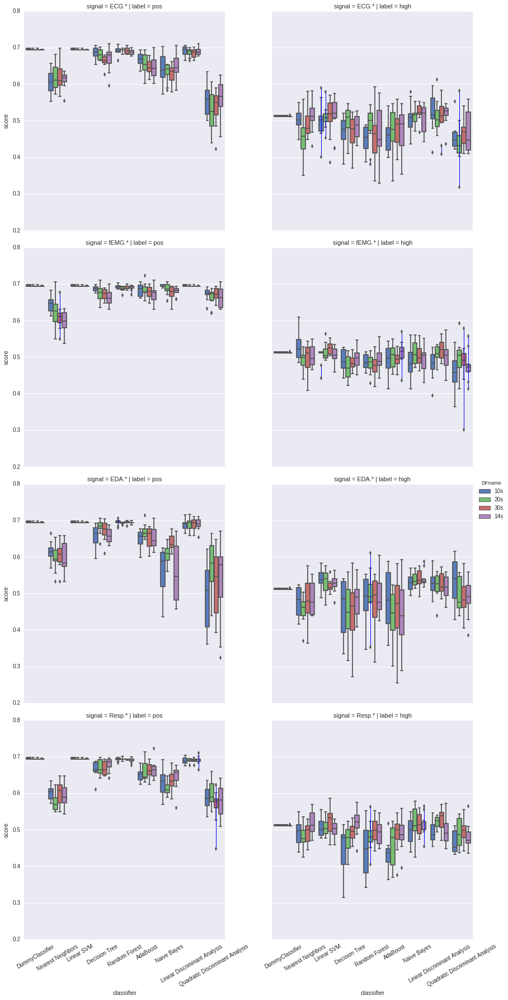

In [436]:
g = sns.factorplot(x="classifier", y="score", col='label',row='signal',hue='DFname',data=cmpclassifierdf,
                   size=6, kind="box",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)
g.set_ylabels("score")

[back to content: 2016.11.22](#Réunion 2016.11.22)

<a id='Features grouped by type of feature'></a>
## Feature group by type of feature

In [438]:
feapattern=['.*mean', '.*median', '.*max', '.*min','.*vrange', '.*var', '.*stddev','.*avgder', '.*maxgra', '.*absdev']

names = ["DummyClassifier","Nearest Neighbors", "Linear SVM", 
         #"RBF SVM", 
         "Decision Tree",
         "Random Forest", "AdaBoost", "Naive Bayes", "Linear Discriminant Analysis",
         "Quadratic Discriminant Analysis"]
classifiers = [
    DummyClassifier(strategy='most_frequent',random_state=0),
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=1),
    #SVC(gamma=0.0001, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=20),
    AdaBoostClassifier(),
    GaussianNB(),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis()]

cmpclassifierdf2=pd.DataFrame()
for DFname, X in DF.iteritems():
    print("=============")
    print(DFname)
    Xn=X.dropna(axis=1,how='any')
    y_all=eventLabel.ix[18:,0:2]
    X_y=pd.concat([Xn,y_all],axis=1,join='inner')
    for pattern in feapattern:
        print(" "+pattern)
        regexb=re.compile(pattern)
        selectf=[m.group(0) for l in feanames for m in [regexb.search(l)] if m]
        Xn_s=X_y[list(set(selectf) & set(X_y.columns.values))]
        y_all=X_y.iloc[:,-2:]
        for label_i in np.arange(2):
            labelname=y_all.columns.values[label_i]
            y=y_all.iloc[:,label_i]
            print('  '+labelname)
            for name, clf in zip(names, classifiers):
                print('    '+name)
                scores = cross_val_score(clf, Xn_s, y, cv=10)
                ncmp=pd.DataFrame({'DFname':DFname,'signal':pattern,'label':labelname,'classifier':name,'score':scores })
                cmpclassifierdf2=cmpclassifierdf2.append(ncmp)


10s
 .*mean
  pos
    DummyClassifier
    Nearest Neighbors
    Linear SVM
    Decision Tree
    Random Forest
    AdaBoost
    Naive Bayes
    Linear Discriminant Analysis
    Quadratic Discriminant Analysis
  high
    DummyClassifier
    Nearest Neighbors
    Linear SVM
    Decision Tree
    Random Forest
    AdaBoost
    Naive Bayes
    Linear Discriminant Analysis
    Quadratic Discriminant Analysis
 .*median
  pos
    DummyClassifier
    Nearest Neighbors
    Linear SVM
    Decision Tree
    Random Forest
    AdaBoost
    Naive Bayes
    Linear Discriminant Analysis
    Quadratic Discriminant Analysis
  high
    DummyClassifier
    Nearest Neighbors
    Linear SVM
    Decision Tree
    Random Forest
    AdaBoost
    Naive Bayes
    Linear Discriminant Analysis
    Quadratic Discriminant Analysis
 .*max
  pos
    DummyClassifier
    Nearest Neighbors
    Linear SVM
    Decision Tree
    Random Forest
    AdaBoost
    Naive Bayes
    Linear Discriminant Analysis
    Quadratic Discri

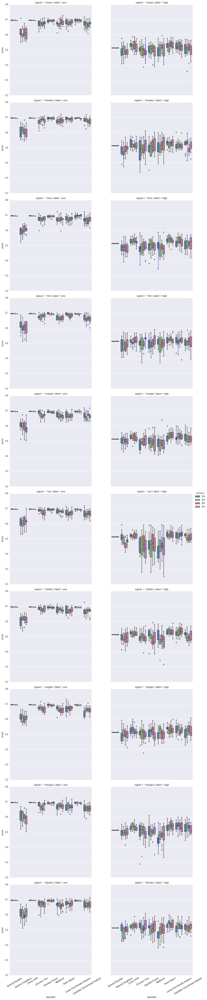

In [439]:
g = sns.factorplot(x="classifier", y="score", col='label',row='signal',hue='DFname',data=cmpclassifierdf2,
                   size=6, kind="box",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)
g.set_ylabels("score")

In [451]:
names = ["DummyClassifier",
         "Linear SVM"]
classifiers = [
    DummyClassifier(strategy='most_frequent',random_state=0),
    SVC(kernel="linear", C=1)]

cmpclassifierdf3=pd.DataFrame()
for DFname, X in DF.iteritems():
    print("=============")
    print(DFname)
    Xn=X.dropna(axis=1,how='any')
    Xn=Xn.drop('sujet',axis=1)
    y_all=eventLabel.ix[18:,0:2]
    X_y=pd.concat([Xn,y_all],axis=1,join='inner')
    for fea_sel in list(Xn.columns.values):
        print(fea_sel)
        Xn_s=X_y[fea_sel]
        Xn_s=Xn_s.reshape(-1, 1)
        y_all=X_y.iloc[:,-2:]
        for label_i in np.arange(2):
            labelname=y_all.columns.values[label_i]
            y=y_all.iloc[:,label_i]
            print('  '+labelname)
            for name, clf in zip(names, classifiers):
                print('    '+name)
                scores = cross_val_score(clf, Xn_s, y, cv=10)
                ncmp=pd.DataFrame({'DFname':DFname,'feature':fea_sel,'label':labelname,'classifier':name,'score':scores })
                cmpclassifierdf3=cmpclassifierdf3.append(ncmp)


10s
ECG_raw_mean
  pos
    DummyClassifier
    Decision Tree
  high
    DummyClassifier
    Decision Tree
ECG_raw_median
  pos
    DummyClassifier
    Decision Tree
  high
    DummyClassifier
    Decision Tree
ECG_raw_max
  pos
    DummyClassifier
    Decision Tree
  high
    DummyClassifier
    Decision Tree
ECG_raw_min
  pos
    DummyClassifier
    Decision Tree
  high
    DummyClassifier
    Decision Tree
ECG_raw_vrange
  pos
    DummyClassifier
    Decision Tree
  high
    DummyClassifier
    Decision Tree
ECG_raw_var
  pos
    DummyClassifier
    Decision Tree
  high
    DummyClassifier
    Decision Tree
ECG_raw_stddev
  pos
    DummyClassifier
    Decision Tree
  high
    DummyClassifier
    Decision Tree
ECG_raw_avgder
  pos
    DummyClassifier
    Decision Tree
  high
    DummyClassifier
    Decision Tree
ECG_raw_maxgra
  pos
    DummyClassifier
    Decision Tree
  high
    DummyClassifier
    Decision Tree
ECG_raw_absdev
  pos
    DummyClassifier
    Decision Tree
  high
    D

[back to content: 2016.11.22](#Réunion 2016.11.22)

<a id='Individual feature'></a>
## Individual feature

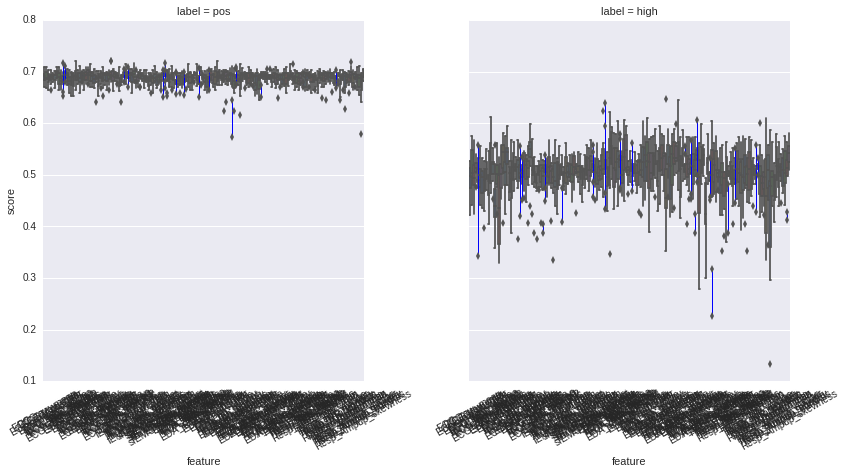

In [460]:
tmp=cmpclassifierdf3[(cmpclassifierdf3.DFname=='10s')&(cmpclassifierdf3.classifier=='Decision Tree')]
g = sns.factorplot(x="feature", y="score", col='label',data=tmp,
                   size=6, kind="box",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)
g.set_ylabels("score")

In [462]:
cmpclassifierdf.to_csv('./../out/feature/cmpwinsig.csv',encoding='utf-16')

In [452]:
g = sns.factorplot(x="DFname", y="score", col='label',row='feature',hue='classifier',data=cmpclassifierdf3,
                   size=6, kind="box",palette="muted")
g.set_xticklabels(rotation=30)
g.despine(left=True)
g.set_ylabels("score")

In [465]:
cmpclassifierdf3.to_csv('./../out/feature/cmpwinonefea.csv',encoding='utf-16')

In [469]:
cmpclassifierdf3.tail()

,DFname,classifier,feature,label,score
5,14s,Decision Tree,Resp_Ampup_skewness,high,0.517442
6,14s,Decision Tree,Resp_Ampup_skewness,high,0.505814
7,14s,Decision Tree,Resp_Ampup_skewness,high,0.534884
8,14s,Decision Tree,Resp_Ampup_skewness,high,0.470930
9,14s,Decision Tree,Resp_Ampup_skewness,high,0.436047


In [474]:
tmp=cmpclassifierdf3[(cmpclassifierdf3.DFname=='14s')&(cmpclassifierdf3.classifier=='Decision Tree')&(cmpclassifierdf3.label=='pos')]
tmp.head()

,DFname,classifier,feature,label,score
0,14s,Decision Tree,ECG_raw_mean,high,0.511494
1,14s,Decision Tree,ECG_raw_mean,high,0.442529
2,14s,Decision Tree,ECG_raw_mean,high,0.494253
3,14s,Decision Tree,ECG_raw_mean,high,0.514451
4,14s,Decision Tree,ECG_raw_mean,high,0.508671


In [531]:
tmpdummy=cmpclassifierdf3[(cmpclassifierdf3.DFname=='14s')&(cmpclassifierdf3.classifier=='DummyClassifier')&(cmpclassifierdf3.label=='pos')]
tmpdummy.groupby('feature').score.mean().order()

feature
ECG_HR_absdev          0.693868
Resp_Ampup_avgder      0.693868
Resp_Ampup_kurtosis    0.693868
Resp_Ampup_max         0.693868
Resp_Ampup_maxgra      0.693868
Resp_Ampup_mean        0.693868
Resp_Ampup_min         0.693868
Resp_Ampup_skewness    0.693868
Resp_Ampup_vrange      0.693868
Resp_RR_absdev         0.693868
Resp_RR_avgder         0.693868
Resp_RR_kurtosis       0.693868
Resp_RR_max            0.693868
Resp_RR_maxgra         0.693868
Resp_RR_mean           0.693868
...
EDA_fre_b0          0.693868
EDA_fre_b1          0.693868
EDA_fre_b2          0.693868
EDA_fre_b3          0.693868
EDA_raw_max         0.693868
EDA_fre_b4          0.693868
EDA_ph_absdev       0.693868
EDA_ph_avgder       0.693868
EDA_ph_kurtosis     0.693868
EDA_ph_max          0.693868
EDA_ph_maxgra       0.693868
EDA_ph_mean         0.693868
EDA_ph_median       0.693868
EDA_one_nbpks       0.693868
sfEMG_raw_vrange    0.693868
Name: score, Length: 153, dtype: float64

In [532]:
selectf=tmp.groupby('feature').score.mean()[tmp.groupby('feature').score.mean()>(0.693868)].index.values

<a id='General vs Individual vs subject cluster performance'></a>
## General vs Individual vs subject cluster performance

<a id='based on event vs noevent'></a>
### based on event vs noevent

In [40]:
phyEvent10s=pd.read_csv('./../out/feature/phyEvent10s.csv',encoding='utf-16',index_col='eventidx')
phyEvent14s=pd.read_csv('./../out/feature/phyEvent14s.csv',encoding='utf-16',index_col='eventidx')
phyEvent20s=pd.read_csv('./../out/feature/phyEvent20s.csv',encoding='utf-16',index_col='eventidx')
phyEvent30s=pd.read_csv('./../out/feature/phyEvent30s.csv',encoding='utf-16',index_col='eventidx')
phyBeforeEvent10s=pd.read_csv('./../out/feature/phyBeforeEvent10s.csv',encoding='utf-16',index_col='eventidx')
phyBeforeEvent14s=pd.read_csv('./../out/feature/phyBeforeEvent14s.csv',encoding='utf-16',index_col='eventidx')
phyBeforeEvent20s=pd.read_csv('./../out/feature/phyBeforeEvent20s.csv',encoding='utf-16',index_col='eventidx')
phyBeforeEvent30s=pd.read_csv('./../out/feature/phyBeforeEvent30s.csv',encoding='utf-16',index_col='eventidx')
dfAll = pd.read_csv('./../out/Allevent.txt',encoding='utf-16',index_col=0)

In [41]:
winlenidx=1 #0,1,2,3
winsizels=[10,14,20,30]
phyEventDF=[phyEvent10s,phyEvent14s,phyEvent20s,phyEvent30s]
phyBeforeEventDF=[phyBeforeEvent10s,phyBeforeEvent14s,phyBeforeEvent20s,phyBeforeEvent30s]

dfAlln=dfAll[18:]
sepevent=dfAlln.loc[~np.insert((np.diff(dfAlln.iloc[:,2])<winsizels[winlenidx]*3/2)&(np.abs(np.diff(dfAlln.iloc[:,2]))<3933),0,False)]
#sepevent.index

X=pd.concat([phyEventDF[winlenidx].loc[sepevent.index],phyBeforeEventDF[winlenidx].loc[sepevent.index]],axis=0,ignore_index=True)
nl=len(phyEventDF[winlenidx].loc[sepevent.index])
y=np.array([1]*nl+[0]*nl)
y=pd.DataFrame(y,columns=['cl'],index=X.index)
sujetcol=pd.DataFrame(X.sujet)

Xnna = X.groupby('sujet').transform(lambda x: x.fillna(x.mean()))
Xnna=pd.concat([X.sujet,Xnna],axis=1)
Xn=Xnna.groupby('sujet').transform(lambda x: (x - x.mean()) / x.std())

Xnn=Xn.join(y,how='inner')
y=Xnn.cl
Xn1=Xnn.drop('cl',axis=1)
Xn1=Xn1.dropna(axis=1,how='any')

#RFGridsearchtest(Xn1,y)

ValueError: Length mismatch: Expected axis has 2746 elements, new values have 2750 elements

winsize=10
             precision    recall  f1-score   support

          0       0.61      0.59      0.60      1189
          1       0.60      0.62      0.61      1185

avg / total       0.60      0.60      0.60      2374
=======================================================
winsize=14
             precision    recall  f1-score   support

          0       0.59      0.61      0.60      1097
          1       0.60      0.58      0.59      1100

avg / total       0.60      0.60      0.60      2197
=======================================================
winsize=20
             precision    recall  f1-score   support

          0       0.58      0.69      0.63       933
          1       0.63      0.51      0.56       959

avg / total       0.60      0.60      0.59      1892
=======================================================
winsize=30
             precision    recall  f1-score   support

          0       0.56      0.46      0.50       730
          1       0.54      0.64      0.58       717

avg / total       0.55      0.55      0.54      1447
=======================================================

In [1015]:
Xnn_sujet=Xnn.join(sujetcol,how='inner')

In [25]:
def fea_sel(ls_fea):
    #feaind=pd.DataFrame(columns=X.columns.values)
    columns=X.columns.values
    feaarray=np.zeros_like(columns)
    feaidx=dict(zip(columns,feaarray))
    for i in columns:
        if i in ls_fea:
            feaidx[i]=1
    return feaidx

In [1022]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE

X=Xnn_sujet.drop(['cl','sujet'],axis=1)
cmpfeature=pd.DataFrame()



for sujet, Xnn in Xnn_sujet.groupby('sujet'): 
    print(sujet)
    y=Xnn.cl
    X=Xnn.drop(['cl','sujet'],axis=1)
    Xn=X.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
        #classification rate without feature selection:
        svc = SVC(kernel="linear", C=1)
        score_o = cross_val_score(svc, Xn, y, cv=5)
        # Create the RFE object and rank each pixel
        rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
        rfe.fit(Xn, y)
        selectf=Xn.columns.values[rfe.get_support()]
        Xnn=Xn[selectf]
        score_s = cross_val_score(svc, Xnn, y, cv=5)
        ncmp=pd.DataFrame(fea_sel(selectf),index=[sujet])
        ncmp['nevent']=len(Xn)
        ncmp['score_o_mean']=score_o.mean()
        ncmp['score_o_std']=score_o.std()
        ncmp['score_s_mean']=score_s.mean()
        ncmp['score_s_std']=score_s.std()
        cmpfeature=cmpfeature.append(ncmp)

2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
11.0
12.0
13.0
14.0
15.0
16.0
17.0
18.0
19.0
20.0
21.0
22.0
23.0
24.0
25.0
26.0
27.0
28.0
29.0
30.0
31.0
32.0
33.0
34.0
35.0
36.0
37.0
38.0
39.0
40.0
41.0
42.0
43.0
44.0
45.0
46.0
47.0
48.0
49.0
50.0
51.0
52.0
53.0
54.0
55.0
56.0
57.0
58.0


In [1023]:
cmpfeature.head()

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_stddev,sfEMG_raw_var,sfEMG_raw_vrange,nevent,score_o_mean,score_o_std,score_s_mean,score_s_std
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,70,0.585714,0.083299,0.857143,0.090351
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,56,0.666667,0.142984,0.910000,0.053333
4,1,1,0,0,0,1,0,0,0,0,...,0,1,0,0,0,56,0.643333,0.068799,0.983333,0.033333
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,62,0.535714,0.097299,0.869048,0.114186
6,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,36,0.616667,0.270545,0.950000,0.100000


In [1024]:
cmpfeature.sort('score_s_mean',inplace=False)

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_stddev,sfEMG_raw_var,sfEMG_raw_vrange,nevent,score_o_mean,score_o_std,score_s_mean,score_s_std
36,0,1,0,1,0,0,0,1,0,0,...,0,0,0,0,0,70,0.457143,0.194831,0.671429,0.096890
55,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,52,0.516667,0.095452,0.696667,0.112744
10,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,82,0.597222,0.062885,0.741667,0.077504
34,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,66,0.561905,0.142340,0.754762,0.144357
26,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,58,0.620000,0.038586,0.756667,0.067987
48,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,68,0.528571,0.096890,0.757143,0.166599
42,0,0,0,0,1,0,0,1,1,0,...,0,0,0,0,0,50,0.580000,0.074833,0.760000,0.135647
14,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,42,0.500000,0.000000,0.765000,0.098234
21,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,64,0.578571,0.114830,0.783333,0.079111
38,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,32,0.541667,0.153659,0.783333,0.066667


In [986]:
from sklearn.cluster import KMeans
X_fea=cmpfeature.iloc[:,:164]
random_state=1
y_pred = KMeans(n_clusters=4, random_state=random_state).fit_predict(X_fea)
X_fea['cluster']=y_pred

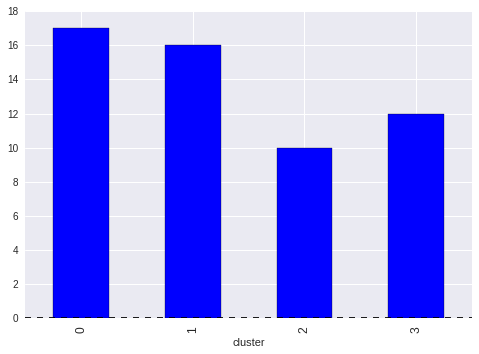

In [987]:
X_fea.groupby(['cluster'])['ECG_HR_absdev'].count().plot(kind='bar')

In [988]:
X_fea.groupby(['cluster']).sum()

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_kurtosis,sfEMG_raw_max,sfEMG_raw_maxgra,sfEMG_raw_mean,sfEMG_raw_median,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_stddev,sfEMG_raw_var,sfEMG_raw_vrange
cluster,,,,,,,,,,,,,,,,,,,,,
0,4,3,0,2,3,7,0,3,0,0,...,3,2,2,4,4,5,4,0,0,2
1,0,7,0,0,1,7,0,4,0,0,...,1,3,2,1,9,3,1,0,0,5
2,0,1,1,0,3,1,0,4,1,1,...,0,1,4,2,1,3,0,0,0,4
3,1,4,1,2,2,1,0,4,1,0,...,2,3,6,7,2,1,0,0,0,3


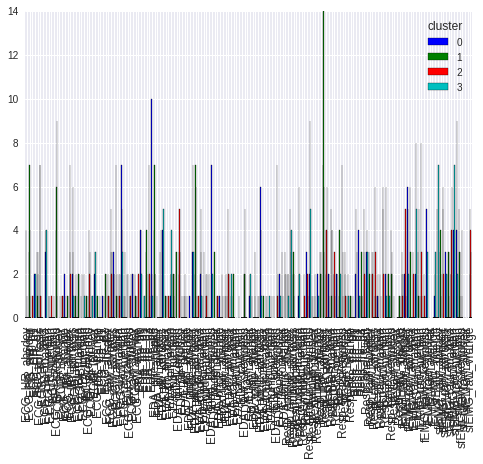

In [989]:
X_fea.groupby(['cluster']).sum().T.plot(kind='bar')

In [990]:
featurecount=(X_fea.groupby(['cluster']).sum().sum()).sort(inplace=False)
print(featurecount)

EDA_raw_stddev      0
sfEMG_raw_stddev    0
EDA_raw_min         0
EDA_raw_mean        0
sfEMG_raw_var       0
fEMG_raw_var        0
ECG_HR_max          0
fEMG_raw_stddev     0
Resp_raw_var        0
Resp_Ampup_mean     0
Resp_Ampup_max      0
EDA_ph_absdev       1
EDA_tonic_min       1
EDA_tonic_median    1
EDA_ph_stddev       1
...
ECG_HR_maxgra          15
EDA_one_nbpks          15
fEMG_raw_avgder        15
ECG_HR_avgder          15
ECG_HR_kurtosis        16
fEMG_raw_maxgra        16
Resp_Ampup_avgder      16
EDA_phde_kurtosis      16
Resp_RR_kurtosis       16
sfEMG_raw_median       16
EDA_ph_kurtosis        16
Resp_Ampup_skewness    17
ECG_raw_mean           19
ECG_HR_skewness        20
Resp_RR_avgder         30
Length: 164, dtype: int64


In [991]:
mvpfeauture=list(featurecount[featurecount>11].index)
len(mvpfeauture)

32

In [992]:
X_fea_mvp=pd.concat([X_fea[mvpfeauture],X_fea['cluster']],axis=1)

In [993]:
X_fea_mvp

,EDA_fre_b3,sfEMG_raw_min,EDA_tonic_kurtosis,ECG_IBI_avgder,sfEMG_one_ct,ECG_IBI_kurtosis,EDA_phde_avgder,ECG_raw_avgder,sfEMG_raw_avgder,fEMG_raw_median,...,Resp_Ampup_avgder,EDA_phde_kurtosis,Resp_RR_kurtosis,sfEMG_raw_median,EDA_ph_kurtosis,Resp_Ampup_skewness,ECG_raw_mean,ECG_HR_skewness,Resp_RR_avgder,cluster
2,0,0,0,0,1,0,1,1,0,0,...,0,1,0,0,0,0,1,1,0,3
3,0,0,1,1,0,0,0,1,1,0,...,0,0,0,1,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,0,...,0,0,1,1,1,0,1,1,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,1,1,3
7,0,0,0,0,0,0,0,1,0,0,...,1,1,0,0,0,0,1,1,0,3
8,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
9,0,0,1,1,0,1,0,0,0,1,...,0,1,0,1,0,1,0,0,1,1
10,1,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,0,1,0,3
11,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1


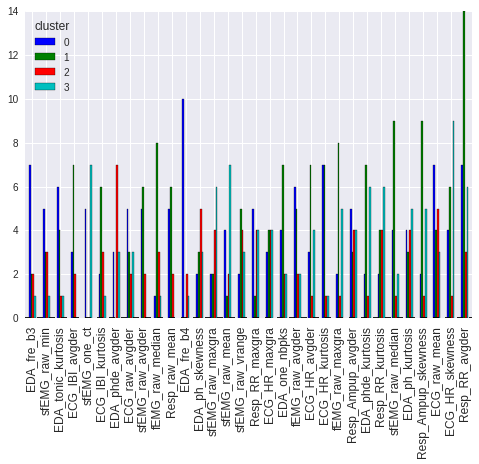

In [994]:
X_fea_mvp.groupby(['cluster']).sum().T.plot(kind='bar')

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f20a800b190>,
       <matplotlib.axes._subplots.AxesSubplot object at 0x7f20a7addc50>], dtype=object)

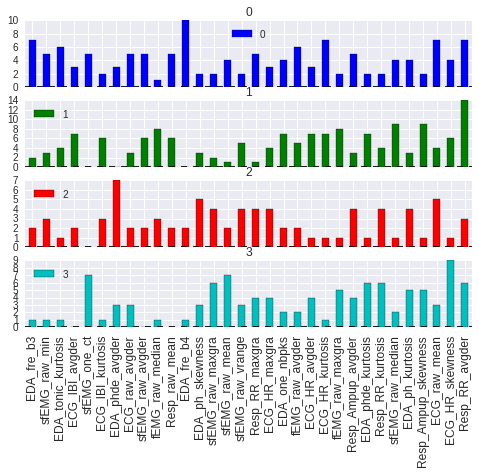

In [1080]:
X_fea_mvp.groupby(['cluster']).sum().T.plot(kind='bar',subplots=True)

In [1018]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE

Xnn_sujet1=pd.merge(Xnn_sujet,pd.DataFrame(X_fea['cluster']),left_on='sujet', right_index=True,how='inner')

cmpfeaturecluster=pd.DataFrame()

def fea_sel(ls_fea):
    #feaind=pd.DataFrame(columns=X.columns.values)
    columns=X.columns.values
    feaarray=np.zeros_like(columns)
    feaidx=dict(zip(columns,feaarray))
    for i in columns:
        if i in ls_fea:
            feaidx[i]=1
    return feaidx

for cluster, Xnn in Xnn_sujet1.groupby('cluster'): 
    print(cluster)
    y=Xnn.cl
    X=Xnn.drop(['cl','sujet','cluster'],axis=1)
    Xn=X.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
        #classification rate without feature selection:
        svc = SVC(kernel="linear", C=1)
        score_o = cross_val_score(svc, Xn, y, cv=5)
        # Create the RFE object and rank each pixel
        rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
        rfe.fit(Xn, y)
        selectf=Xn.columns.values[rfe.get_support()]
        Xnn=Xn[selectf]
        score_s = cross_val_score(svc, Xnn, y, cv=5)
        ncmp=pd.DataFrame(fea_sel(selectf),index=[cluster])
        ncmp['score_o_mean']=score_o.mean()
        ncmp['score_o_std']=score_o.std()
        ncmp['score_s_mean']=score_s.mean()
        ncmp['score_s_std']=score_s.std()
        cmpfeaturecluster=cmpfeaturecluster.append(ncmp)

0
1
2
3


In [1019]:
cmpfeaturecluster

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_median,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_stddev,sfEMG_raw_var,sfEMG_raw_vrange,score_o_mean,score_o_std,score_s_mean,score_s_std
0,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0.521245,0.027110,0.593885,0.017771
1,0,0,1,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0.618734,0.045516,0.675953,0.045895
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0.624607,0.032848,0.692784,0.050223
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.585075,0.046628,0.643284,0.043617


[back to content: 2016.11.22](#Réunion 2016.11.22)

<a id='based on arousal valence emotion'></a>
### based on arousal valence emotion

In [1056]:
for name,Xn in DF.iteritems():
    print(name)
    y_ar=eventLabel.iloc[18:,1]
    X1=Xn.drop('sujet',axis=1)
    X=X1.join(y_ar,how='inner')
    Xn1=X.drop('high',axis=1)
    y=X['high']
    RFGridsearchtest(Xn1,y)

10s
# Tuning hyper-parameters for precision

Best parameters set found on development set:

{'max_features': 15, 'n_estimators': 10}

Grid scores on development set:

0.539 (+/-0.176) for {'max_features': 5, 'n_estimators': 10}
0.499 (+/-0.160) for {'max_features': 5, 'n_estimators': 20}
0.522 (+/-0.205) for {'max_features': 5, 'n_estimators': 30}
0.520 (+/-0.126) for {'max_features': 5, 'n_estimators': 40}
0.530 (+/-0.177) for {'max_features': 5, 'n_estimators': 50}
0.486 (+/-0.164) for {'max_features': 5, 'n_estimators': 60}
0.490 (+/-0.099) for {'max_features': 10, 'n_estimators': 10}
0.534 (+/-0.171) for {'max_features': 10, 'n_estimators': 20}
0.520 (+/-0.231) for {'max_features': 10, 'n_estimators': 30}
0.529 (+/-0.212) for {'max_features': 10, 'n_estimators': 40}
0.510 (+/-0.150) for {'max_features': 10, 'n_estimators': 50}
0.522 (+/-0.187) for {'max_features': 10, 'n_estimators': 60}
0.561 (+/-0.221) for {'max_features': 15, 'n_estimators': 10}
0.501 (+/-0.178) for {'max_featur

In [ ]:
10s             
            precision    recall  f1-score   support

          0       0.54      0.54      0.54       719
          1       0.50      0.51      0.50       663

avg / total       0.52      0.52      0.52      1382
=========================================================
14s
             precision    recall  f1-score   support

          0       0.55      0.40      0.46       720
          1       0.50      0.65      0.56       663

avg / total       0.52      0.52      0.51      1383
=========================================================
20s
             precision    recall  f1-score   support

          0       0.56      0.49      0.52       718
          1       0.52      0.58      0.55       666

avg / total       0.54      0.54      0.53      1384
=========================================================
30s
             precision    recall  f1-score   support

          0       0.59      0.49      0.53       718
          1       0.53      0.63      0.58       666

avg / total       0.56      0.55      0.55      1384

In [1084]:
y_ar=eventLabel.iloc[18:,1]
Xnn_sujet=DF['20s'].join(y_ar,how='inner')
Xnn_sujet.head()

,sujet,ECG_raw_mean,ECG_raw_median,ECG_raw_max,ECG_raw_min,ECG_raw_vrange,ECG_raw_var,ECG_raw_stddev,ECG_raw_avgder,ECG_raw_maxgra,...,Resp_Ampup_mean,Resp_Ampup_max,Resp_Ampup_min,Resp_Ampup_vrange,Resp_Ampup_avgder,Resp_Ampup_maxgra,Resp_Ampup_absdev,Resp_Ampup_kurtosis,Resp_Ampup_skewness,high
eventidx,,,,,,,,,,,,,,,,,,,,,
18,2,-0.676255,0.017119,-1.789465,0.489156,-1.369097,-1.972292,-1.992517,0.646479,-2.047862,...,-0.449223,-0.754732,-0.103999,-0.938180,-0.123218,-0.731820,-0.953438,2.560772,-2.520112,1
19,2,-0.094325,-0.983920,-2.077616,0.630765,-1.632249,-1.873250,-1.886956,-0.115413,-2.066838,...,-0.608117,-0.718555,-0.559278,-0.644232,-0.127995,-0.624444,-0.706549,0.614415,-0.995620,1
20,2,0.071147,-0.768972,-2.216446,0.570811,-1.671956,-1.680142,-1.682600,-0.228325,-2.206339,...,-0.284586,-0.264912,-0.205224,-0.238035,0.792475,-0.389146,-0.023452,-0.962222,0.307639,1
21,2,0.076285,-0.311708,-2.147545,0.644436,-1.682052,-2.011211,-2.034140,-0.085891,-2.030301,...,-0.940244,-1.060074,-0.638381,-1.051429,-0.266165,-0.874688,-0.940169,-0.781403,-0.804197,0
22,2,-0.085260,-0.732947,-1.974493,0.588749,-1.543958,-2.266504,-2.309191,0.191727,-1.783428,...,-0.949861,-1.049494,-0.581031,-1.068513,-0.392518,-0.851201,-1.000337,0.059458,0.631071,1


In [7]:

def fea_sel(ls_fea):
    #feaind=pd.DataFrame(columns=X.columns.values)
    columns=X.columns.values
    feaarray=np.zeros_like(columns)
    feaidx=dict(zip(columns,feaarray))
    for i in columns:
        if i in ls_fea:
            feaidx[i]=1
    return feaidx

In [1132]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE

X=Xnn_sujet.drop(['high','sujet'],axis=1)
cmpfeature=pd.DataFrame()


for sujet, Xnn in Xnn_sujet.groupby('sujet'): 
    print(sujet)
    y=Xnn.high
    X=Xnn.drop(['high','sujet'],axis=1)
    Xn=X.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
        #classification rate without feature selection:
        svc = SVC(kernel="linear", C=1)
        score_o = cross_val_score(svc, Xn, y, cv=5)
        # Create the RFE object and rank each pixel
        rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
        rfe.fit(Xn, y)
        selectf=Xn.columns.values[rfe.get_support()]
        Xnn=Xn[selectf]
        score_s = cross_val_score(svc, Xnn, y, cv=5)
        ncmp=pd.DataFrame(fea_sel(selectf),index=[sujet])
        ncmp['nevent']=len(Xnn)
        ncmp['score_o_mean']=score_o.mean()
        ncmp['score_o_std']=score_o.std()
        ncmp['score_s_mean']=score_s.mean()
        ncmp['score_s_std']=score_s.std()
        cmpfeature=cmpfeature.append(ncmp)

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58


In [1064]:
cmpfeature.head()

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_mean,sfEMG_raw_median,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_vrange,nevent,score_o_mean,score_o_std,score_s_mean,score_s_std
2,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,47,0.523889,0.145505,0.862778,0.125556
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,46,0.717778,0.111466,0.911111,0.083148
4,0,1,0,0,0,1,0,0,0,0,...,1,0,0,0,0,32,0.812381,0.053333,0.971429,0.057143
5,0,0,0,0,1,0,0,0,0,0,...,1,0,1,0,0,43,0.536111,0.250863,0.930556,0.090438
6,1,1,1,1,1,0,0,0,0,0,...,0,0,0,0,0,20,0.570000,0.290861,0.960000,0.080000


In [1065]:
cmpfeature.sort('score_s_mean',inplace=False)

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_mean,sfEMG_raw_median,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_vrange,nevent,score_o_mean,score_o_std,score_s_mean,score_s_std
48,1,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,43,0.444444,0.220129,0.769444,0.119670
10,0,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,43,0.443333,0.128819,0.790000,0.132853
21,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,64,0.498718,0.065923,0.810073,0.099303
28,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,35,0.552381,0.150132,0.859524,0.080531
24,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,49,0.557576,0.180059,0.860606,0.034639
2,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,47,0.523889,0.145505,0.862778,0.125556
20,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,58,0.620280,0.085977,0.863170,0.089977
17,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,41,0.561111,0.125031,0.875000,0.079057
23,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,26,0.550000,0.100000,0.883333,0.145297
40,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,42,0.595000,0.048477,0.885000,0.101980


In [1070]:
from sklearn.cluster import KMeans
X_fea=cmpfeature.iloc[:,:164]
random_state=1
y_pred = KMeans(n_clusters=4, random_state=random_state).fit_predict(X_fea)
X_fea['cluster']=y_pred

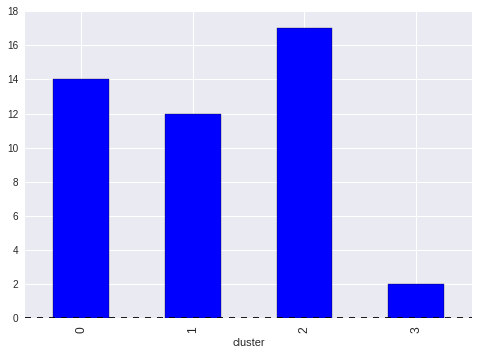

In [1071]:
X_fea.groupby(['cluster'])['ECG_HR_absdev'].count().plot(kind='bar')

In [1073]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE

Xnn_sujet1=pd.merge(Xnn_sujet,pd.DataFrame(X_fea['cluster']),left_on='sujet', right_index=True,how='inner')

cmpfeaturecluster=pd.DataFrame()

def fea_sel(ls_fea):
    #feaind=pd.DataFrame(columns=X.columns.values)
    columns=X.columns.values
    feaarray=np.zeros_like(columns)
    feaidx=dict(zip(columns,feaarray))
    for i in columns:
        if i in ls_fea:
            feaidx[i]=1
    return feaidx

for cluster, Xnn in Xnn_sujet1.groupby('cluster'): 
    print(cluster)
    y=Xnn.high
    X=Xnn.drop(['high','sujet','cluster'],axis=1)
    Xn=X.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
        #classification rate without feature selection:
        svc = SVC(kernel="linear", C=1)
        score_o = cross_val_score(svc, Xn, y, cv=5)
        # Create the RFE object and rank each pixel
        rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
        rfe.fit(Xn, y)
        selectf=Xn.columns.values[rfe.get_support()]
        Xnn=Xn[selectf]
        score_s = cross_val_score(svc, Xnn, y, cv=5)
        ncmp=pd.DataFrame(fea_sel(selectf),index=[cluster])
        ncmp['score_o_mean']=score_o.mean()
        ncmp['score_o_std']=score_o.std()
        ncmp['score_s_mean']=score_s.mean()
        ncmp['score_s_std']=score_s.std()
        cmpfeaturecluster=cmpfeaturecluster.append(ncmp)

0
1
2
3


In [1074]:
cmpfeaturecluster

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_maxgra,sfEMG_raw_mean,sfEMG_raw_median,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_vrange,score_o_mean,score_o_std,score_s_mean,score_s_std
0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0.530716,0.019045,0.570427,0.024594
1,1,0,0,0,0,0,0,1,1,0,...,0,0,0,0,1,0,0.544444,0.039769,0.621164,0.055831
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.486355,0.030900,0.582573,0.029775
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0.401986,0.062356,0.632435,0.133238


[back to content: 2016.11.22](#Réunion 2016.11.22)

<a id='Cluster of subject based on feature ranking'></a>
## Cluster of subject based on feature ranking
* cluster base on feature ranking
* comparison of feature selection on each individual

In [1093]:
np.argsort(importances)[::-1]

array([ 14, 120, 131,  37,  38,   4, 148, 123,  78,   5,  28, 151, 121,
        13, 133, 146,   6,  16,   3,  46,  23, 150, 117, 124,  92,   1,
         9, 101,  85, 130,  69,  25, 152,  76,  11, 127,  63,  93, 135,
         2,  80, 103, 129, 105, 119,  52,  77,  35, 122,  94,  15,  70,
       106,  12,  62,  59,  26, 116,  50,  58, 114,  39, 149,  88,  72,
       128, 108,  40,  71,  53,  32,  82,   0,  20, 118,  29, 140,  34,
        73,  10,   8,  65,  61,  99,  68, 104, 141, 112,  30,  27,  97,
        19,  60,  98, 109, 134,  45, 137,  22,  95, 113, 110,  42,  83,
        64,  79, 136,  47, 145,  57,  49,  24, 100,  18,  89, 107,  36,
        17, 132, 147,  21, 138, 139, 144, 143, 126, 142,   7,  81, 125,
        56,  84,  86,  75,  74,  87,  90,  91,  67,  66,  96,  55, 115,
        54,  51, 102,  48,  44,  43,  41, 111,  33,  31, 153])

In [1091]:
pd.DataFrame(dict(zip(Xnn.columns,importances)),index=[sujet])

,ECG_HR_skewness,ECG_IBI_skewness,ECG_raw_kurtosis,ECG_raw_stddev,ECG_raw_var,EDA_fre_b2,EDA_one_nbpks,EDA_ph_median,EDA_phde_maxgra,EDA_tonic_maxgra,EDA_tonic_skewness,Resp_RR_absdev,Resp_RR_min,Resp_RR_vrange,Resp_fre_b3,Resp_raw_absdev,Resp_raw_avgder,Resp_raw_skewness,sfEMG_raw_avgder,sfEMG_raw_mean
58,0.027711,0.01364,0.008413,0.011634,0.004097,0,0.005686,0.003359,0.01137,0.003589,0.009188,0.002438,0,0.001,0.014563,0.052299,0.017234,0.005906,0.014804,0.020474


In [1104]:
cmpfeature=pd.DataFrame()

for sujet, Xnn in Xnn_sujet.groupby('sujet'): 
    print(sujet)
    y=Xnn.high
    X=Xnn.drop(['high','sujet'],axis=1)
    Xn=X.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
        #classification rate without feature selection:
        svc = SVC(kernel="linear", C=1)
        score_o = cross_val_score(svc, Xn, y, cv=5)
        # feature selection with RFE 
        rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
        rfe.fit(Xn, y)
        selectf=Xn.columns.values[rfe.get_support()]
        Xn1=Xn[selectf]
        score_rfe = cross_val_score(svc, Xn1, y, cv=5)
        # feature selection with RF
        rf = RandomForestClassifier(n_estimators=200,
                              max_features=50,
                              random_state=0)
        rf.fit(Xn, y)
        importances = rf.feature_importances_
        indices = np.argsort(importances)[::-1]
        selectf=Xn.columns.values[indices[:20]]
        Xn1=Xn[selectf]
        score_rf = cross_val_score(svc, Xn1, y, cv=5)
        
        ncmp=pd.DataFrame(dict(zip(Xnn.columns,importances)),index=[sujet])
        ncmp['nevent']=len(Xnn)
        ncmp['score_o_mean']=score_o.mean()
        ncmp['score_rfe_mean']=score_rfe.mean()
        ncmp['score_rf_mean']=score_rf.mean()
        ncmp['score_o_std']=score_o.std()
        ncmp['score_rfe_std']=score_rfe.std()
        ncmp['score_rf_std']=score_rf.std()
        cmpfeature=cmpfeature.append(ncmp)

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58


In [1099]:
cmpfeature

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_skewness,sfEMG_raw_vrange,sujet,nevent,score_o_mean,score_rfe_mean,score_rf_mean,score_o_std,score_rfe_std,score_rf_std
2,0.013277,0.004571,0.003659,0.008969,0.009653,0.002691,0.006097,0.000000,0.013322,0.006427,...,0.005024,0.005172,0.005918,47,0.523889,0.862778,0.628333,0.145505,0.125556,0.142166
3,0.003570,0.000000,0.014428,0.006967,0.000000,0.001597,0.008203,0.003847,0.011693,0.000000,...,0.011626,0.000000,0.002377,46,0.717778,0.911111,0.757778,0.111466,0.083148,0.111643
4,0.006882,0.018839,0.033038,0.010000,0.010339,0.017263,0.005000,0.004286,0.010000,0.007544,...,0.000000,0.000000,0.011148,32,0.812381,0.971429,0.812381,0.053333,0.057143,0.053333
5,0.022285,0.000927,0.000902,0.002984,0.019869,0.004122,0.005439,0.002221,0.001442,0.004890,...,0.003332,0.010562,0.003843,43,0.536111,0.930556,0.627778,0.250863,0.090438,0.162304
6,0.000000,0.003704,0.028679,0.023355,0.000000,0.000000,0.000000,0.007500,0.000000,0.000000,...,0.016495,0.004267,0.002344,20,0.570000,0.960000,0.636667,0.290861,0.080000,0.226667
8,0.008440,0.017755,0.001714,0.016169,0.014192,0.002917,0.023393,0.001930,0.016562,0.009470,...,0.018125,0.010764,0.000000,21,0.550000,0.920000,0.533333,0.252982,0.097980,0.091894
10,0.022713,0.001691,0.004195,0.005916,0.019406,0.017525,0.008471,0.004137,0.004044,0.005155,...,0.007501,0.014995,0.011028,43,0.443333,0.790000,0.705556,0.128819,0.132853,0.130112
11,0.001563,0.006364,0.000000,0.000000,0.001534,0.000000,0.000000,0.018387,0.003609,0.001905,...,0.010802,0.001905,0.014547,24,0.466667,1.000000,0.750000,0.281859,0.000000,0.052705
12,0.004768,0.007176,0.028652,0.003757,0.001438,0.001422,0.000000,0.018229,0.000000,0.008337,...,0.004101,0.033966,0.001897,43,0.669444,0.908333,0.833333,0.143909,0.084071,0.160295
13,0.014750,0.000000,0.000000,0.010000,0.020000,0.036316,0.004656,0.002471,0.000000,0.010000,...,0.003684,0.000000,0.012333,21,0.853333,0.920000,0.920000,0.129271,0.097980,0.097980


In [1100]:
from sklearn.cluster import KMeans
X_fea=cmpfeature.iloc[:,:164]
random_state=1
y_pred = KMeans(n_clusters=4, random_state=random_state).fit_predict(X_fea)
X_fea['cluster']=y_pred

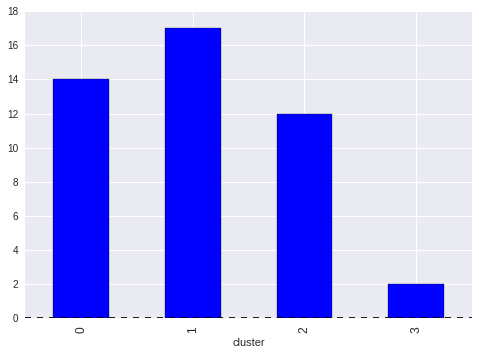

In [1101]:
X_fea.groupby(['cluster'])['ECG_HR_absdev'].count().plot(kind='bar')

In [1102]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE

Xnn_sujet1=pd.merge(Xnn_sujet,pd.DataFrame(X_fea['cluster']),left_on='sujet', right_index=True,how='inner')

cmpfeaturecluster=pd.DataFrame()

def fea_sel(ls_fea):
    #feaind=pd.DataFrame(columns=X.columns.values)
    columns=X.columns.values
    feaarray=np.zeros_like(columns)
    feaidx=dict(zip(columns,feaarray))
    for i in columns:
        if i in ls_fea:
            feaidx[i]=1
    return feaidx

for cluster, Xnn in Xnn_sujet1.groupby('cluster'): 
    print(cluster)
    y=Xnn.high
    X=Xnn.drop(['high','sujet','cluster'],axis=1)
    Xn=X.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
        #classification rate without feature selection:
        svc = SVC(kernel="linear", C=1)
        score_o = cross_val_score(svc, Xn, y, cv=5)
        # Create the RFE object and rank each pixel
        rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
        rfe.fit(Xn, y)
        selectf=Xn.columns.values[rfe.get_support()]
        Xnn=Xn[selectf]
        score_s = cross_val_score(svc, Xnn, y, cv=5)
        ncmp=pd.DataFrame(fea_sel(selectf),index=[cluster])
        ncmp['score_o_mean']=score_o.mean()
        ncmp['score_o_std']=score_o.std()
        ncmp['score_s_mean']=score_s.mean()
        ncmp['score_s_std']=score_s.std()
        cmpfeaturecluster=cmpfeaturecluster.append(ncmp)

0
1
2
3


In [1103]:
cmpfeaturecluster

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_maxgra,sfEMG_raw_mean,sfEMG_raw_median,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_vrange,score_o_mean,score_o_std,score_s_mean,score_s_std
0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0.530716,0.019045,0.570427,0.024594
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.486355,0.030900,0.582573,0.029775
2,1,0,0,0,0,0,0,1,1,0,...,0,0,0,0,1,0,0.544444,0.039769,0.621164,0.055831
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0.401986,0.062356,0.632435,0.133238


## Select the best K for kmeans cluster

In [1106]:
cmpfeature.head()

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_mean,sfEMG_raw_median,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_vrange,nevent,score_o_mean,score_o_std,score_s_mean,score_s_std
2,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,47,0.523889,0.145505,0.862778,0.125556
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,46,0.717778,0.111466,0.911111,0.083148
4,0,1,0,0,0,1,0,0,0,0,...,1,0,0,0,0,32,0.812381,0.053333,0.971429,0.057143
5,0,0,0,0,1,0,0,0,0,0,...,1,0,1,0,0,43,0.536111,0.250863,0.930556,0.090438
6,1,1,1,1,1,0,0,0,0,0,...,0,0,0,0,0,20,0.570000,0.290861,0.960000,0.080000


In [1127]:
from sklearn import metrics
from sklearn.cluster import spectral_clustering

X_fea=cmpfeature.iloc[:,:164]
random_state=range(100)
cmpbestK=pd.DataFrame()
ct=0
for K in range(2,14):
    print(K)
    for r_s in random_state: 
        ct=ct+1
        y_pred = KMeans(n_clusters=K, random_state=r_s).fit_predict(X_fea)
        spectral_clustering(graph, n_clusters=K, eigen_solver='arpack')
        score=metrics.silhouette_score(X_fea, y_pred, metric='euclidean')
        ncmp=pd.DataFrame(dict(zip(cmpfeature.index.values,y_pred)),index=[ct])
        ncmp['score']=score
        ncmp['K']=K
        cmpbestK=cmpbestK.append(ncmp)

2
3
4
5
6
7
8
9
10
11
12
13


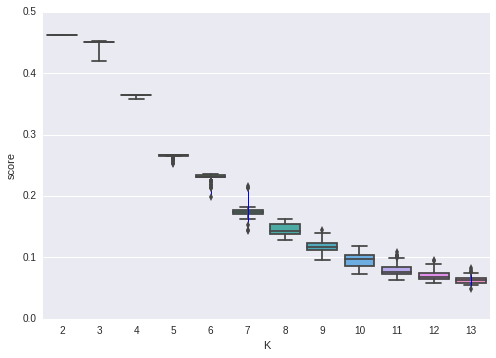

In [1131]:
ax = sns.boxplot(x="K", y="score", data=cmpbestK)

## Hierarchical clustering of features

In [1249]:
suidx=cmpfeature.sort('score_s_mean', inplace=False)[10:].index

In [1264]:
subadidx=cmpfeature.sort('score_s_mean', inplace=False)[:10].index
subadidx

Int64Index([24, 14, 19, 27, 54, 26, 18, 17, 30, 28], dtype='int64')

In [1275]:
cmpfeature.merge(begsub,left_index=True, right_on='sujet',how='inner')

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_skewness,sfEMG_raw_vrange,nb_fea,nevent,score_o_mean,score_o_std,score_s_mean,score_s_std,sujet,niveausub
2,0,0,0,0,0,0,0,0,0,0,...,0,0,120,46,0.826667,0.051448,0.891111,0.004444,3,2
7,0,0,0,0,0,0,0,0,0,0,...,0,0,120,21,0.556667,0.137275,0.640000,0.274591,8,2
10,0,0,0,0,0,0,0,0,0,0,...,0,0,120,24,0.750000,0.052705,0.850000,0.133333,11,2
15,0,0,0,0,0,0,0,0,0,0,...,0,0,120,29,0.600000,0.249444,0.660000,0.142049,16,2
21,0,0,0,0,0,0,0,0,0,0,...,0,0,120,35,0.473810,0.230399,0.698810,0.195020,22,1
28,0,0,0,0,0,0,0,0,0,0,...,0,0,120,23,0.653333,0.195050,0.840000,0.149666,29,2
29,0,0,0,0,0,0,0,0,0,0,...,0,0,120,20,0.420000,0.157198,0.590000,0.139682,30,2
32,0,0,0,0,0,0,0,0,0,0,...,0,0,120,31,0.727619,0.171254,0.904762,0.078246,33,2
35,0,0,0,0,0,0,0,0,0,0,...,0,0,120,40,0.955556,0.054433,0.955556,0.054433,36,1
46,0,0,0,0,0,0,0,0,0,0,...,0,0,120,28,0.866667,0.124722,0.900000,0.081650,47,1


In [1259]:
a=list(subadidx)

In [1271]:
profsub[profsub['sujet'].isin(a)]

,sujet,niveausub
13,14,4
16,17,4
17,18,5
18,19,3
23,24,3
25,26,3
26,27,3
27,28,3
53,54,5


In [1272]:
profsub[~profsub['sujet'].isin(a)]

,sujet,niveausub
1,2,4
3,4,3
4,5,5
5,6,3
6,7,5
8,9,4
9,10,4
11,12,4
12,13,4
14,15,3


In [1410]:
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

X_fea=X_fea[suidx]
X_fea=cmpfeature.iloc[:,:-6]
# generate the linkage matrix
Z = linkage(X_fea, method='complete',metric='hamming')
c, coph_dists = cophenet(Z, pdist(X_fea))
#c
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

ValueError: negative dimensions are not allowed

In [1276]:
Z[0] # for the first agglo [idx,  idx, distance, nb_in_cluster]

array([  2.,  41.,   0.,   2.])

In [1189]:
X_fea.shape

(45, 154)

In [1180]:
X=X_fea.iloc[[15,20]]
Y = pdist(X, 'hamming')

In [1188]:
np.abs(np.diff(np.array(X),axis=0)).sum()

22

<a id='Réunion 2016.12.02'></a>

# Réunion 2016.12.02
* [Réunion 2016.12.02](#Réunion 2016.12.02)
* [Individual regression](#Individual regression)
* [Number of features needed for making good individual classification](#nb feature indi)
* [Size for the most effective features set](#eff fea)
* [Cluster of subject - feature wise](#cluster sub feature)
* Cluster of subject - signal wise
    * sigfeacluster.ipynb
* Decision tree for individual
    *tree
    *individual signal plot
    Remark: data quality
* Match based learning

## Plan
* Review database description article, make outline for our database (mardi 13,dec)
* First version of article on database (fin dec)

# Number of features needed for making good individual classification

## emotion arousal: high vs low

In [1419]:
y_ar=eventLabel.iloc[18:,1]
X=DF['20s'].join(y_ar,how='inner')
X.head()

,sujet,ECG_raw_mean,ECG_raw_median,ECG_raw_max,ECG_raw_min,ECG_raw_vrange,ECG_raw_var,ECG_raw_stddev,ECG_raw_avgder,ECG_raw_maxgra,...,Resp_Ampup_mean,Resp_Ampup_max,Resp_Ampup_min,Resp_Ampup_vrange,Resp_Ampup_avgder,Resp_Ampup_maxgra,Resp_Ampup_absdev,Resp_Ampup_kurtosis,Resp_Ampup_skewness,high
eventidx,,,,,,,,,,,,,,,,,,,,,
18,2,-0.676255,0.017119,-1.789465,0.489156,-1.369097,-1.972292,-1.992517,0.646479,-2.047862,...,-0.449223,-0.754732,-0.103999,-0.938180,-0.123218,-0.731820,-0.953438,2.560772,-2.520112,1
19,2,-0.094325,-0.983920,-2.077616,0.630765,-1.632249,-1.873250,-1.886956,-0.115413,-2.066838,...,-0.608117,-0.718555,-0.559278,-0.644232,-0.127995,-0.624444,-0.706549,0.614415,-0.995620,1
20,2,0.071147,-0.768972,-2.216446,0.570811,-1.671956,-1.680142,-1.682600,-0.228325,-2.206339,...,-0.284586,-0.264912,-0.205224,-0.238035,0.792475,-0.389146,-0.023452,-0.962222,0.307639,1
21,2,0.076285,-0.311708,-2.147545,0.644436,-1.682052,-2.011211,-2.034140,-0.085891,-2.030301,...,-0.940244,-1.060074,-0.638381,-1.051429,-0.266165,-0.874688,-0.940169,-0.781403,-0.804197,0
22,2,-0.085260,-0.732947,-1.974493,0.588749,-1.543958,-2.266504,-2.309191,0.191727,-1.783428,...,-0.949861,-1.049494,-0.581031,-1.068513,-0.392518,-0.851201,-1.000337,0.059458,0.631071,1


In [8]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE
from sklearn.dummy import DummyClassifier

y_ar=eventLabel.iloc[18:,1]
X=DF['20s'].join(y_ar,how='inner')

cmpfeature=pd.DataFrame()
for sujet, Xnn in X.groupby('sujet'): 
    print(sujet)
    y=Xnn.high
    Xn=Xnn.drop(['high','sujet'],axis=1)
    Xn=Xn.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
        #classification rate without feature selection:
        for nb_fea in range(10,130,10):
            dum = DummyClassifier(strategy='stratified',random_state=0)
            score_d = cross_val_score(dum, Xn, y, cv=5)
            svc = SVC(kernel="linear", C=1)
            score_o = cross_val_score(svc, Xn, y, cv=5)
            # Create the RFE object and rank each pixel
            rfe = RFE(estimator=svc, n_features_to_select=nb_fea, step=5)
            rfe.fit(Xn, y)
            selectf=Xn.columns.values[rfe.get_support()]
            Xns=Xn[selectf]
            score_s = cross_val_score(svc, Xns, y, cv=5)
            ncmp=pd.DataFrame(fea_sel(selectf),index=[sujet])
            ncmp['nb_fea']=nb_fea
            ncmp['nevent']=len(Xnn)
            ncmp['score_d_mean']=score_d.mean()
            ncmp['score_o_mean']=score_o.mean()
            ncmp['score_s_mean']=score_s.mean()
            ncmp['score_d_std']=score_d.std()
            ncmp['score_o_std']=score_o.std()
            ncmp['score_s_std']=score_s.std()
            cmpfeature=cmpfeature.append(ncmp)

2
3
4


/local/wenlu/anaconda2/lib/python2.7/site-packages/sklearn/model_selection/_split.py:581: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of groups for any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


5
6
7
8
9
10
11
12
13


/local/wenlu/anaconda2/lib/python2.7/site-packages/sklearn/model_selection/_split.py:581: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of groups for any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31


/local/wenlu/anaconda2/lib/python2.7/site-packages/sklearn/model_selection/_split.py:581: Warning: The least populated class in y has only 3 members, which is too few. The minimum number of groups for any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58


In [9]:
cmpfeature[cmpfeature['nb_fea']==20].head()

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_vrange,sujet,nb_fea,nevent,score_d_mean,score_o_mean,score_s_mean,score_d_std,score_o_std,score_s_std
2,0,0,0,0,0,1,0,1,0,0,...,0,0,20,47,0.503333,0.523889,0.862778,0.155063,0.145505,0.125556
3,0,0,0,0,0,0,0,0,0,0,...,1,0,20,46,0.762222,0.717778,0.911111,0.031111,0.111466,0.083148
4,0,1,0,0,0,1,0,0,0,0,...,0,0,20,32,0.880952,0.812381,0.971429,0.060234,0.053333,0.057143
5,0,0,0,0,1,0,0,0,0,0,...,0,0,20,43,0.722222,0.536111,0.930556,0.115537,0.250863,0.090438
6,1,1,1,1,1,0,0,0,0,0,...,0,0,20,20,0.810000,0.570000,0.960000,0.096954,0.290861,0.080000


In [11]:
tmp=cmpfeature[cmpfeature['nb_fea']==20]

In [19]:
tmp1=tmp[tmp['score_d_mean']<0.7]

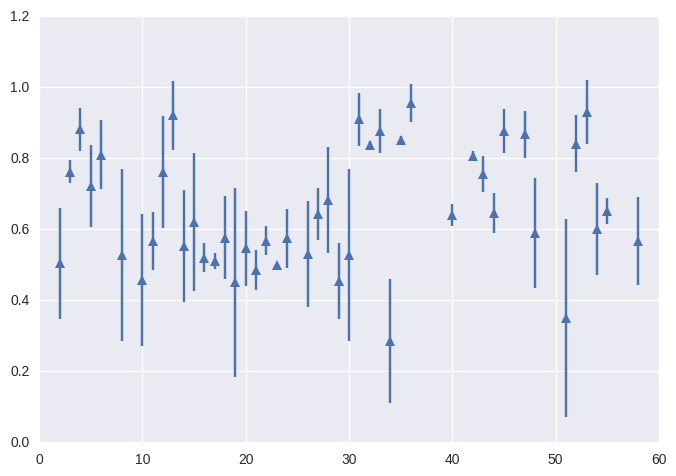

In [13]:
import matplotlib.pyplot as plt
import numpy as np

x = tmp.index
y = tmp.score_d_mean
e = tmp.score_d_std

plt.errorbar(x, y, e, linestyle='None', marker='^')

plt.show()

In [ ]:
x = tmp.index
y = tmp.score_d_mean
e = tmp.score_d_std

plt.errorbar(x, y, e, linestyle='None', marker='^')

plt.show()

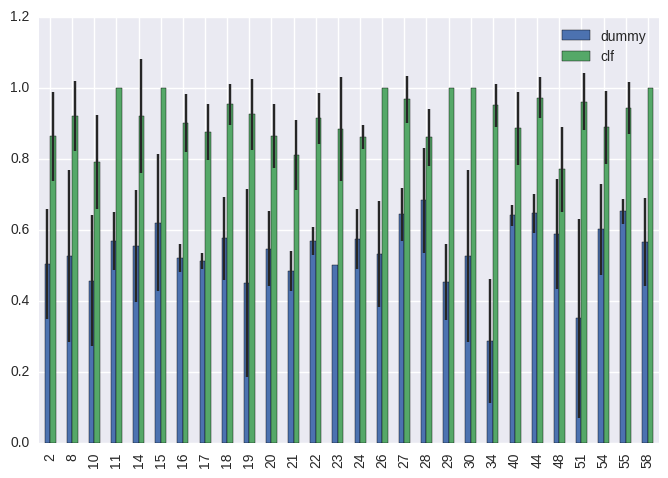

In [20]:
means=tmp1[['score_d_mean','score_s_mean']]
means.columns=['dummy','clf']
errors=tmp1[['score_d_std','score_s_std']]
errors.columns=['dummy','clf']
fig, ax = plt.subplots()
means.plot.bar(yerr=errors, ax=ax)

In [15]:
g = sns.factorplot(x=index, y="score_d_mean", data=tmp)

NameError: name 'index' is not defined

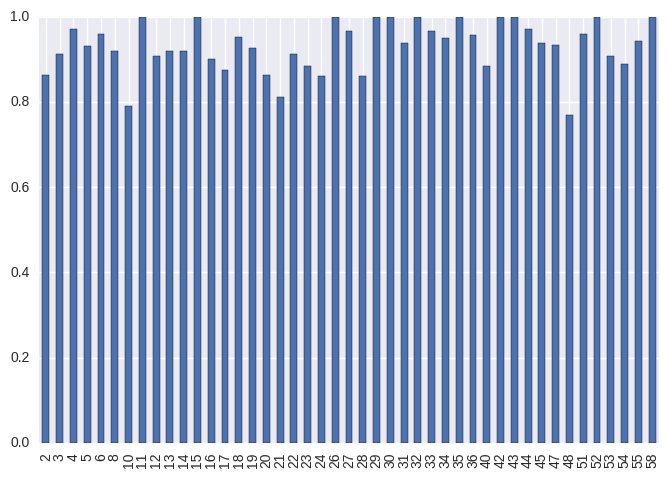

In [27]:
tmp.score_s_mean.plot(kind='bar')

<a id='nb feature indi'></a>
### Number of features needed

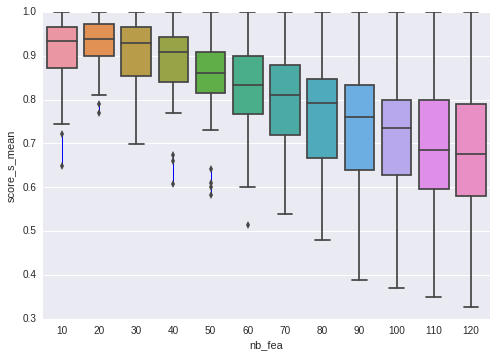

In [1422]:
ax = sns.boxplot(x="nb_fea", y="score_s_mean", data=cmpfeature)

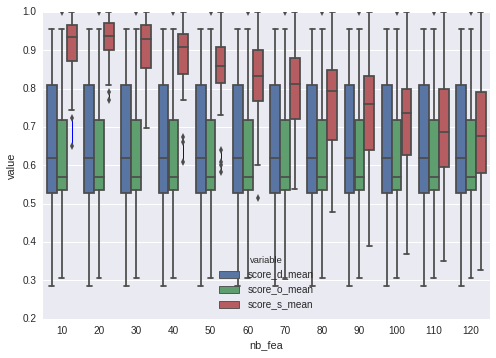

In [1423]:
tmp=cmpfeature.ix[:,['nb_fea','score_d_mean','score_o_mean','score_s_mean']]
dosdf=pd.melt(tmp, id_vars=['nb_fea'], value_vars=['score_d_mean','score_o_mean','score_s_mean'])
ax = sns.boxplot(x="nb_fea", y="value", hue="variable", data=dosdf)

[back to Réunion 2016.12.02](#Réunion 2016.12.02)

## The most selected features

In [12]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE
y_ar=eventLabel.iloc[18:,1]
X=DF['20s'].join(y_ar,how='inner')
X.head()
cmpfeature_fs=pd.DataFrame()
for sujet, Xnn in X.groupby('sujet'): 
    print(sujet)
    y=Xnn.high
    Xn=Xnn.drop(['high','sujet'],axis=1)
    Xn=Xn.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
            svc = SVC(kernel="linear", C=1)
            score_o = cross_val_score(svc, Xn, y, cv=5)
            # Create the RFE object and rank each pixel
            rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
            rfe.fit(Xn, y)
            selectf=Xn.columns.values[rfe.get_support()]
            Xnn=Xn[selectf]
            score_s = cross_val_score(svc, Xnn, y, cv=5)
            ncmp=pd.DataFrame(fea_sel(selectf),index=[sujet])
            ncmp['nevent']=len(Xnn)
            ncmp['score_o_mean']=score_o.mean()
            ncmp['score_o_std']=score_o.std()
            ncmp['score_s_mean']=score_s.mean()
            ncmp['score_s_std']=score_s.std()
            cmpfeature_fs=cmpfeature_fs.append(ncmp)

2


NameError: name 'fea_sel' is not defined

In [72]:
cmpfeature_fs.head()

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_median,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_vrange,sujet,nevent,score_o_mean,score_o_std,score_s_mean,score_s_std
2,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,47,0.523889,0.145505,0.862778,0.125556
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,46,0.717778,0.111466,0.911111,0.083148
4,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,32,0.812381,0.053333,0.971429,0.057143
5,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,43,0.536111,0.250863,0.930556,0.090438
6,1,1,1,1,1,0,0,0,0,0,...,0,0,0,0,0,20,0.570000,0.290861,0.960000,0.080000


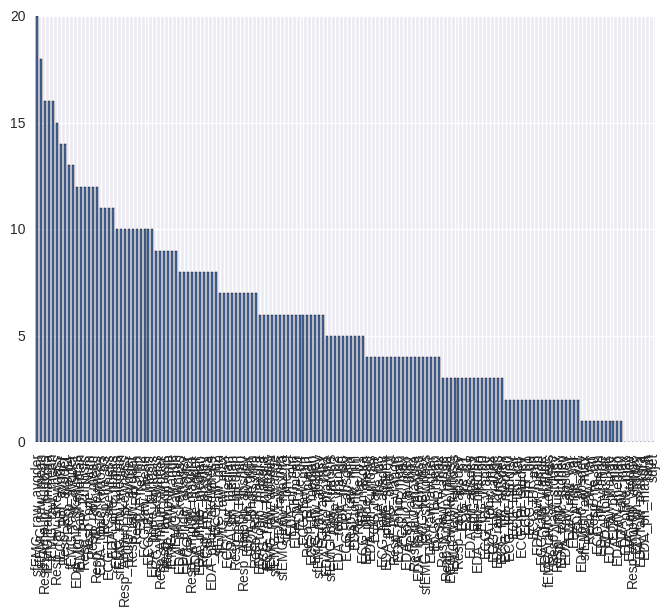

In [82]:
fea_rank=cmpfeature_fs.iloc[:,:-5].sum().sort(inplace=False,ascending=False)
fea_rank.plot(kind='bar')

In [84]:
fea_rank.to_csv('./../out/fearank.csv',encoding='utf-8')

## Determined the size most effective features set

In [74]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE


y_ar=eventLabel.iloc[18:,1]
X=DF['20s'].join(y_ar,how='inner')
X.head()
cmpfeature_set=pd.DataFrame()
for sujet, Xnn in X.groupby('sujet'): 
    print(sujet)
    y=Xnn.high
    Xn=Xnn.drop(['high','sujet'],axis=1)
    Xn=Xn.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
        #classification rate without feature selection:
        for nb_feabase in range(30,130,10):
            svc = SVC(kernel="linear", C=1)
            Xn1=Xn[fea_rank.index[:nb_feabase]]
            score_o = cross_val_score(svc, Xn1, y, cv=5)
            # Create the RFE object and rank each pixel
            rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
            rfe.fit(Xn1, y)
            selectf=Xn1.columns.values[rfe.get_support()]
            Xnn=Xn1[selectf]
            score_s = cross_val_score(svc, Xnn, y, cv=5)
            ncmp=pd.DataFrame(fea_sel(selectf),index=[sujet])
            ncmp['nb_feabase']=nb_feabase
            ncmp['nevent']=len(Xnn)
            ncmp['score_o_mean']=score_o.mean()
            ncmp['score_o_std']=score_o.std()
            ncmp['score_s_mean']=score_s.mean()
            ncmp['score_s_std']=score_s.std()
            cmpfeature_set=cmpfeature_set.append(ncmp)

<a id='eff fea'></a>
### Size for the most effective features set

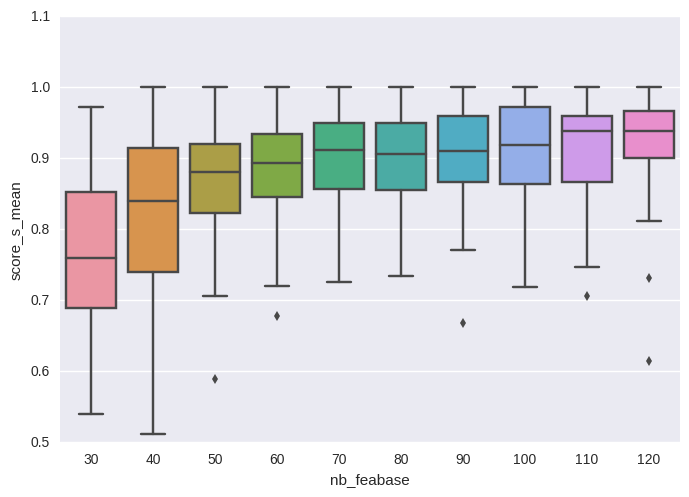

In [75]:
ax = sns.boxplot(x="nb_feabase", y="score_s_mean", data=cmpfeature_set)

[back to Réunion 2016.12.02](#Réunion 2016.12.02)

In [76]:
selected_i=fea_rank[:70].index.values

In [77]:
# Clustering 
cmpfeature_set[cmpfeature_set['nb_feabase']==50].iloc[:,:-6].head()

,ECG_HR_absdev,ECG_HR_avgder,ECG_HR_b0,ECG_HR_b1,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_max,ECG_HR_maxgra,ECG_HR_mean,ECG_HR_median,...,sfEMG_raw_avgder,sfEMG_raw_kurtosis,sfEMG_raw_max,sfEMG_raw_maxgra,sfEMG_raw_mean,sfEMG_raw_median,sfEMG_raw_min,sfEMG_raw_skewness,sfEMG_raw_vrange,sujet
2,0,1,0,0,0,1,0,1,0,0,...,1,0,0,0,0,1,0,0,0,0
3,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,1,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
5,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,1,0,1,0,0,0
6,0,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


<a id='cluster sub feature'></a>
### Cluster of subject - feature wise

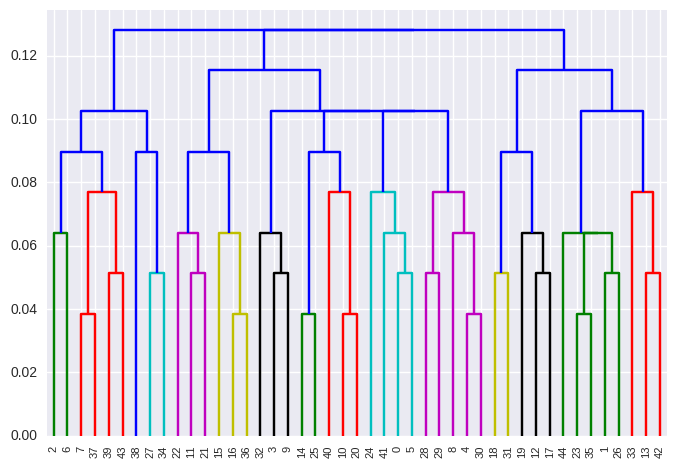

In [78]:
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

#X_fea=X_fea[suidx]
X_fea=cmpfeature_set[cmpfeature_set['nb_feabase']==30].iloc[:,:-6]
# generate the linkage matrix
Z = linkage(X_fea, method='complete',metric='hamming')
c, coph_dists = cophenet(Z, pdist(X_fea))
#c
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

In [80]:
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
def my_hierarcyclustering(features):
    Z = linkage(features, method='complete',metric='hamming')
    c, coph_dists = cophenet(Z, pdist(features))
    #c
    dendrogram(
        Z,
        leaf_rotation=90.,  # rotates the x axis labels
        leaf_font_size=8.,  # font size for the x axis labels
    )
    plt.show()

## Select subject

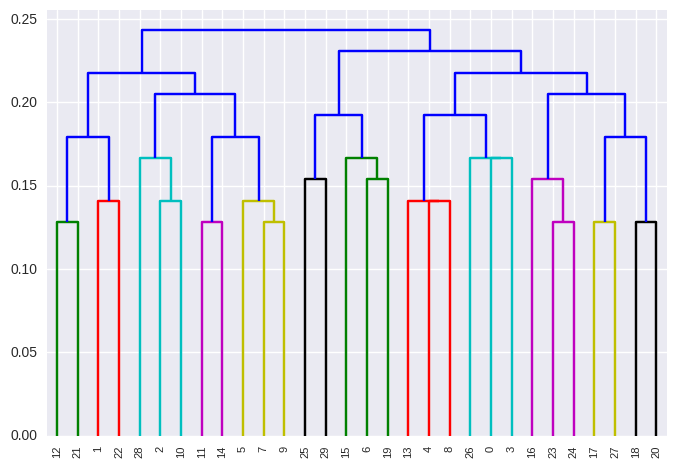

In [81]:
n_bestsub=30
n_featureset=70
sujet_best=cmpfeature_set[cmpfeature_set['nb_feabase']==n_featureset].sort(['score_s_mean'],inplace=False,ascending=False)[:n_bestsub]
featureclu=sujet_best.iloc[:,:-6]
my_hierarcyclustering(featureclu)

## Camparing with general feature selection: overlapping features

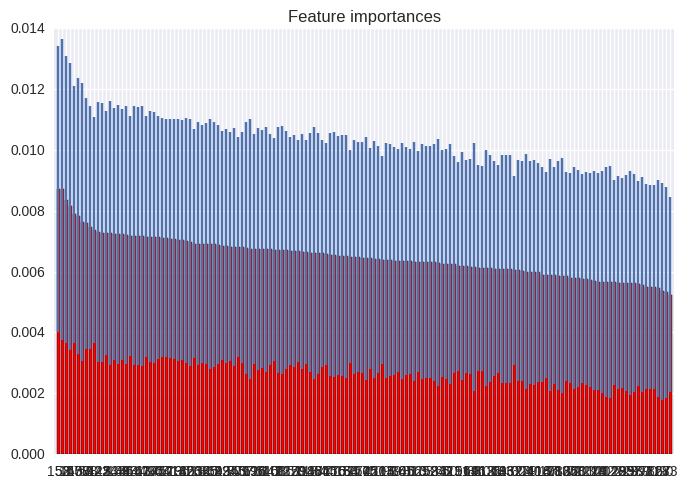

In [33]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier

y_ar=eventLabel.iloc[18:,1]
X=DF['20s'].join(y_ar,how='inner')

Xn=X.drop(['sujet','high'],axis=1)
y=X['high']
# Build a forest and compute the feature importances
forest = ExtraTreesClassifier(n_estimators=300,
                              max_features=20)

forest.fit(Xn, y)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(Xn.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(Xn.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(Xn.shape[1]), indices)
plt.xlim([-1, Xn.shape[1]])
plt.show()

In [35]:
selected_g=Xn.columns[indices[:70]].values

In [36]:
len(list(set(selected_i) & set(selected_g)))

51

## Performance on most effective set

In [1488]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE
# Number of features of most effective set
selected_s=fea_rank[:50].index.values

y_ar=eventLabel.iloc[18:,1]
X=DF['20s'].join(y_ar,how='inner')
X=pd.concat([X[selected_s],X[['high','sujet']]],axis=1)
cmpfeature_s_set=pd.DataFrame()
for sujet, Xnn in X.groupby(['sujet']): 
    print(sujet)
    y=Xnn.high
    X=Xnn.drop(['high','sujet'],axis=1)
    Xn=X.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
            svc = SVC(kernel="linear", C=1)
            score_o = cross_val_score(svc, Xn, y, cv=5)
            # Create the RFE object and rank each pixel
            rfe = RFE(estimator=svc, n_features_to_select=20, step=5)
            rfe.fit(Xn, y)
            selectf=Xn.columns.values[rfe.get_support()]
            Xnn=Xn[selectf]
            score_s = cross_val_score(svc, Xnn, y, cv=5)
            ncmp=pd.DataFrame(fea_sel(selectf),index=[sujet])
            ncmp['nevent']=len(Xnn)
            ncmp['score_o_mean']=score_o.mean()
            ncmp['score_o_std']=score_o.std()
            ncmp['score_s_mean']=score_s.mean()
            ncmp['score_s_std']=score_s.std()
            cmpfeature_s_set=cmpfeature_s_set.append(ncmp)

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58


In [1489]:
cmpfeature_s_set.sort('score_s_mean',inplace=False)

,ECG_HR_avgder,ECG_HR_b2,ECG_HR_kurtosis,ECG_HR_maxgra,ECG_HR_min,ECG_HR_skewness,ECG_IBI_avgder,ECG_IBI_kurtosis,ECG_IBI_skewness,ECG_raw_avgder,...,fEMG_raw_vrange,sfEMG_raw_avgder,sfEMG_raw_mean,sfEMG_raw_median,sfEMG_raw_min,nevent,score_o_mean,score_o_std,score_s_mean,score_s_std
54,0,0,0,0,1,0,1,0,0,0,...,0,1,0,0,0,43,0.473889,0.228715,0.588333,0.124007
21,0,0,0,0,1,0,0,0,1,1,...,1,0,0,0,0,64,0.595055,0.086276,0.719963,0.101770
19,1,0,0,0,1,0,0,1,0,0,...,1,1,0,1,1,37,0.460714,0.144808,0.732143,0.117369
10,1,1,1,0,0,0,0,0,0,0,...,0,1,0,0,0,43,0.571111,0.149367,0.772778,0.153180
34,0,0,1,0,0,0,0,0,0,0,...,1,1,1,1,0,37,0.532143,0.160675,0.782143,0.114286
24,1,0,0,0,1,1,0,0,0,0,...,1,1,0,1,1,49,0.561616,0.153801,0.797980,0.139233
20,0,0,1,0,0,1,0,0,0,0,...,0,1,1,1,0,58,0.685664,0.060686,0.804312,0.137201
55,1,1,0,1,0,1,0,1,0,0,...,1,1,0,0,1,37,0.619048,0.153797,0.804762,0.139413
5,0,1,0,0,0,1,1,0,0,1,...,0,0,1,0,1,43,0.555556,0.222396,0.811111,0.142346
27,0,0,0,0,1,1,0,0,0,1,...,1,0,0,0,0,33,0.502381,0.173728,0.822619,0.174980


## Best subject classification with decision tree

In [7]:
import sys
# sys.setdefaultencoding() does not exist, here!
reload(sys)  # Reload does the trick!
sys.setdefaultencoding('UTF8')

In [15]:
list(Xn.columns.values)

[u'ECG_raw_mean',
 u'ECG_raw_median',
 u'ECG_raw_max',
 u'ECG_raw_min',
 u'ECG_raw_vrange',
 u'ECG_raw_var',
 u'ECG_raw_stddev',
 u'ECG_raw_avgder',
 u'ECG_raw_maxgra',
 u'ECG_raw_absdev',
 u'ECG_raw_kurtosis',
 u'ECG_raw_skewness',
 u'ECG_fre_b0',
 u'ECG_fre_b1',
 u'ECG_fre_b2',
 u'ECG_IBI_mean',
 u'ECG_IBI_median',
 u'ECG_IBI_max',
 u'ECG_IBI_min',
 u'ECG_IBI_vrange',
 u'ECG_IBI_var',
 u'ECG_IBI_stddev',
 u'ECG_IBI_avgder',
 u'ECG_IBI_maxgra',
 u'ECG_IBI_absdev',
 u'ECG_IBI_kurtosis',
 u'ECG_IBI_skewness',
 u'ECG_HR_mean',
 u'ECG_HR_median',
 u'ECG_HR_max',
 u'ECG_HR_min',
 u'ECG_HR_vrange',
 u'ECG_HR_var',
 u'ECG_HR_stddev',
 u'ECG_HR_avgder',
 u'ECG_HR_maxgra',
 u'ECG_HR_absdev',
 u'ECG_HR_kurtosis',
 u'ECG_HR_skewness',
 u'ECG_HR_b0',
 u'ECG_HR_b1',
 u'ECG_HR_b2',
 u'fEMG_raw_mean',
 u'fEMG_raw_median',
 u'fEMG_raw_max',
 u'fEMG_raw_min',
 u'fEMG_raw_vrange',
 u'fEMG_raw_avgder',
 u'fEMG_raw_maxgra',
 u'fEMG_raw_absdev',
 u'fEMG_raw_kurtosis',
 u'fEMG_raw_skewness',
 u'fEMG_one_ct

In [14]:
type(iris.feature_names)

list

In [22]:
### from sklearn import tree
import pydotplus 
from sklearn import tree
from IPython.display import Image
sujnum=54
y_ar=eventLabel.iloc[18:,1]
X=DF['20s'].join(y_ar,how='inner')
X=X[X['sujet']==sujnum]

Y=X.high
Xn=X.drop(['high','sujet'],axis=1)
Xn=Xn.dropna(axis=1,how='any')
    
clf = tree.DecisionTreeClassifier()
clf = clf.fit(Xn, Y)

with open("iris.dot", 'w') as f:
    f = tree.export_graphviz(clf, out_file=f, 
                         feature_names=list(Xn.columns.values),  
                         class_names=['low','high'],  
                         filled=True, rounded=True,  
                         special_characters=True)
#graph = pydotplus.graph_from_dot_data(f)  
#Image(graph.create_png()) 
#cross_val_score(clf, Xn, Y, cv=10)

## Individual regression 

In [1370]:
X.head()

,sujet,ECG_raw_mean,ECG_raw_median,ECG_raw_max,ECG_raw_min,ECG_raw_vrange,ECG_raw_var,ECG_raw_stddev,ECG_raw_avgder,ECG_raw_maxgra,...,Resp_Ampup_mean,Resp_Ampup_max,Resp_Ampup_min,Resp_Ampup_vrange,Resp_Ampup_avgder,Resp_Ampup_maxgra,Resp_Ampup_absdev,Resp_Ampup_kurtosis,Resp_Ampup_skewness,arousal
eventidx,,,,,,,,,,,,,,,,,,,,,
18,2,-0.676255,0.017119,-1.789465,0.489156,-1.369097,-1.972292,-1.992517,0.646479,-2.047862,...,-0.449223,-0.754732,-0.103999,-0.938180,-0.123218,-0.731820,-0.953438,2.560772,-2.520112,2
19,2,-0.094325,-0.983920,-2.077616,0.630765,-1.632249,-1.873250,-1.886956,-0.115413,-2.066838,...,-0.608117,-0.718555,-0.559278,-0.644232,-0.127995,-0.624444,-0.706549,0.614415,-0.995620,2
20,2,0.071147,-0.768972,-2.216446,0.570811,-1.671956,-1.680142,-1.682600,-0.228325,-2.206339,...,-0.284586,-0.264912,-0.205224,-0.238035,0.792475,-0.389146,-0.023452,-0.962222,0.307639,3
21,2,0.076285,-0.311708,-2.147545,0.644436,-1.682052,-2.011211,-2.034140,-0.085891,-2.030301,...,-0.940244,-1.060074,-0.638381,-1.051429,-0.266165,-0.874688,-0.940169,-0.781403,-0.804197,0
22,2,-0.085260,-0.732947,-1.974493,0.588749,-1.543958,-2.266504,-2.309191,0.191727,-1.783428,...,-0.949861,-1.049494,-0.581031,-1.068513,-0.392518,-0.851201,-1.000337,0.059458,0.631071,2


2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


/usr/lib/python2.7/dist-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58


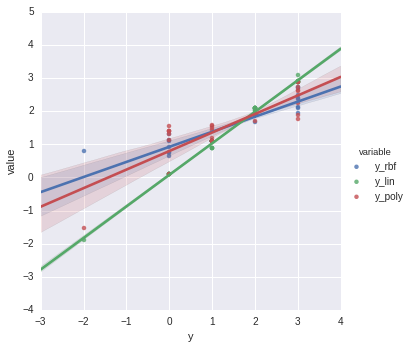

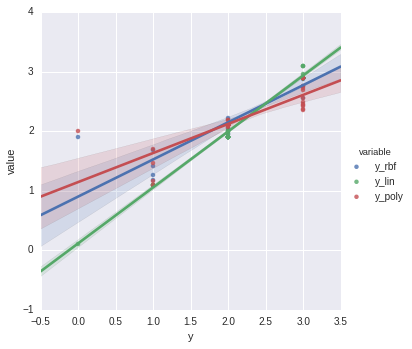

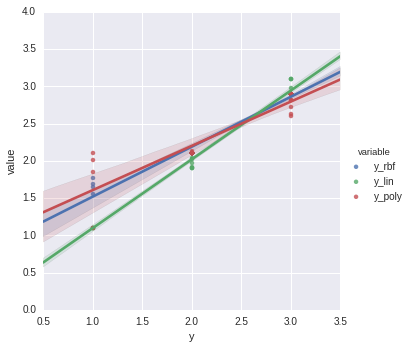

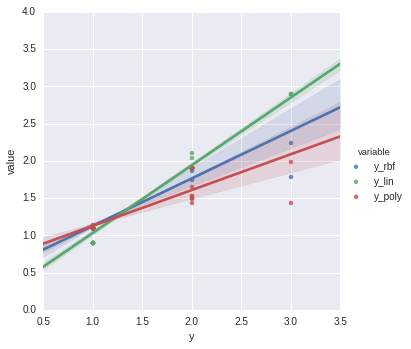

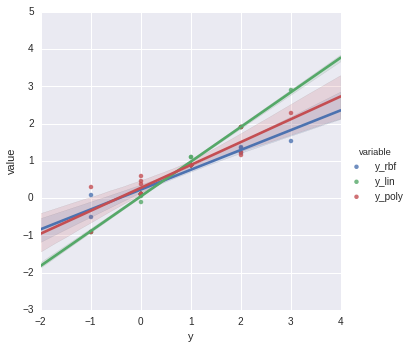

...

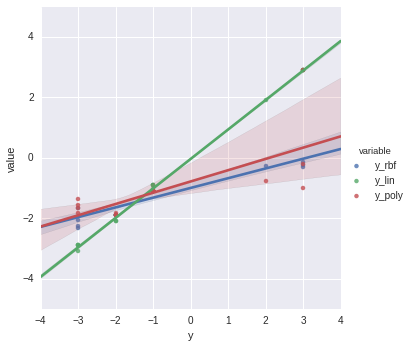

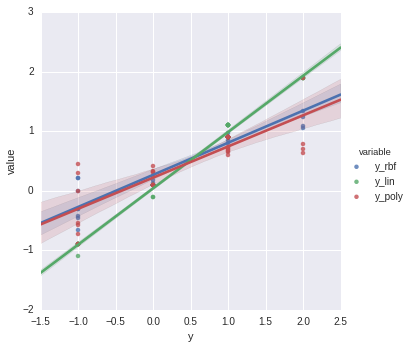

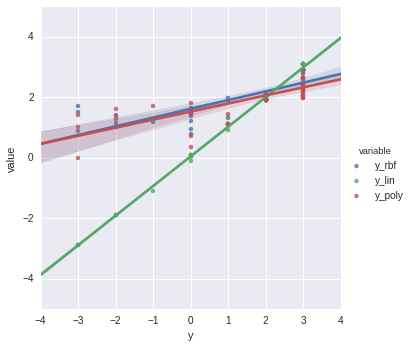

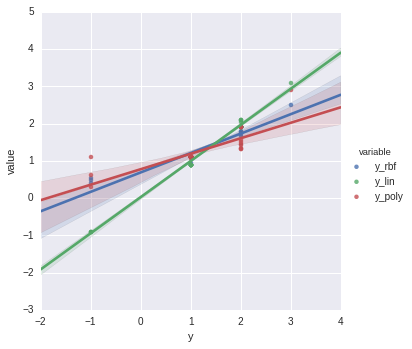

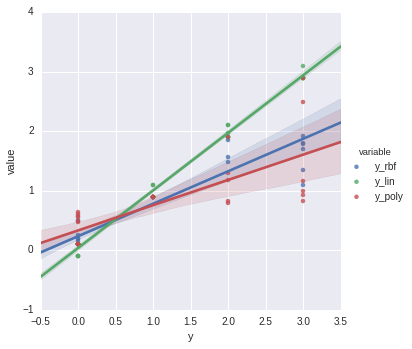

In [1374]:
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.feature_selection import RFE

y_ar=dfAll.iloc[18:,5]
X=DF['20s'].join(y_ar,how='inner')

cmpfeature=pd.DataFrame()
for sujet, Xnn in X.groupby('sujet'): 
    print(sujet)
    y=Xnn['arousal']
    Xn=Xnn.drop(['sujet','arousal'],axis=1)
    Xn=Xn[selectd_i]
    Xn=Xn.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
        #classification rate without feature selection:
            svr_rbf = SVR(kernel='rbf')
            svr_lin = SVR(kernel='linear')
            svr_poly = SVR(kernel='poly')
            y_rbf = svr_rbf.fit(Xn, y).predict(Xn)
            y_lin = svr_lin.fit(Xn, y).predict(Xn)
            y_poly = svr_poly.fit(Xn, y).predict(Xn)
            lmdf=pd.DataFrame({'y':y,'y_rbf':y_rbf,'y_lin':y_lin,'y_poly':y_poly})
            tmp=pd.melt(lmdf,id_vars=['y'], value_vars=['y_rbf','y_lin','y_poly'])
            g = sns.lmplot(x="y", y="value", hue="variable", data=tmp)

<a id='Individual regression'></a>
### Individual regression

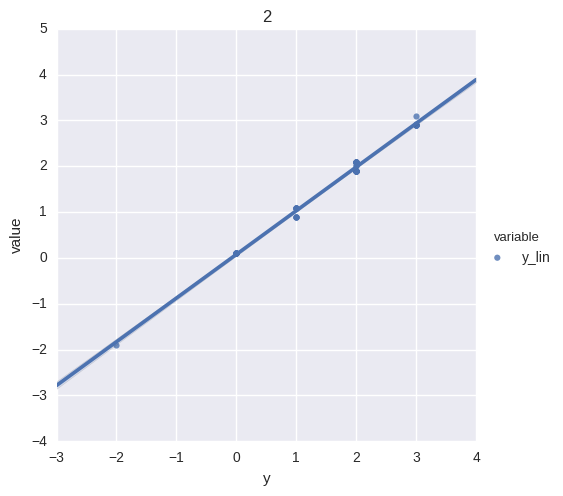

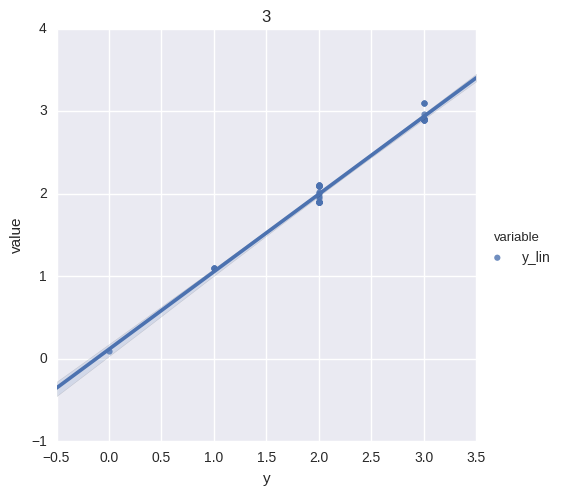

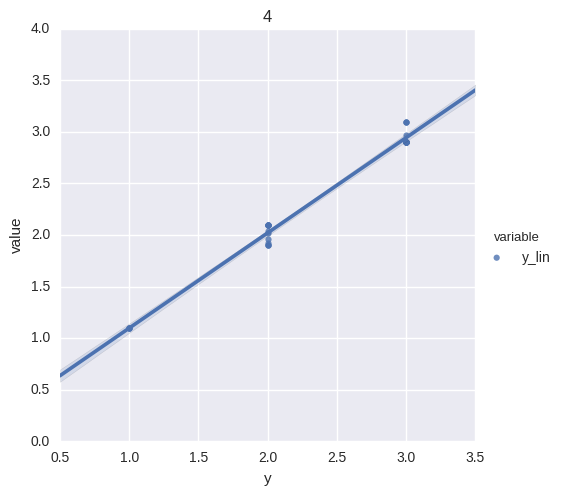

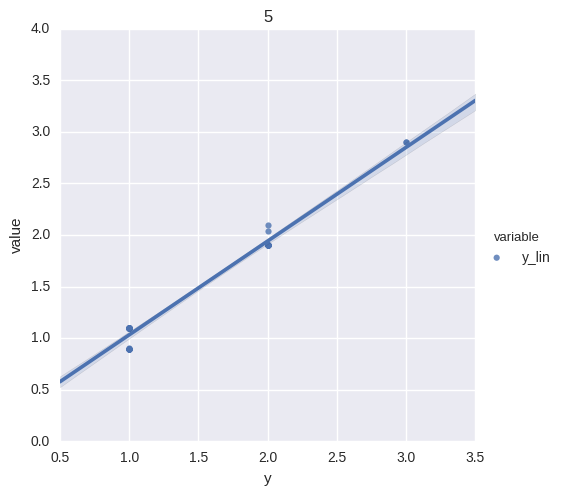

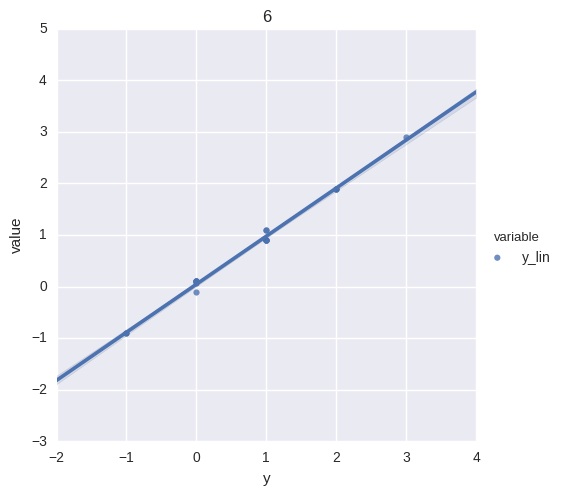

...

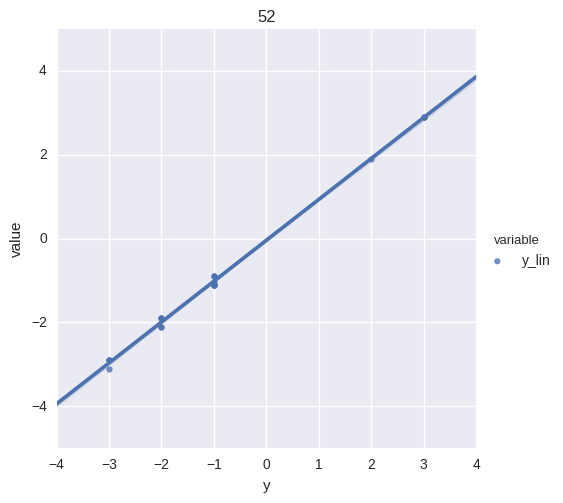

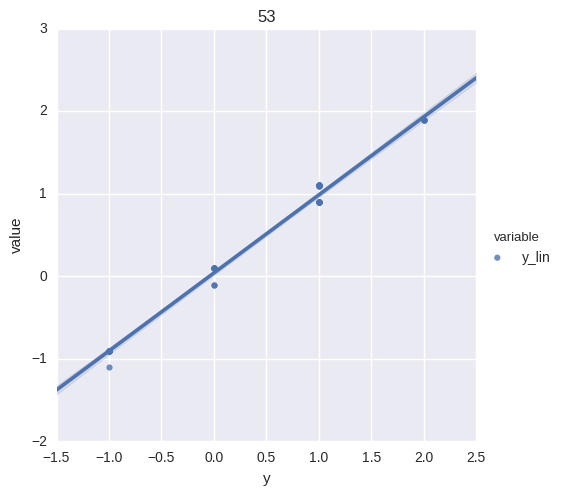

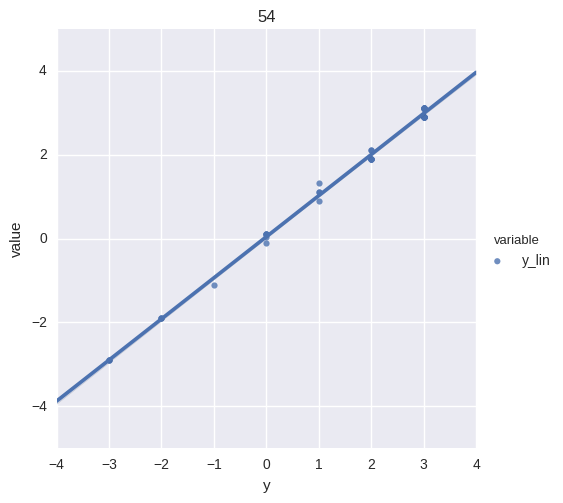

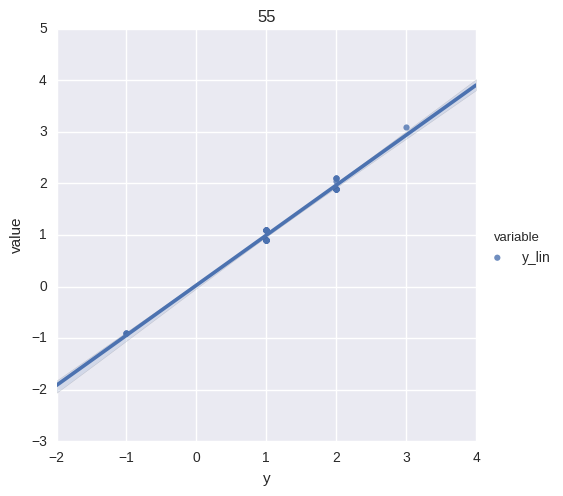

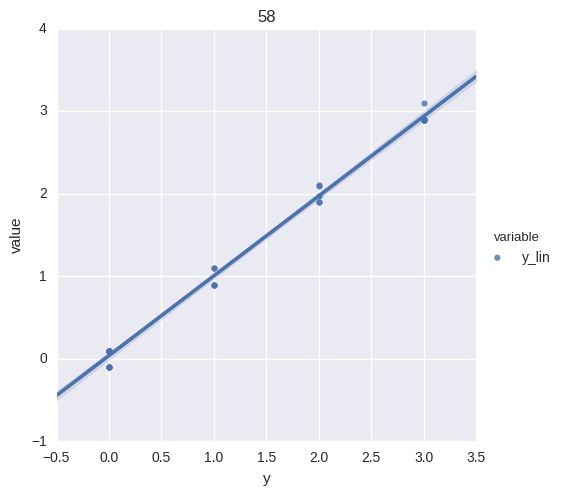

In [38]:
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.feature_selection import RFE


y_ar=dfAll.iloc[18:,5]
X=DF['20s'].join(y_ar,how='inner')

coeffdf=pd.DataFrame()
for sujet, Xnn in X.groupby('sujet'): 
    print(sujet)
    y=Xnn['arousal']
    Xn=Xnn.drop(['sujet','arousal'],axis=1)
    Xn=Xn[selected_i]
    Xn=Xn.dropna(axis=1,how='any')
    if len(Xn)<20: 
        continue
    else:
        #classification rate without feature selection:
            svr_lin = SVR(kernel='linear')
            y_lin = svr_lin.fit(Xn, y).predict(Xn)
            coeffc=pd.Series(svr_lin.coef_[0],name=sujet)
            coeffdf=pd.concat([coeffdf,coeffc],axis=1)
            lmdf=pd.DataFrame({'y':y,'y_lin':y_lin})
            tmp=pd.melt(lmdf,id_vars=['y'], value_vars=['y_lin'])
            g = sns.lmplot(x="y", y="value", hue="variable", data=tmp)
            sns.plt.title(str(sujet))

[back to Réunion 2016.12.02](#Réunion 2016.12.02)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f209a05db10>,
       <matplotlib.axes._subplots.AxesSubplot object at 0x7f20a58ddc10>], dtype=object)

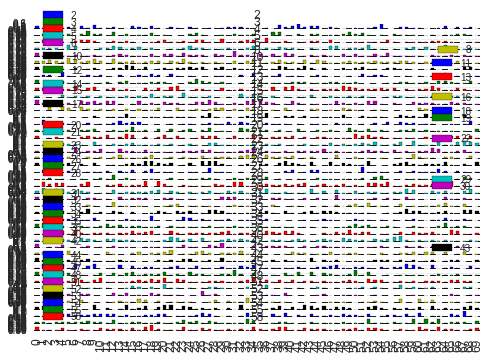

In [1408]:
 coeffdf.applymap(np.abs).plot(kind='bar',subplots=True)

# Sequence plot

In [67]:
sepevent.head()

,sujet,match,Absolute_sec,event,emotions,arousal,valence
18,2,1,38404,arret du gardien,frustration,2.0,-3.0
19,2,1,38495,arbitrage,colere,2.0,-1.0
20,2,1,38613,tir,peur,3.0,2.0
21,2,1,38851,rate,frustration,0.0,-1.0
22,2,1,38880,rate,frustration,2.0,-2.0


In [70]:
for sujet,X in sepevent.groupby('sujet'):
    sujet

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fb9944f96d0>,
       <matplotlib.axes._subplots.AxesSubplot object at 0x7fb99476bfd0>], dtype=object)

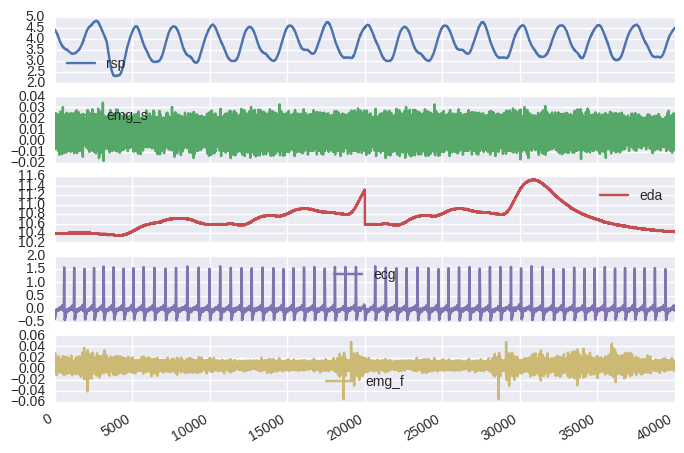

In [63]:
seqlen=20 # 10,14,20,30
sujet=2

path='./../'
baserep ='biopacBase'+str(seqlen)+'_random/'
beforerep = 'biopacBeforeEvent'+str(seqlen)+'s/'
eventrep ='biopacEvent'+str(seqlen)+'s/'

for sujet, X in sepevent.groupby('sujet'):
    
eventidx=18


filename='S_'+str(sujet)+'_'+str(eventidx)+'_.txt'
adffile=path+beforerep+filename
bdffile=path+eventrep+filename

adf=pd.read_csv(adffile,sep='\t',header=None,usecols=[0,1,3,6,7,9],names=['ts','rsp', 'emg_s','eda','ecg','emg_f'])
bdf=pd.read_csv(bdffile,sep='\t',header=None,usecols=[0,1,3,6,7,9],names=['ts','rsp', 'emg_s','eda','ecg','emg_f'])

df=pd.concat([adf,bdf]).reset_index(drop=True)
df.drop('ts',axis=1).plot(subplots=True)